# Afriat

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
torch.cuda.is_available()

False

In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "biolord_afriat.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)
adata

AnnData object with n_obs × n_vars = 19053 × 5000
    obs: 'mouse', 'experiment', 'time_int', 'time_cat', 'zone', 'status_control'

In [6]:
asdp_1 = adata.X.sum()

In [7]:
ratio_true=0.994

from tardis._utils.functions import create_random_mask
mask = create_random_mask(adata.shape[1], ratio_true=ratio_true, seed=2024)
adata.X[:, mask] = 0.0

In [8]:
asdp_2 = adata.X.sum()

In [9]:
mask.sum()/adata.shape[1],  1-asdp_2/asdp_1

(0.9948, 0.9940106463618577)

In [10]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|status_control",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 256,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|zone",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|time_cat",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|mouse",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [11]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "status_control",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    ),
    dict(
        obs_key = "time_cat",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    ),
    dict(
        obs_key = "zone",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [12]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(24 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.25,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=128,
    check_val_every_n_epoch=10,
    limit_train_batches=1.0, 
    limit_val_batches=1.0,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-4,
        weight_decay=1e-4,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['zone', 'status_control', 'time_cat', 'mouse']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    f"afriat_v2_4_ablation_{ratio_true}"
)

vae.save(
    dir_path,
    overwrite=True,
)

/home/icb/kemal.inecik/work/codes/tardis/tardis/_mymodel.py:81: UserWarning: This dataset has some empty cells, this might fail inference.Data should be filtered with `scanpy.pp.filter_cells()`
  library_log_means, library_log_vars = _init_library_size(self.adata_manager, n_batch)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: le7b9ll3
Name: galactic-jawa-145
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/le7b9ll3
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240504_155912-le7b9ll3/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: False, used: False


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..


`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `status_control` for `training` set. Number of elements in each group: 2582,3253,9408
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `time_cat` for `training` set. Number of elements in each group: 2582,2564,1679,3440,1640,3338
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `zone` for `training` set. Number of elements in each group: 4465,10778
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `status_control` for `validation` set. Number of elements in each group: 623,856,2331
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `time_cat` for `validation` set. Number of elements in each group: 623,638,429,850,409,861
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `zone` for `validation` set. Number of elements in each group: 1119,2691
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|          | 1/600 [00:13<2:18:47, 13.90s/it]

Epoch 1/600:   0%|          | 1/600 [00:13<2:18:47, 13.90s/it, v_num=l3_1, total_loss_train=53.9, kl_local_train=40.8]

Epoch 2/600:   0%|          | 1/600 [00:13<2:18:47, 13.90s/it, v_num=l3_1, total_loss_train=53.9, kl_local_train=40.8]

Epoch 2/600:   0%|          | 2/600 [00:26<2:12:38, 13.31s/it, v_num=l3_1, total_loss_train=53.9, kl_local_train=40.8]

Epoch 2/600:   0%|          | 2/600 [00:26<2:12:38, 13.31s/it, v_num=l3_1, total_loss_train=25.6, kl_local_train=65.1]

Epoch 3/600:   0%|          | 2/600 [00:26<2:12:38, 13.31s/it, v_num=l3_1, total_loss_train=25.6, kl_local_train=65.1]

Epoch 3/600:   0%|          | 3/600 [00:39<2:10:58, 13.16s/it, v_num=l3_1, total_loss_train=25.6, kl_local_train=65.1]

Epoch 3/600:   0%|          | 3/600 [00:39<2:10:58, 13.16s/it, v_num=l3_1, total_loss_train=20.9, kl_local_train=58]  

Epoch 4/600:   0%|          | 3/600 [00:39<2:10:58, 13.16s/it, v_num=l3_1, total_loss_train=20.9, kl_local_train=58]

Epoch 4/600:   1%|          | 4/600 [00:52<2:10:36, 13.15s/it, v_num=l3_1, total_loss_train=20.9, kl_local_train=58]

Epoch 4/600:   1%|          | 4/600 [00:52<2:10:36, 13.15s/it, v_num=l3_1, total_loss_train=19.8, kl_local_train=39]

Epoch 5/600:   1%|          | 4/600 [00:52<2:10:36, 13.15s/it, v_num=l3_1, total_loss_train=19.8, kl_local_train=39]

Epoch 5/600:   1%|          | 5/600 [01:05<2:10:04, 13.12s/it, v_num=l3_1, total_loss_train=19.8, kl_local_train=39]

Epoch 5/600:   1%|          | 5/600 [01:05<2:10:04, 13.12s/it, v_num=l3_1, total_loss_train=19.4, kl_local_train=20.2]

Epoch 6/600:   1%|          | 5/600 [01:07<2:10:04, 13.12s/it, v_num=l3_1, total_loss_train=19.4, kl_local_train=20.2]

Epoch 6/600:   1%|          | 6/600 [01:19<2:11:01, 13.23s/it, v_num=l3_1, total_loss_train=19.4, kl_local_train=20.2]

Epoch 6/600:   1%|          | 6/600 [01:19<2:11:01, 13.23s/it, v_num=l3_1, total_loss_train=19.1, kl_local_train=12, metric_mi|status_control_train=0.0206, metric_mi|zone_train=0.00793, metric_mi|time_cat_train=0.014, metric_mi|mouse_train=0.0361]

Epoch 7/600:   1%|          | 6/600 [01:19<2:11:01, 13.23s/it, v_num=l3_1, total_loss_train=19.1, kl_local_train=12, metric_mi|status_control_train=0.0206, metric_mi|zone_train=0.00793, metric_mi|time_cat_train=0.014, metric_mi|mouse_train=0.0361]

Epoch 7/600:   1%|          | 7/600 [01:31<2:07:41, 12.92s/it, v_num=l3_1, total_loss_train=19.1, kl_local_train=12, metric_mi|status_control_train=0.0206, metric_mi|zone_train=0.00793, metric_mi|time_cat_train=0.014, metric_mi|mouse_train=0.0361]

Epoch 7/600:   1%|          | 7/600 [01:31<2:07:41, 12.92s/it, v_num=l3_1, total_loss_train=18.8, kl_local_train=11.5, metric_mi|status_control_train=0.0206, metric_mi|zone_train=0.00793, metric_mi|time_cat_train=0.014, metric_mi|mouse_train=0.0361]

Epoch 8/600:   1%|          | 7/600 [01:31<2:07:41, 12.92s/it, v_num=l3_1, total_loss_train=18.8, kl_local_train=11.5, metric_mi|status_control_train=0.0206, metric_mi|zone_train=0.00793, metric_mi|time_cat_train=0.014, metric_mi|mouse_train=0.0361]

Epoch 8/600:   1%|▏         | 8/600 [01:43<2:04:58, 12.67s/it, v_num=l3_1, total_loss_train=18.8, kl_local_train=11.5, metric_mi|status_control_train=0.0206, metric_mi|zone_train=0.00793, metric_mi|time_cat_train=0.014, metric_mi|mouse_train=0.0361]

Epoch 8/600:   1%|▏         | 8/600 [01:43<2:04:58, 12.67s/it, v_num=l3_1, total_loss_train=26.3, kl_local_train=12, metric_mi|status_control_train=0.0206, metric_mi|zone_train=0.00793, metric_mi|time_cat_train=0.014, metric_mi|mouse_train=0.0361]  

Epoch 9/600:   1%|▏         | 8/600 [01:43<2:04:58, 12.67s/it, v_num=l3_1, total_loss_train=26.3, kl_local_train=12, metric_mi|status_control_train=0.0206, metric_mi|zone_train=0.00793, metric_mi|time_cat_train=0.014, metric_mi|mouse_train=0.0361]

Epoch 9/600:   2%|▏         | 9/600 [01:55<2:03:01, 12.49s/it, v_num=l3_1, total_loss_train=26.3, kl_local_train=12, metric_mi|status_control_train=0.0206, metric_mi|zone_train=0.00793, metric_mi|time_cat_train=0.014, metric_mi|mouse_train=0.0361]

Epoch 9/600:   2%|▏         | 9/600 [01:55<2:03:01, 12.49s/it, v_num=l3_1, total_loss_train=33.8, kl_local_train=19.7, metric_mi|status_control_train=0.0206, metric_mi|zone_train=0.00793, metric_mi|time_cat_train=0.014, metric_mi|mouse_train=0.0361]

Epoch 10/600:   2%|▏         | 9/600 [01:55<2:03:01, 12.49s/it, v_num=l3_1, total_loss_train=33.8, kl_local_train=19.7, metric_mi|status_control_train=0.0206, metric_mi|zone_train=0.00793, metric_mi|time_cat_train=0.014, metric_mi|mouse_train=0.0361]

Epoch 10/600:   2%|▏         | 10/600 [02:08<2:02:05, 12.42s/it, v_num=l3_1, total_loss_train=33.8, kl_local_train=19.7, metric_mi|status_control_train=0.0206, metric_mi|zone_train=0.00793, metric_mi|time_cat_train=0.014, metric_mi|mouse_train=0.0361]

Epoch 10/600:   2%|▏         | 10/600 [02:08<2:02:05, 12.42s/it, v_num=l3_1, total_loss_train=38.5, kl_local_train=55.6, metric_mi|status_control_train=0.0206, metric_mi|zone_train=0.00793, metric_mi|time_cat_train=0.014, metric_mi|mouse_train=0.0361]

Epoch 11/600:   2%|▏         | 10/600 [02:09<2:02:05, 12.42s/it, v_num=l3_1, total_loss_train=38.5, kl_local_train=55.6, metric_mi|status_control_train=0.0206, metric_mi|zone_train=0.00793, metric_mi|time_cat_train=0.014, metric_mi|mouse_train=0.0361]

Epoch 11/600:   2%|▏         | 11/600 [02:21<2:04:48, 12.71s/it, v_num=l3_1, total_loss_train=38.5, kl_local_train=55.6, metric_mi|status_control_train=0.0206, metric_mi|zone_train=0.00793, metric_mi|time_cat_train=0.014, metric_mi|mouse_train=0.0361]

Epoch 11/600:   2%|▏         | 11/600 [02:21<2:04:48, 12.71s/it, v_num=l3_1, total_loss_train=41.2, kl_local_train=89.8, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.0426, metric_mi|mouse_train=0.0546] 

Epoch 12/600:   2%|▏         | 11/600 [02:21<2:04:48, 12.71s/it, v_num=l3_1, total_loss_train=41.2, kl_local_train=89.8, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.0426, metric_mi|mouse_train=0.0546]

Epoch 12/600:   2%|▏         | 12/600 [02:33<2:02:50, 12.54s/it, v_num=l3_1, total_loss_train=41.2, kl_local_train=89.8, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.0426, metric_mi|mouse_train=0.0546]

Epoch 12/600:   2%|▏         | 12/600 [02:33<2:02:50, 12.54s/it, v_num=l3_1, total_loss_train=45.2, kl_local_train=93.6, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.0426, metric_mi|mouse_train=0.0546]

Epoch 13/600:   2%|▏         | 12/600 [02:33<2:02:50, 12.54s/it, v_num=l3_1, total_loss_train=45.2, kl_local_train=93.6, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.0426, metric_mi|mouse_train=0.0546]

Epoch 13/600:   2%|▏         | 13/600 [02:45<2:01:33, 12.42s/it, v_num=l3_1, total_loss_train=45.2, kl_local_train=93.6, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.0426, metric_mi|mouse_train=0.0546]

Epoch 13/600:   2%|▏         | 13/600 [02:45<2:01:33, 12.42s/it, v_num=l3_1, total_loss_train=48.5, kl_local_train=120, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.0426, metric_mi|mouse_train=0.0546] 

Epoch 14/600:   2%|▏         | 13/600 [02:45<2:01:33, 12.42s/it, v_num=l3_1, total_loss_train=48.5, kl_local_train=120, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.0426, metric_mi|mouse_train=0.0546]

Epoch 14/600:   2%|▏         | 14/600 [02:58<2:00:36, 12.35s/it, v_num=l3_1, total_loss_train=48.5, kl_local_train=120, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.0426, metric_mi|mouse_train=0.0546]

Epoch 14/600:   2%|▏         | 14/600 [02:58<2:00:36, 12.35s/it, v_num=l3_1, total_loss_train=52.3, kl_local_train=132, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.0426, metric_mi|mouse_train=0.0546]

Epoch 15/600:   2%|▏         | 14/600 [02:58<2:00:36, 12.35s/it, v_num=l3_1, total_loss_train=52.3, kl_local_train=132, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.0426, metric_mi|mouse_train=0.0546]

Epoch 15/600:   2%|▎         | 15/600 [03:10<2:00:20, 12.34s/it, v_num=l3_1, total_loss_train=52.3, kl_local_train=132, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.0426, metric_mi|mouse_train=0.0546]

Epoch 15/600:   2%|▎         | 15/600 [03:10<2:00:20, 12.34s/it, v_num=l3_1, total_loss_train=56.2, kl_local_train=138, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.0426, metric_mi|mouse_train=0.0546]

Epoch 16/600:   2%|▎         | 15/600 [03:11<2:00:20, 12.34s/it, v_num=l3_1, total_loss_train=56.2, kl_local_train=138, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.0426, metric_mi|mouse_train=0.0546]

Epoch 16/600:   3%|▎         | 16/600 [03:24<2:03:54, 12.73s/it, v_num=l3_1, total_loss_train=56.2, kl_local_train=138, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.0426, metric_mi|mouse_train=0.0546]

Epoch 16/600:   3%|▎         | 16/600 [03:24<2:03:54, 12.73s/it, v_num=l3_1, total_loss_train=60.2, kl_local_train=139, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]      

Epoch 17/600:   3%|▎         | 16/600 [03:24<2:03:54, 12.73s/it, v_num=l3_1, total_loss_train=60.2, kl_local_train=139, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 17/600:   3%|▎         | 17/600 [03:36<2:02:02, 12.56s/it, v_num=l3_1, total_loss_train=60.2, kl_local_train=139, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 17/600:   3%|▎         | 17/600 [03:36<2:02:02, 12.56s/it, v_num=l3_1, total_loss_train=64.4, kl_local_train=139, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 18/600:   3%|▎         | 17/600 [03:36<2:02:02, 12.56s/it, v_num=l3_1, total_loss_train=64.4, kl_local_train=139, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 18/600:   3%|▎         | 18/600 [03:48<2:00:54, 12.46s/it, v_num=l3_1, total_loss_train=64.4, kl_local_train=139, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 18/600:   3%|▎         | 18/600 [03:48<2:00:54, 12.46s/it, v_num=l3_1, total_loss_train=68.5, kl_local_train=133, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 19/600:   3%|▎         | 18/600 [03:48<2:00:54, 12.46s/it, v_num=l3_1, total_loss_train=68.5, kl_local_train=133, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 19/600:   3%|▎         | 19/600 [04:00<1:59:56, 12.39s/it, v_num=l3_1, total_loss_train=68.5, kl_local_train=133, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 19/600:   3%|▎         | 19/600 [04:00<1:59:56, 12.39s/it, v_num=l3_1, total_loss_train=72.7, kl_local_train=137, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 20/600:   3%|▎         | 19/600 [04:00<1:59:56, 12.39s/it, v_num=l3_1, total_loss_train=72.7, kl_local_train=137, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 20/600:   3%|▎         | 20/600 [04:12<1:59:15, 12.34s/it, v_num=l3_1, total_loss_train=72.7, kl_local_train=137, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 20/600:   3%|▎         | 20/600 [04:12<1:59:15, 12.34s/it, v_num=l3_1, total_loss_train=76.9, kl_local_train=139, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 21/600:   3%|▎         | 20/600 [04:14<1:59:15, 12.34s/it, v_num=l3_1, total_loss_train=76.9, kl_local_train=139, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 21/600:   4%|▎         | 21/600 [04:26<2:02:27, 12.69s/it, v_num=l3_1, total_loss_train=76.9, kl_local_train=139, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 21/600:   4%|▎         | 21/600 [04:26<2:02:27, 12.69s/it, v_num=l3_1, total_loss_train=81.1, kl_local_train=138, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 22/600:   4%|▎         | 21/600 [04:26<2:02:27, 12.69s/it, v_num=l3_1, total_loss_train=81.1, kl_local_train=138, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 22/600:   4%|▎         | 22/600 [04:38<2:00:30, 12.51s/it, v_num=l3_1, total_loss_train=81.1, kl_local_train=138, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 22/600:   4%|▎         | 22/600 [04:38<2:00:30, 12.51s/it, v_num=l3_1, total_loss_train=85.4, kl_local_train=138, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 23/600:   4%|▎         | 22/600 [04:38<2:00:30, 12.51s/it, v_num=l3_1, total_loss_train=85.4, kl_local_train=138, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 23/600:   4%|▍         | 23/600 [04:50<1:59:20, 12.41s/it, v_num=l3_1, total_loss_train=85.4, kl_local_train=138, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 23/600:   4%|▍         | 23/600 [04:50<1:59:20, 12.41s/it, v_num=l3_1, total_loss_train=89.5, kl_local_train=139, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 24/600:   4%|▍         | 23/600 [04:50<1:59:20, 12.41s/it, v_num=l3_1, total_loss_train=89.5, kl_local_train=139, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 24/600:   4%|▍         | 24/600 [05:02<1:58:36, 12.36s/it, v_num=l3_1, total_loss_train=89.5, kl_local_train=139, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 24/600:   4%|▍         | 24/600 [05:02<1:58:36, 12.36s/it, v_num=l3_1, total_loss_train=93.8, kl_local_train=141, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 25/600:   4%|▍         | 24/600 [05:02<1:58:36, 12.36s/it, v_num=l3_1, total_loss_train=93.8, kl_local_train=141, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 25/600:   4%|▍         | 25/600 [05:15<1:58:21, 12.35s/it, v_num=l3_1, total_loss_train=93.8, kl_local_train=141, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 25/600:   4%|▍         | 25/600 [05:15<1:58:21, 12.35s/it, v_num=l3_1, total_loss_train=98, kl_local_train=145, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]  

Epoch 26/600:   4%|▍         | 25/600 [05:16<1:58:21, 12.35s/it, v_num=l3_1, total_loss_train=98, kl_local_train=145, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 26/600:   4%|▍         | 26/600 [05:28<2:01:40, 12.72s/it, v_num=l3_1, total_loss_train=98, kl_local_train=145, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 26/600:   4%|▍         | 26/600 [05:28<2:01:40, 12.72s/it, v_num=l3_1, total_loss_train=102, kl_local_train=146, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 27/600:   4%|▍         | 26/600 [05:28<2:01:40, 12.72s/it, v_num=l3_1, total_loss_train=102, kl_local_train=146, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 27/600:   4%|▍         | 27/600 [05:41<2:00:10, 12.58s/it, v_num=l3_1, total_loss_train=102, kl_local_train=146, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 27/600:   4%|▍         | 27/600 [05:41<2:00:10, 12.58s/it, v_num=l3_1, total_loss_train=106, kl_local_train=144, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 28/600:   4%|▍         | 27/600 [05:41<2:00:10, 12.58s/it, v_num=l3_1, total_loss_train=106, kl_local_train=144, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 28/600:   5%|▍         | 28/600 [05:53<1:58:48, 12.46s/it, v_num=l3_1, total_loss_train=106, kl_local_train=144, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 28/600:   5%|▍         | 28/600 [05:53<1:58:48, 12.46s/it, v_num=l3_1, total_loss_train=111, kl_local_train=143, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 29/600:   5%|▍         | 28/600 [05:53<1:58:48, 12.46s/it, v_num=l3_1, total_loss_train=111, kl_local_train=143, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 29/600:   5%|▍         | 29/600 [06:05<1:57:54, 12.39s/it, v_num=l3_1, total_loss_train=111, kl_local_train=143, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 29/600:   5%|▍         | 29/600 [06:05<1:57:54, 12.39s/it, v_num=l3_1, total_loss_train=115, kl_local_train=146, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 30/600:   5%|▍         | 29/600 [06:05<1:57:54, 12.39s/it, v_num=l3_1, total_loss_train=115, kl_local_train=146, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 30/600:   5%|▌         | 30/600 [06:17<1:57:14, 12.34s/it, v_num=l3_1, total_loss_train=115, kl_local_train=146, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 30/600:   5%|▌         | 30/600 [06:17<1:57:14, 12.34s/it, v_num=l3_1, total_loss_train=119, kl_local_train=148, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 31/600:   5%|▌         | 30/600 [06:19<1:57:14, 12.34s/it, v_num=l3_1, total_loss_train=119, kl_local_train=148, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 31/600:   5%|▌         | 31/600 [06:31<2:00:35, 12.72s/it, v_num=l3_1, total_loss_train=119, kl_local_train=148, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 31/600:   5%|▌         | 31/600 [06:31<2:00:35, 12.72s/it, v_num=l3_1, total_loss_train=123, kl_local_train=149, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136] 

Epoch 32/600:   5%|▌         | 31/600 [06:31<2:00:35, 12.72s/it, v_num=l3_1, total_loss_train=123, kl_local_train=149, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 32/600:   5%|▌         | 32/600 [06:43<1:59:01, 12.57s/it, v_num=l3_1, total_loss_train=123, kl_local_train=149, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 32/600:   5%|▌         | 32/600 [06:43<1:59:01, 12.57s/it, v_num=l3_1, total_loss_train=128, kl_local_train=148, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 33/600:   5%|▌         | 32/600 [06:43<1:59:01, 12.57s/it, v_num=l3_1, total_loss_train=128, kl_local_train=148, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 33/600:   6%|▌         | 33/600 [06:55<1:57:44, 12.46s/it, v_num=l3_1, total_loss_train=128, kl_local_train=148, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 33/600:   6%|▌         | 33/600 [06:55<1:57:44, 12.46s/it, v_num=l3_1, total_loss_train=132, kl_local_train=149, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 34/600:   6%|▌         | 33/600 [06:55<1:57:44, 12.46s/it, v_num=l3_1, total_loss_train=132, kl_local_train=149, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 34/600:   6%|▌         | 34/600 [07:08<1:57:13, 12.43s/it, v_num=l3_1, total_loss_train=132, kl_local_train=149, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 34/600:   6%|▌         | 34/600 [07:08<1:57:13, 12.43s/it, v_num=l3_1, total_loss_train=136, kl_local_train=150, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 35/600:   6%|▌         | 34/600 [07:08<1:57:13, 12.43s/it, v_num=l3_1, total_loss_train=136, kl_local_train=150, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 35/600:   6%|▌         | 35/600 [07:20<1:57:12, 12.45s/it, v_num=l3_1, total_loss_train=136, kl_local_train=150, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 35/600:   6%|▌         | 35/600 [07:20<1:57:12, 12.45s/it, v_num=l3_1, total_loss_train=141, kl_local_train=152, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 36/600:   6%|▌         | 35/600 [07:21<1:57:12, 12.45s/it, v_num=l3_1, total_loss_train=141, kl_local_train=152, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 36/600:   6%|▌         | 36/600 [07:34<2:00:18, 12.80s/it, v_num=l3_1, total_loss_train=141, kl_local_train=152, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 36/600:   6%|▌         | 36/600 [07:34<2:00:18, 12.80s/it, v_num=l3_1, total_loss_train=145, kl_local_train=147, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 37/600:   6%|▌         | 36/600 [07:34<2:00:18, 12.80s/it, v_num=l3_1, total_loss_train=145, kl_local_train=147, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 37/600:   6%|▌         | 37/600 [07:46<1:58:53, 12.67s/it, v_num=l3_1, total_loss_train=145, kl_local_train=147, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 37/600:   6%|▌         | 37/600 [07:46<1:58:53, 12.67s/it, v_num=l3_1, total_loss_train=149, kl_local_train=150, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 38/600:   6%|▌         | 37/600 [07:46<1:58:53, 12.67s/it, v_num=l3_1, total_loss_train=149, kl_local_train=150, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 38/600:   6%|▋         | 38/600 [07:58<1:57:37, 12.56s/it, v_num=l3_1, total_loss_train=149, kl_local_train=150, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 38/600:   6%|▋         | 38/600 [07:58<1:57:37, 12.56s/it, v_num=l3_1, total_loss_train=153, kl_local_train=150, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 39/600:   6%|▋         | 38/600 [07:58<1:57:37, 12.56s/it, v_num=l3_1, total_loss_train=153, kl_local_train=150, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 39/600:   6%|▋         | 39/600 [08:11<1:56:33, 12.47s/it, v_num=l3_1, total_loss_train=153, kl_local_train=150, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 39/600:   6%|▋         | 39/600 [08:11<1:56:33, 12.47s/it, v_num=l3_1, total_loss_train=157, kl_local_train=151, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 40/600:   6%|▋         | 39/600 [08:11<1:56:33, 12.47s/it, v_num=l3_1, total_loss_train=157, kl_local_train=151, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 40/600:   7%|▋         | 40/600 [08:23<1:56:02, 12.43s/it, v_num=l3_1, total_loss_train=157, kl_local_train=151, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 40/600:   7%|▋         | 40/600 [08:23<1:56:02, 12.43s/it, v_num=l3_1, total_loss_train=162, kl_local_train=150, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 41/600:   7%|▋         | 40/600 [08:24<1:56:02, 12.43s/it, v_num=l3_1, total_loss_train=162, kl_local_train=150, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 41/600:   7%|▋         | 41/600 [08:36<1:59:01, 12.78s/it, v_num=l3_1, total_loss_train=162, kl_local_train=150, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 41/600:   7%|▋         | 41/600 [08:36<1:59:01, 12.78s/it, v_num=l3_1, total_loss_train=166, kl_local_train=152, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139] 

Epoch 42/600:   7%|▋         | 41/600 [08:37<1:59:01, 12.78s/it, v_num=l3_1, total_loss_train=166, kl_local_train=152, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 42/600:   7%|▋         | 42/600 [08:49<1:57:21, 12.62s/it, v_num=l3_1, total_loss_train=166, kl_local_train=152, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 42/600:   7%|▋         | 42/600 [08:49<1:57:21, 12.62s/it, v_num=l3_1, total_loss_train=170, kl_local_train=151, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 43/600:   7%|▋         | 42/600 [08:49<1:57:21, 12.62s/it, v_num=l3_1, total_loss_train=170, kl_local_train=151, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 43/600:   7%|▋         | 43/600 [09:01<1:56:10, 12.51s/it, v_num=l3_1, total_loss_train=170, kl_local_train=151, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 43/600:   7%|▋         | 43/600 [09:01<1:56:10, 12.51s/it, v_num=l3_1, total_loss_train=174, kl_local_train=153, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 44/600:   7%|▋         | 43/600 [09:01<1:56:10, 12.51s/it, v_num=l3_1, total_loss_train=174, kl_local_train=153, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 44/600:   7%|▋         | 44/600 [09:13<1:55:23, 12.45s/it, v_num=l3_1, total_loss_train=174, kl_local_train=153, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 44/600:   7%|▋         | 44/600 [09:13<1:55:23, 12.45s/it, v_num=l3_1, total_loss_train=179, kl_local_train=152, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 45/600:   7%|▋         | 44/600 [09:13<1:55:23, 12.45s/it, v_num=l3_1, total_loss_train=179, kl_local_train=152, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 45/600:   8%|▊         | 45/600 [09:26<1:55:37, 12.50s/it, v_num=l3_1, total_loss_train=179, kl_local_train=152, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 45/600:   8%|▊         | 45/600 [09:26<1:55:37, 12.50s/it, v_num=l3_1, total_loss_train=183, kl_local_train=154, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 46/600:   8%|▊         | 45/600 [09:27<1:55:37, 12.50s/it, v_num=l3_1, total_loss_train=183, kl_local_train=154, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 46/600:   8%|▊         | 46/600 [09:40<1:58:35, 12.84s/it, v_num=l3_1, total_loss_train=183, kl_local_train=154, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 46/600:   8%|▊         | 46/600 [09:40<1:58:35, 12.84s/it, v_num=l3_1, total_loss_train=187, kl_local_train=154, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 47/600:   8%|▊         | 46/600 [09:40<1:58:35, 12.84s/it, v_num=l3_1, total_loss_train=187, kl_local_train=154, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 47/600:   8%|▊         | 47/600 [09:52<1:57:03, 12.70s/it, v_num=l3_1, total_loss_train=187, kl_local_train=154, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 47/600:   8%|▊         | 47/600 [09:52<1:57:03, 12.70s/it, v_num=l3_1, total_loss_train=191, kl_local_train=156, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 48/600:   8%|▊         | 47/600 [09:52<1:57:03, 12.70s/it, v_num=l3_1, total_loss_train=191, kl_local_train=156, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 48/600:   8%|▊         | 48/600 [10:06<2:01:43, 13.23s/it, v_num=l3_1, total_loss_train=191, kl_local_train=156, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 48/600:   8%|▊         | 48/600 [10:06<2:01:43, 13.23s/it, v_num=l3_1, total_loss_train=196, kl_local_train=156, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 49/600:   8%|▊         | 48/600 [10:06<2:01:43, 13.23s/it, v_num=l3_1, total_loss_train=196, kl_local_train=156, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 49/600:   8%|▊         | 49/600 [10:21<2:04:49, 13.59s/it, v_num=l3_1, total_loss_train=196, kl_local_train=156, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 49/600:   8%|▊         | 49/600 [10:21<2:04:49, 13.59s/it, v_num=l3_1, total_loss_train=200, kl_local_train=154, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 50/600:   8%|▊         | 49/600 [10:21<2:04:49, 13.59s/it, v_num=l3_1, total_loss_train=200, kl_local_train=154, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 50/600:   8%|▊         | 50/600 [10:36<2:07:38, 13.92s/it, v_num=l3_1, total_loss_train=200, kl_local_train=154, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 50/600:   8%|▊         | 50/600 [10:36<2:07:38, 13.92s/it, v_num=l3_1, total_loss_train=204, kl_local_train=153, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 51/600:   8%|▊         | 50/600 [10:37<2:07:38, 13.92s/it, v_num=l3_1, total_loss_train=204, kl_local_train=153, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 51/600:   8%|▊         | 51/600 [10:51<2:12:39, 14.50s/it, v_num=l3_1, total_loss_train=204, kl_local_train=153, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 51/600:   8%|▊         | 51/600 [10:51<2:12:39, 14.50s/it, v_num=l3_1, total_loss_train=204, kl_local_train=153, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14] 

Epoch 52/600:   8%|▊         | 51/600 [10:51<2:12:39, 14.50s/it, v_num=l3_1, total_loss_train=204, kl_local_train=153, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 52/600:   9%|▊         | 52/600 [11:06<2:12:32, 14.51s/it, v_num=l3_1, total_loss_train=204, kl_local_train=153, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 52/600:   9%|▊         | 52/600 [11:06<2:12:32, 14.51s/it, v_num=l3_1, total_loss_train=204, kl_local_train=153, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 53/600:   9%|▊         | 52/600 [11:06<2:12:32, 14.51s/it, v_num=l3_1, total_loss_train=204, kl_local_train=153, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 53/600:   9%|▉         | 53/600 [11:20<2:12:25, 14.53s/it, v_num=l3_1, total_loss_train=204, kl_local_train=153, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 53/600:   9%|▉         | 53/600 [11:20<2:12:25, 14.53s/it, v_num=l3_1, total_loss_train=204, kl_local_train=152, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 54/600:   9%|▉         | 53/600 [11:21<2:12:25, 14.53s/it, v_num=l3_1, total_loss_train=204, kl_local_train=152, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 54/600:   9%|▉         | 54/600 [11:35<2:12:08, 14.52s/it, v_num=l3_1, total_loss_train=204, kl_local_train=152, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 54/600:   9%|▉         | 54/600 [11:35<2:12:08, 14.52s/it, v_num=l3_1, total_loss_train=205, kl_local_train=153, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 55/600:   9%|▉         | 54/600 [11:35<2:12:08, 14.52s/it, v_num=l3_1, total_loss_train=205, kl_local_train=153, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 55/600:   9%|▉         | 55/600 [11:50<2:12:18, 14.57s/it, v_num=l3_1, total_loss_train=205, kl_local_train=153, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 55/600:   9%|▉         | 55/600 [11:50<2:12:18, 14.57s/it, v_num=l3_1, total_loss_train=205, kl_local_train=151, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 56/600:   9%|▉         | 55/600 [11:51<2:12:18, 14.57s/it, v_num=l3_1, total_loss_train=205, kl_local_train=151, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 56/600:   9%|▉         | 56/600 [12:06<2:16:27, 15.05s/it, v_num=l3_1, total_loss_train=205, kl_local_train=151, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 56/600:   9%|▉         | 56/600 [12:06<2:16:27, 15.05s/it, v_num=l3_1, total_loss_train=205, kl_local_train=146, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 57/600:   9%|▉         | 56/600 [12:06<2:16:27, 15.05s/it, v_num=l3_1, total_loss_train=205, kl_local_train=146, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 57/600:  10%|▉         | 57/600 [12:20<2:14:44, 14.89s/it, v_num=l3_1, total_loss_train=205, kl_local_train=146, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 57/600:  10%|▉         | 57/600 [12:20<2:14:44, 14.89s/it, v_num=l3_1, total_loss_train=205, kl_local_train=148, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 58/600:  10%|▉         | 57/600 [12:20<2:14:44, 14.89s/it, v_num=l3_1, total_loss_train=205, kl_local_train=148, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 58/600:  10%|▉         | 58/600 [12:35<2:13:17, 14.76s/it, v_num=l3_1, total_loss_train=205, kl_local_train=148, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 58/600:  10%|▉         | 58/600 [12:35<2:13:17, 14.76s/it, v_num=l3_1, total_loss_train=205, kl_local_train=145, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 59/600:  10%|▉         | 58/600 [12:35<2:13:17, 14.76s/it, v_num=l3_1, total_loss_train=205, kl_local_train=145, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 59/600:  10%|▉         | 59/600 [12:49<2:12:30, 14.70s/it, v_num=l3_1, total_loss_train=205, kl_local_train=145, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 59/600:  10%|▉         | 59/600 [12:49<2:12:30, 14.70s/it, v_num=l3_1, total_loss_train=205, kl_local_train=145, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 60/600:  10%|▉         | 59/600 [12:49<2:12:30, 14.70s/it, v_num=l3_1, total_loss_train=205, kl_local_train=145, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 60/600:  10%|█         | 60/600 [13:04<2:12:11, 14.69s/it, v_num=l3_1, total_loss_train=205, kl_local_train=145, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 60/600:  10%|█         | 60/600 [13:04<2:12:11, 14.69s/it, v_num=l3_1, total_loss_train=205, kl_local_train=145, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 61/600:  10%|█         | 60/600 [13:05<2:12:11, 14.69s/it, v_num=l3_1, total_loss_train=205, kl_local_train=145, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 61/600:  10%|█         | 61/600 [13:20<2:15:21, 15.07s/it, v_num=l3_1, total_loss_train=205, kl_local_train=145, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 61/600:  10%|█         | 61/600 [13:20<2:15:21, 15.07s/it, v_num=l3_1, total_loss_train=205, kl_local_train=143, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 62/600:  10%|█         | 61/600 [13:20<2:15:21, 15.07s/it, v_num=l3_1, total_loss_train=205, kl_local_train=143, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 62/600:  10%|█         | 62/600 [13:35<2:13:48, 14.92s/it, v_num=l3_1, total_loss_train=205, kl_local_train=143, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 62/600:  10%|█         | 62/600 [13:35<2:13:48, 14.92s/it, v_num=l3_1, total_loss_train=205, kl_local_train=145, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 63/600:  10%|█         | 62/600 [13:35<2:13:48, 14.92s/it, v_num=l3_1, total_loss_train=205, kl_local_train=145, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 63/600:  10%|█         | 63/600 [13:49<2:12:21, 14.79s/it, v_num=l3_1, total_loss_train=205, kl_local_train=145, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 63/600:  10%|█         | 63/600 [13:49<2:12:21, 14.79s/it, v_num=l3_1, total_loss_train=205, kl_local_train=141, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 64/600:  10%|█         | 63/600 [13:49<2:12:21, 14.79s/it, v_num=l3_1, total_loss_train=205, kl_local_train=141, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 64/600:  11%|█         | 64/600 [14:04<2:11:21, 14.70s/it, v_num=l3_1, total_loss_train=205, kl_local_train=141, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 64/600:  11%|█         | 64/600 [14:04<2:11:21, 14.70s/it, v_num=l3_1, total_loss_train=205, kl_local_train=140, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 65/600:  11%|█         | 64/600 [14:04<2:11:21, 14.70s/it, v_num=l3_1, total_loss_train=205, kl_local_train=140, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 65/600:  11%|█         | 65/600 [14:18<2:10:42, 14.66s/it, v_num=l3_1, total_loss_train=205, kl_local_train=140, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 65/600:  11%|█         | 65/600 [14:18<2:10:42, 14.66s/it, v_num=l3_1, total_loss_train=205, kl_local_train=140, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 66/600:  11%|█         | 65/600 [14:20<2:10:42, 14.66s/it, v_num=l3_1, total_loss_train=205, kl_local_train=140, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 66/600:  11%|█         | 66/600 [14:34<2:13:43, 15.03s/it, v_num=l3_1, total_loss_train=205, kl_local_train=140, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 66/600:  11%|█         | 66/600 [14:34<2:13:43, 15.03s/it, v_num=l3_1, total_loss_train=206, kl_local_train=140, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 67/600:  11%|█         | 66/600 [14:34<2:13:43, 15.03s/it, v_num=l3_1, total_loss_train=206, kl_local_train=140, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 67/600:  11%|█         | 67/600 [14:48<2:09:34, 14.59s/it, v_num=l3_1, total_loss_train=206, kl_local_train=140, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 67/600:  11%|█         | 67/600 [14:48<2:09:34, 14.59s/it, v_num=l3_1, total_loss_train=206, kl_local_train=137, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 68/600:  11%|█         | 67/600 [14:48<2:09:34, 14.59s/it, v_num=l3_1, total_loss_train=206, kl_local_train=137, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 68/600:  11%|█▏        | 68/600 [15:00<2:03:48, 13.96s/it, v_num=l3_1, total_loss_train=206, kl_local_train=137, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 68/600:  11%|█▏        | 68/600 [15:00<2:03:48, 13.96s/it, v_num=l3_1, total_loss_train=206, kl_local_train=139, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 69/600:  11%|█▏        | 68/600 [15:00<2:03:48, 13.96s/it, v_num=l3_1, total_loss_train=206, kl_local_train=139, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 69/600:  12%|█▏        | 69/600 [15:12<1:59:27, 13.50s/it, v_num=l3_1, total_loss_train=206, kl_local_train=139, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 69/600:  12%|█▏        | 69/600 [15:12<1:59:27, 13.50s/it, v_num=l3_1, total_loss_train=206, kl_local_train=138, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 70/600:  12%|█▏        | 69/600 [15:12<1:59:27, 13.50s/it, v_num=l3_1, total_loss_train=206, kl_local_train=138, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 70/600:  12%|█▏        | 70/600 [15:25<1:56:41, 13.21s/it, v_num=l3_1, total_loss_train=206, kl_local_train=138, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 70/600:  12%|█▏        | 70/600 [15:25<1:56:41, 13.21s/it, v_num=l3_1, total_loss_train=206, kl_local_train=135, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 71/600:  12%|█▏        | 70/600 [15:26<1:56:41, 13.21s/it, v_num=l3_1, total_loss_train=206, kl_local_train=135, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 71/600:  12%|█▏        | 71/600 [15:39<1:58:27, 13.44s/it, v_num=l3_1, total_loss_train=206, kl_local_train=135, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 71/600:  12%|█▏        | 71/600 [15:39<1:58:27, 13.44s/it, v_num=l3_1, total_loss_train=206, kl_local_train=135, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14] 

Epoch 72/600:  12%|█▏        | 71/600 [15:39<1:58:27, 13.44s/it, v_num=l3_1, total_loss_train=206, kl_local_train=135, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 72/600:  12%|█▏        | 72/600 [15:52<1:55:55, 13.17s/it, v_num=l3_1, total_loss_train=206, kl_local_train=135, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 72/600:  12%|█▏        | 72/600 [15:52<1:55:55, 13.17s/it, v_num=l3_1, total_loss_train=206, kl_local_train=135, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 73/600:  12%|█▏        | 72/600 [15:52<1:55:55, 13.17s/it, v_num=l3_1, total_loss_train=206, kl_local_train=135, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 73/600:  12%|█▏        | 73/600 [16:04<1:53:27, 12.92s/it, v_num=l3_1, total_loss_train=206, kl_local_train=135, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 73/600:  12%|█▏        | 73/600 [16:04<1:53:27, 12.92s/it, v_num=l3_1, total_loss_train=206, kl_local_train=135, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 74/600:  12%|█▏        | 73/600 [16:04<1:53:27, 12.92s/it, v_num=l3_1, total_loss_train=206, kl_local_train=135, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 74/600:  12%|█▏        | 74/600 [16:16<1:51:40, 12.74s/it, v_num=l3_1, total_loss_train=206, kl_local_train=135, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 74/600:  12%|█▏        | 74/600 [16:16<1:51:40, 12.74s/it, v_num=l3_1, total_loss_train=206, kl_local_train=133, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 75/600:  12%|█▏        | 74/600 [16:16<1:51:40, 12.74s/it, v_num=l3_1, total_loss_train=206, kl_local_train=133, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 75/600:  12%|█▎        | 75/600 [16:29<1:50:44, 12.66s/it, v_num=l3_1, total_loss_train=206, kl_local_train=133, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 75/600:  12%|█▎        | 75/600 [16:29<1:50:44, 12.66s/it, v_num=l3_1, total_loss_train=207, kl_local_train=132, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 76/600:  12%|█▎        | 75/600 [16:30<1:50:44, 12.66s/it, v_num=l3_1, total_loss_train=207, kl_local_train=132, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 76/600:  13%|█▎        | 76/600 [16:42<1:53:18, 12.97s/it, v_num=l3_1, total_loss_train=207, kl_local_train=132, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 76/600:  13%|█▎        | 76/600 [16:42<1:53:18, 12.97s/it, v_num=l3_1, total_loss_train=207, kl_local_train=134, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 77/600:  13%|█▎        | 76/600 [16:42<1:53:18, 12.97s/it, v_num=l3_1, total_loss_train=207, kl_local_train=134, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 77/600:  13%|█▎        | 77/600 [16:55<1:51:38, 12.81s/it, v_num=l3_1, total_loss_train=207, kl_local_train=134, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 77/600:  13%|█▎        | 77/600 [16:55<1:51:38, 12.81s/it, v_num=l3_1, total_loss_train=206, kl_local_train=131, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 78/600:  13%|█▎        | 77/600 [16:55<1:51:38, 12.81s/it, v_num=l3_1, total_loss_train=206, kl_local_train=131, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 78/600:  13%|█▎        | 78/600 [17:07<1:50:09, 12.66s/it, v_num=l3_1, total_loss_train=206, kl_local_train=131, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 78/600:  13%|█▎        | 78/600 [17:07<1:50:09, 12.66s/it, v_num=l3_1, total_loss_train=207, kl_local_train=132, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 79/600:  13%|█▎        | 78/600 [17:07<1:50:09, 12.66s/it, v_num=l3_1, total_loss_train=207, kl_local_train=132, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 79/600:  13%|█▎        | 79/600 [17:19<1:49:15, 12.58s/it, v_num=l3_1, total_loss_train=207, kl_local_train=132, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 79/600:  13%|█▎        | 79/600 [17:19<1:49:15, 12.58s/it, v_num=l3_1, total_loss_train=207, kl_local_train=131, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 80/600:  13%|█▎        | 79/600 [17:20<1:49:15, 12.58s/it, v_num=l3_1, total_loss_train=207, kl_local_train=131, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 80/600:  13%|█▎        | 80/600 [17:32<1:48:44, 12.55s/it, v_num=l3_1, total_loss_train=207, kl_local_train=131, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 80/600:  13%|█▎        | 80/600 [17:32<1:48:44, 12.55s/it, v_num=l3_1, total_loss_train=207, kl_local_train=128, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 81/600:  13%|█▎        | 80/600 [17:33<1:48:44, 12.55s/it, v_num=l3_1, total_loss_train=207, kl_local_train=128, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 81/600:  14%|█▎        | 81/600 [17:46<1:51:31, 12.89s/it, v_num=l3_1, total_loss_train=207, kl_local_train=128, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 81/600:  14%|█▎        | 81/600 [17:46<1:51:31, 12.89s/it, v_num=l3_1, total_loss_train=207, kl_local_train=128, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 82/600:  14%|█▎        | 81/600 [17:46<1:51:31, 12.89s/it, v_num=l3_1, total_loss_train=207, kl_local_train=128, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 82/600:  14%|█▎        | 82/600 [17:58<1:49:56, 12.73s/it, v_num=l3_1, total_loss_train=207, kl_local_train=128, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 82/600:  14%|█▎        | 82/600 [17:58<1:49:56, 12.73s/it, v_num=l3_1, total_loss_train=207, kl_local_train=127, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 83/600:  14%|█▎        | 82/600 [17:58<1:49:56, 12.73s/it, v_num=l3_1, total_loss_train=207, kl_local_train=127, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 83/600:  14%|█▍        | 83/600 [18:10<1:48:35, 12.60s/it, v_num=l3_1, total_loss_train=207, kl_local_train=127, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 83/600:  14%|█▍        | 83/600 [18:10<1:48:35, 12.60s/it, v_num=l3_1, total_loss_train=207, kl_local_train=127, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 84/600:  14%|█▍        | 83/600 [18:10<1:48:35, 12.60s/it, v_num=l3_1, total_loss_train=207, kl_local_train=127, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 84/600:  14%|█▍        | 84/600 [18:23<1:47:51, 12.54s/it, v_num=l3_1, total_loss_train=207, kl_local_train=127, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 84/600:  14%|█▍        | 84/600 [18:23<1:47:51, 12.54s/it, v_num=l3_1, total_loss_train=208, kl_local_train=125, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 85/600:  14%|█▍        | 84/600 [18:23<1:47:51, 12.54s/it, v_num=l3_1, total_loss_train=208, kl_local_train=125, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 85/600:  14%|█▍        | 85/600 [18:35<1:47:13, 12.49s/it, v_num=l3_1, total_loss_train=208, kl_local_train=125, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 85/600:  14%|█▍        | 85/600 [18:35<1:47:13, 12.49s/it, v_num=l3_1, total_loss_train=208, kl_local_train=125, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 86/600:  14%|█▍        | 85/600 [18:36<1:47:13, 12.49s/it, v_num=l3_1, total_loss_train=208, kl_local_train=125, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 86/600:  14%|█▍        | 86/600 [18:49<1:50:10, 12.86s/it, v_num=l3_1, total_loss_train=208, kl_local_train=125, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 86/600:  14%|█▍        | 86/600 [18:49<1:50:10, 12.86s/it, v_num=l3_1, total_loss_train=208, kl_local_train=125, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 87/600:  14%|█▍        | 86/600 [18:49<1:50:10, 12.86s/it, v_num=l3_1, total_loss_train=208, kl_local_train=125, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 87/600:  14%|█▍        | 87/600 [19:01<1:48:48, 12.73s/it, v_num=l3_1, total_loss_train=208, kl_local_train=125, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 87/600:  14%|█▍        | 87/600 [19:01<1:48:48, 12.73s/it, v_num=l3_1, total_loss_train=208, kl_local_train=124, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 88/600:  14%|█▍        | 87/600 [19:01<1:48:48, 12.73s/it, v_num=l3_1, total_loss_train=208, kl_local_train=124, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 88/600:  15%|█▍        | 88/600 [19:14<1:47:52, 12.64s/it, v_num=l3_1, total_loss_train=208, kl_local_train=124, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 88/600:  15%|█▍        | 88/600 [19:14<1:47:52, 12.64s/it, v_num=l3_1, total_loss_train=208, kl_local_train=123, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 89/600:  15%|█▍        | 88/600 [19:14<1:47:52, 12.64s/it, v_num=l3_1, total_loss_train=208, kl_local_train=123, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 89/600:  15%|█▍        | 89/600 [19:26<1:46:54, 12.55s/it, v_num=l3_1, total_loss_train=208, kl_local_train=123, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 89/600:  15%|█▍        | 89/600 [19:26<1:46:54, 12.55s/it, v_num=l3_1, total_loss_train=208, kl_local_train=123, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 90/600:  15%|█▍        | 89/600 [19:26<1:46:54, 12.55s/it, v_num=l3_1, total_loss_train=208, kl_local_train=123, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 90/600:  15%|█▌        | 90/600 [19:38<1:46:12, 12.50s/it, v_num=l3_1, total_loss_train=208, kl_local_train=123, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 90/600:  15%|█▌        | 90/600 [19:38<1:46:12, 12.50s/it, v_num=l3_1, total_loss_train=208, kl_local_train=121, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 91/600:  15%|█▌        | 90/600 [19:40<1:46:12, 12.50s/it, v_num=l3_1, total_loss_train=208, kl_local_train=121, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 91/600:  15%|█▌        | 91/600 [19:52<1:49:18, 12.88s/it, v_num=l3_1, total_loss_train=208, kl_local_train=121, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 91/600:  15%|█▌        | 91/600 [19:52<1:49:18, 12.88s/it, v_num=l3_1, total_loss_train=209, kl_local_train=121, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 92/600:  15%|█▌        | 91/600 [19:52<1:49:18, 12.88s/it, v_num=l3_1, total_loss_train=209, kl_local_train=121, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 92/600:  15%|█▌        | 92/600 [20:05<1:48:12, 12.78s/it, v_num=l3_1, total_loss_train=209, kl_local_train=121, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 92/600:  15%|█▌        | 92/600 [20:05<1:48:12, 12.78s/it, v_num=l3_1, total_loss_train=209, kl_local_train=121, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 93/600:  15%|█▌        | 92/600 [20:05<1:48:12, 12.78s/it, v_num=l3_1, total_loss_train=209, kl_local_train=121, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 93/600:  16%|█▌        | 93/600 [20:17<1:46:52, 12.65s/it, v_num=l3_1, total_loss_train=209, kl_local_train=121, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 93/600:  16%|█▌        | 93/600 [20:17<1:46:52, 12.65s/it, v_num=l3_1, total_loss_train=209, kl_local_train=121, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 94/600:  16%|█▌        | 93/600 [20:17<1:46:52, 12.65s/it, v_num=l3_1, total_loss_train=209, kl_local_train=121, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 94/600:  16%|█▌        | 94/600 [20:29<1:45:41, 12.53s/it, v_num=l3_1, total_loss_train=209, kl_local_train=121, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 94/600:  16%|█▌        | 94/600 [20:29<1:45:41, 12.53s/it, v_num=l3_1, total_loss_train=209, kl_local_train=120, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 95/600:  16%|█▌        | 94/600 [20:29<1:45:41, 12.53s/it, v_num=l3_1, total_loss_train=209, kl_local_train=120, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 95/600:  16%|█▌        | 95/600 [20:42<1:44:54, 12.46s/it, v_num=l3_1, total_loss_train=209, kl_local_train=120, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 95/600:  16%|█▌        | 95/600 [20:42<1:44:54, 12.46s/it, v_num=l3_1, total_loss_train=209, kl_local_train=119, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 96/600:  16%|█▌        | 95/600 [20:43<1:44:54, 12.46s/it, v_num=l3_1, total_loss_train=209, kl_local_train=119, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 96/600:  16%|█▌        | 96/600 [20:55<1:47:40, 12.82s/it, v_num=l3_1, total_loss_train=209, kl_local_train=119, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 96/600:  16%|█▌        | 96/600 [20:55<1:47:40, 12.82s/it, v_num=l3_1, total_loss_train=209, kl_local_train=119, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 97/600:  16%|█▌        | 96/600 [20:55<1:47:40, 12.82s/it, v_num=l3_1, total_loss_train=209, kl_local_train=119, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 97/600:  16%|█▌        | 97/600 [21:08<1:46:07, 12.66s/it, v_num=l3_1, total_loss_train=209, kl_local_train=119, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 97/600:  16%|█▌        | 97/600 [21:08<1:46:07, 12.66s/it, v_num=l3_1, total_loss_train=209, kl_local_train=119, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 98/600:  16%|█▌        | 97/600 [21:08<1:46:07, 12.66s/it, v_num=l3_1, total_loss_train=209, kl_local_train=119, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 98/600:  16%|█▋        | 98/600 [21:20<1:45:01, 12.55s/it, v_num=l3_1, total_loss_train=209, kl_local_train=119, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 98/600:  16%|█▋        | 98/600 [21:20<1:45:01, 12.55s/it, v_num=l3_1, total_loss_train=209, kl_local_train=118, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 99/600:  16%|█▋        | 98/600 [21:20<1:45:01, 12.55s/it, v_num=l3_1, total_loss_train=209, kl_local_train=118, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 99/600:  16%|█▋        | 99/600 [21:32<1:44:10, 12.48s/it, v_num=l3_1, total_loss_train=209, kl_local_train=118, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 99/600:  16%|█▋        | 99/600 [21:32<1:44:10, 12.48s/it, v_num=l3_1, total_loss_train=209, kl_local_train=116, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 100/600:  16%|█▋        | 99/600 [21:32<1:44:10, 12.48s/it, v_num=l3_1, total_loss_train=209, kl_local_train=116, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 100/600:  17%|█▋        | 100/600 [21:44<1:43:23, 12.41s/it, v_num=l3_1, total_loss_train=209, kl_local_train=116, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 100/600:  17%|█▋        | 100/600 [21:44<1:43:23, 12.41s/it, v_num=l3_1, total_loss_train=209, kl_local_train=116, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 101/600:  17%|█▋        | 100/600 [21:46<1:43:23, 12.41s/it, v_num=l3_1, total_loss_train=209, kl_local_train=116, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 101/600:  17%|█▋        | 101/600 [21:58<1:46:18, 12.78s/it, v_num=l3_1, total_loss_train=209, kl_local_train=116, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 101/600:  17%|█▋        | 101/600 [21:58<1:46:18, 12.78s/it, v_num=l3_1, total_loss_train=210, kl_local_train=117, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135] 

Epoch 102/600:  17%|█▋        | 101/600 [21:58<1:46:18, 12.78s/it, v_num=l3_1, total_loss_train=210, kl_local_train=117, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 102/600:  17%|█▋        | 102/600 [22:10<1:45:03, 12.66s/it, v_num=l3_1, total_loss_train=210, kl_local_train=117, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 102/600:  17%|█▋        | 102/600 [22:10<1:45:03, 12.66s/it, v_num=l3_1, total_loss_train=210, kl_local_train=116, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 103/600:  17%|█▋        | 102/600 [22:10<1:45:03, 12.66s/it, v_num=l3_1, total_loss_train=210, kl_local_train=116, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 103/600:  17%|█▋        | 103/600 [22:23<1:44:07, 12.57s/it, v_num=l3_1, total_loss_train=210, kl_local_train=116, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 103/600:  17%|█▋        | 103/600 [22:23<1:44:07, 12.57s/it, v_num=l3_1, total_loss_train=210, kl_local_train=114, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 104/600:  17%|█▋        | 103/600 [22:23<1:44:07, 12.57s/it, v_num=l3_1, total_loss_train=210, kl_local_train=114, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 104/600:  17%|█▋        | 104/600 [22:35<1:43:23, 12.51s/it, v_num=l3_1, total_loss_train=210, kl_local_train=114, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 104/600:  17%|█▋        | 104/600 [22:35<1:43:23, 12.51s/it, v_num=l3_1, total_loss_train=210, kl_local_train=113, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 105/600:  17%|█▋        | 104/600 [22:35<1:43:23, 12.51s/it, v_num=l3_1, total_loss_train=210, kl_local_train=113, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 105/600:  18%|█▊        | 105/600 [22:47<1:42:28, 12.42s/it, v_num=l3_1, total_loss_train=210, kl_local_train=113, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 105/600:  18%|█▊        | 105/600 [22:47<1:42:28, 12.42s/it, v_num=l3_1, total_loss_train=210, kl_local_train=114, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 106/600:  18%|█▊        | 105/600 [22:49<1:42:28, 12.42s/it, v_num=l3_1, total_loss_train=210, kl_local_train=114, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 106/600:  18%|█▊        | 106/600 [23:01<1:45:21, 12.80s/it, v_num=l3_1, total_loss_train=210, kl_local_train=114, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 106/600:  18%|█▊        | 106/600 [23:01<1:45:21, 12.80s/it, v_num=l3_1, total_loss_train=210, kl_local_train=114, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 107/600:  18%|█▊        | 106/600 [23:01<1:45:21, 12.80s/it, v_num=l3_1, total_loss_train=210, kl_local_train=114, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 107/600:  18%|█▊        | 107/600 [23:13<1:43:55, 12.65s/it, v_num=l3_1, total_loss_train=210, kl_local_train=114, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 107/600:  18%|█▊        | 107/600 [23:13<1:43:55, 12.65s/it, v_num=l3_1, total_loss_train=210, kl_local_train=114, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 108/600:  18%|█▊        | 107/600 [23:13<1:43:55, 12.65s/it, v_num=l3_1, total_loss_train=210, kl_local_train=114, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 108/600:  18%|█▊        | 108/600 [23:26<1:42:49, 12.54s/it, v_num=l3_1, total_loss_train=210, kl_local_train=114, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 108/600:  18%|█▊        | 108/600 [23:26<1:42:49, 12.54s/it, v_num=l3_1, total_loss_train=210, kl_local_train=113, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 109/600:  18%|█▊        | 108/600 [23:26<1:42:49, 12.54s/it, v_num=l3_1, total_loss_train=210, kl_local_train=113, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 109/600:  18%|█▊        | 109/600 [23:38<1:42:00, 12.47s/it, v_num=l3_1, total_loss_train=210, kl_local_train=113, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 109/600:  18%|█▊        | 109/600 [23:38<1:42:00, 12.47s/it, v_num=l3_1, total_loss_train=210, kl_local_train=113, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 110/600:  18%|█▊        | 109/600 [23:38<1:42:00, 12.47s/it, v_num=l3_1, total_loss_train=210, kl_local_train=113, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 110/600:  18%|█▊        | 110/600 [23:50<1:41:21, 12.41s/it, v_num=l3_1, total_loss_train=210, kl_local_train=113, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 110/600:  18%|█▊        | 110/600 [23:50<1:41:21, 12.41s/it, v_num=l3_1, total_loss_train=210, kl_local_train=112, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 111/600:  18%|█▊        | 110/600 [23:52<1:41:21, 12.41s/it, v_num=l3_1, total_loss_train=210, kl_local_train=112, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 111/600:  18%|█▊        | 111/600 [24:04<1:44:10, 12.78s/it, v_num=l3_1, total_loss_train=210, kl_local_train=112, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 111/600:  18%|█▊        | 111/600 [24:04<1:44:10, 12.78s/it, v_num=l3_1, total_loss_train=210, kl_local_train=111, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 112/600:  18%|█▊        | 111/600 [24:04<1:44:10, 12.78s/it, v_num=l3_1, total_loss_train=210, kl_local_train=111, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 112/600:  19%|█▊        | 112/600 [24:16<1:43:02, 12.67s/it, v_num=l3_1, total_loss_train=210, kl_local_train=111, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 112/600:  19%|█▊        | 112/600 [24:16<1:43:02, 12.67s/it, v_num=l3_1, total_loss_train=211, kl_local_train=112, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 113/600:  19%|█▊        | 112/600 [24:16<1:43:02, 12.67s/it, v_num=l3_1, total_loss_train=211, kl_local_train=112, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 113/600:  19%|█▉        | 113/600 [24:29<1:42:10, 12.59s/it, v_num=l3_1, total_loss_train=211, kl_local_train=112, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 113/600:  19%|█▉        | 113/600 [24:29<1:42:10, 12.59s/it, v_num=l3_1, total_loss_train=211, kl_local_train=111, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 114/600:  19%|█▉        | 113/600 [24:29<1:42:10, 12.59s/it, v_num=l3_1, total_loss_train=211, kl_local_train=111, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 114/600:  19%|█▉        | 114/600 [24:41<1:41:31, 12.53s/it, v_num=l3_1, total_loss_train=211, kl_local_train=111, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 114/600:  19%|█▉        | 114/600 [24:41<1:41:31, 12.53s/it, v_num=l3_1, total_loss_train=211, kl_local_train=110, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 115/600:  19%|█▉        | 114/600 [24:41<1:41:31, 12.53s/it, v_num=l3_1, total_loss_train=211, kl_local_train=110, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 115/600:  19%|█▉        | 115/600 [24:53<1:40:52, 12.48s/it, v_num=l3_1, total_loss_train=211, kl_local_train=110, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 115/600:  19%|█▉        | 115/600 [24:53<1:40:52, 12.48s/it, v_num=l3_1, total_loss_train=211, kl_local_train=110, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 116/600:  19%|█▉        | 115/600 [24:55<1:40:52, 12.48s/it, v_num=l3_1, total_loss_train=211, kl_local_train=110, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 116/600:  19%|█▉        | 116/600 [25:07<1:43:28, 12.83s/it, v_num=l3_1, total_loss_train=211, kl_local_train=110, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 116/600:  19%|█▉        | 116/600 [25:07<1:43:28, 12.83s/it, v_num=l3_1, total_loss_train=211, kl_local_train=110, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 117/600:  19%|█▉        | 116/600 [25:07<1:43:28, 12.83s/it, v_num=l3_1, total_loss_train=211, kl_local_train=110, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 117/600:  20%|█▉        | 117/600 [25:19<1:42:05, 12.68s/it, v_num=l3_1, total_loss_train=211, kl_local_train=110, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 117/600:  20%|█▉        | 117/600 [25:19<1:42:05, 12.68s/it, v_num=l3_1, total_loss_train=211, kl_local_train=109, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 118/600:  20%|█▉        | 117/600 [25:19<1:42:05, 12.68s/it, v_num=l3_1, total_loss_train=211, kl_local_train=109, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 118/600:  20%|█▉        | 118/600 [25:32<1:41:07, 12.59s/it, v_num=l3_1, total_loss_train=211, kl_local_train=109, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 118/600:  20%|█▉        | 118/600 [25:32<1:41:07, 12.59s/it, v_num=l3_1, total_loss_train=211, kl_local_train=109, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 119/600:  20%|█▉        | 118/600 [25:32<1:41:07, 12.59s/it, v_num=l3_1, total_loss_train=211, kl_local_train=109, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 119/600:  20%|█▉        | 119/600 [25:44<1:40:16, 12.51s/it, v_num=l3_1, total_loss_train=211, kl_local_train=109, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 119/600:  20%|█▉        | 119/600 [25:44<1:40:16, 12.51s/it, v_num=l3_1, total_loss_train=212, kl_local_train=108, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 120/600:  20%|█▉        | 119/600 [25:44<1:40:16, 12.51s/it, v_num=l3_1, total_loss_train=212, kl_local_train=108, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 120/600:  20%|██        | 120/600 [25:56<1:39:25, 12.43s/it, v_num=l3_1, total_loss_train=212, kl_local_train=108, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 120/600:  20%|██        | 120/600 [25:56<1:39:25, 12.43s/it, v_num=l3_1, total_loss_train=212, kl_local_train=107, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 121/600:  20%|██        | 120/600 [25:58<1:39:25, 12.43s/it, v_num=l3_1, total_loss_train=212, kl_local_train=107, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 121/600:  20%|██        | 121/600 [26:10<1:41:58, 12.77s/it, v_num=l3_1, total_loss_train=212, kl_local_train=107, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 121/600:  20%|██        | 121/600 [26:10<1:41:58, 12.77s/it, v_num=l3_1, total_loss_train=212, kl_local_train=107, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 122/600:  20%|██        | 121/600 [26:10<1:41:58, 12.77s/it, v_num=l3_1, total_loss_train=212, kl_local_train=107, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 122/600:  20%|██        | 122/600 [26:22<1:40:42, 12.64s/it, v_num=l3_1, total_loss_train=212, kl_local_train=107, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 122/600:  20%|██        | 122/600 [26:22<1:40:42, 12.64s/it, v_num=l3_1, total_loss_train=212, kl_local_train=107, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 123/600:  20%|██        | 122/600 [26:22<1:40:42, 12.64s/it, v_num=l3_1, total_loss_train=212, kl_local_train=107, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 123/600:  20%|██        | 123/600 [26:35<1:39:46, 12.55s/it, v_num=l3_1, total_loss_train=212, kl_local_train=107, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 123/600:  20%|██        | 123/600 [26:35<1:39:46, 12.55s/it, v_num=l3_1, total_loss_train=212, kl_local_train=107, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 124/600:  20%|██        | 123/600 [26:35<1:39:46, 12.55s/it, v_num=l3_1, total_loss_train=212, kl_local_train=107, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 124/600:  21%|██        | 124/600 [26:47<1:39:05, 12.49s/it, v_num=l3_1, total_loss_train=212, kl_local_train=107, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 124/600:  21%|██        | 124/600 [26:47<1:39:05, 12.49s/it, v_num=l3_1, total_loss_train=212, kl_local_train=106, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 125/600:  21%|██        | 124/600 [26:47<1:39:05, 12.49s/it, v_num=l3_1, total_loss_train=212, kl_local_train=106, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 125/600:  21%|██        | 125/600 [26:59<1:38:27, 12.44s/it, v_num=l3_1, total_loss_train=212, kl_local_train=106, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 125/600:  21%|██        | 125/600 [26:59<1:38:27, 12.44s/it, v_num=l3_1, total_loss_train=212, kl_local_train=105, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 126/600:  21%|██        | 125/600 [27:01<1:38:27, 12.44s/it, v_num=l3_1, total_loss_train=212, kl_local_train=105, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 126/600:  21%|██        | 126/600 [27:13<1:41:01, 12.79s/it, v_num=l3_1, total_loss_train=212, kl_local_train=105, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 126/600:  21%|██        | 126/600 [27:13<1:41:01, 12.79s/it, v_num=l3_1, total_loss_train=212, kl_local_train=105, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 127/600:  21%|██        | 126/600 [27:13<1:41:01, 12.79s/it, v_num=l3_1, total_loss_train=212, kl_local_train=105, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 127/600:  21%|██        | 127/600 [27:25<1:39:26, 12.61s/it, v_num=l3_1, total_loss_train=212, kl_local_train=105, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 127/600:  21%|██        | 127/600 [27:25<1:39:26, 12.61s/it, v_num=l3_1, total_loss_train=212, kl_local_train=105, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 128/600:  21%|██        | 127/600 [27:25<1:39:26, 12.61s/it, v_num=l3_1, total_loss_train=212, kl_local_train=105, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 128/600:  21%|██▏       | 128/600 [27:37<1:38:21, 12.50s/it, v_num=l3_1, total_loss_train=212, kl_local_train=105, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 128/600:  21%|██▏       | 128/600 [27:37<1:38:21, 12.50s/it, v_num=l3_1, total_loss_train=213, kl_local_train=103, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 129/600:  21%|██▏       | 128/600 [27:37<1:38:21, 12.50s/it, v_num=l3_1, total_loss_train=213, kl_local_train=103, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 129/600:  22%|██▏       | 129/600 [27:50<1:37:36, 12.43s/it, v_num=l3_1, total_loss_train=213, kl_local_train=103, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 129/600:  22%|██▏       | 129/600 [27:50<1:37:36, 12.43s/it, v_num=l3_1, total_loss_train=213, kl_local_train=104, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 130/600:  22%|██▏       | 129/600 [27:50<1:37:36, 12.43s/it, v_num=l3_1, total_loss_train=213, kl_local_train=104, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 130/600:  22%|██▏       | 130/600 [28:02<1:37:05, 12.40s/it, v_num=l3_1, total_loss_train=213, kl_local_train=104, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 130/600:  22%|██▏       | 130/600 [28:02<1:37:05, 12.40s/it, v_num=l3_1, total_loss_train=212, kl_local_train=103, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 131/600:  22%|██▏       | 130/600 [28:03<1:37:05, 12.40s/it, v_num=l3_1, total_loss_train=212, kl_local_train=103, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 131/600:  22%|██▏       | 131/600 [28:16<1:39:49, 12.77s/it, v_num=l3_1, total_loss_train=212, kl_local_train=103, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 131/600:  22%|██▏       | 131/600 [28:16<1:39:49, 12.77s/it, v_num=l3_1, total_loss_train=213, kl_local_train=102, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 132/600:  22%|██▏       | 131/600 [28:16<1:39:49, 12.77s/it, v_num=l3_1, total_loss_train=213, kl_local_train=102, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 132/600:  22%|██▏       | 132/600 [28:28<1:38:36, 12.64s/it, v_num=l3_1, total_loss_train=213, kl_local_train=102, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 132/600:  22%|██▏       | 132/600 [28:28<1:38:36, 12.64s/it, v_num=l3_1, total_loss_train=213, kl_local_train=103, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 133/600:  22%|██▏       | 132/600 [28:28<1:38:36, 12.64s/it, v_num=l3_1, total_loss_train=213, kl_local_train=103, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 133/600:  22%|██▏       | 133/600 [28:40<1:37:27, 12.52s/it, v_num=l3_1, total_loss_train=213, kl_local_train=103, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 133/600:  22%|██▏       | 133/600 [28:40<1:37:27, 12.52s/it, v_num=l3_1, total_loss_train=213, kl_local_train=102, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 134/600:  22%|██▏       | 133/600 [28:40<1:37:27, 12.52s/it, v_num=l3_1, total_loss_train=213, kl_local_train=102, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 134/600:  22%|██▏       | 134/600 [28:52<1:36:46, 12.46s/it, v_num=l3_1, total_loss_train=213, kl_local_train=102, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 134/600:  22%|██▏       | 134/600 [28:52<1:36:46, 12.46s/it, v_num=l3_1, total_loss_train=213, kl_local_train=101, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 135/600:  22%|██▏       | 134/600 [28:52<1:36:46, 12.46s/it, v_num=l3_1, total_loss_train=213, kl_local_train=101, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 135/600:  22%|██▎       | 135/600 [29:05<1:36:12, 12.41s/it, v_num=l3_1, total_loss_train=213, kl_local_train=101, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 135/600:  22%|██▎       | 135/600 [29:05<1:36:12, 12.41s/it, v_num=l3_1, total_loss_train=213, kl_local_train=101, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 136/600:  22%|██▎       | 135/600 [29:06<1:36:12, 12.41s/it, v_num=l3_1, total_loss_train=213, kl_local_train=101, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 136/600:  23%|██▎       | 136/600 [29:18<1:38:51, 12.78s/it, v_num=l3_1, total_loss_train=213, kl_local_train=101, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 136/600:  23%|██▎       | 136/600 [29:18<1:38:51, 12.78s/it, v_num=l3_1, total_loss_train=213, kl_local_train=100, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 137/600:  23%|██▎       | 136/600 [29:18<1:38:51, 12.78s/it, v_num=l3_1, total_loss_train=213, kl_local_train=100, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 137/600:  23%|██▎       | 137/600 [29:31<1:37:35, 12.65s/it, v_num=l3_1, total_loss_train=213, kl_local_train=100, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 137/600:  23%|██▎       | 137/600 [29:31<1:37:35, 12.65s/it, v_num=l3_1, total_loss_train=214, kl_local_train=100, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 138/600:  23%|██▎       | 137/600 [29:31<1:37:35, 12.65s/it, v_num=l3_1, total_loss_train=214, kl_local_train=100, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 138/600:  23%|██▎       | 138/600 [29:43<1:36:28, 12.53s/it, v_num=l3_1, total_loss_train=214, kl_local_train=100, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 138/600:  23%|██▎       | 138/600 [29:43<1:36:28, 12.53s/it, v_num=l3_1, total_loss_train=214, kl_local_train=100, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 139/600:  23%|██▎       | 138/600 [29:43<1:36:28, 12.53s/it, v_num=l3_1, total_loss_train=214, kl_local_train=100, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 139/600:  23%|██▎       | 139/600 [29:55<1:35:53, 12.48s/it, v_num=l3_1, total_loss_train=214, kl_local_train=100, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 139/600:  23%|██▎       | 139/600 [29:55<1:35:53, 12.48s/it, v_num=l3_1, total_loss_train=214, kl_local_train=99.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 140/600:  23%|██▎       | 139/600 [29:55<1:35:53, 12.48s/it, v_num=l3_1, total_loss_train=214, kl_local_train=99.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 140/600:  23%|██▎       | 140/600 [30:08<1:35:15, 12.43s/it, v_num=l3_1, total_loss_train=214, kl_local_train=99.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 140/600:  23%|██▎       | 140/600 [30:08<1:35:15, 12.43s/it, v_num=l3_1, total_loss_train=214, kl_local_train=99.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 141/600:  23%|██▎       | 140/600 [30:09<1:35:15, 12.43s/it, v_num=l3_1, total_loss_train=214, kl_local_train=99.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 141/600:  24%|██▎       | 141/600 [30:22<1:40:30, 13.14s/it, v_num=l3_1, total_loss_train=214, kl_local_train=99.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 141/600:  24%|██▎       | 141/600 [30:22<1:40:30, 13.14s/it, v_num=l3_1, total_loss_train=214, kl_local_train=98.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 142/600:  24%|██▎       | 141/600 [30:22<1:40:30, 13.14s/it, v_num=l3_1, total_loss_train=214, kl_local_train=98.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 142/600:  24%|██▎       | 142/600 [30:37<1:43:43, 13.59s/it, v_num=l3_1, total_loss_train=214, kl_local_train=98.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 142/600:  24%|██▎       | 142/600 [30:37<1:43:43, 13.59s/it, v_num=l3_1, total_loss_train=214, kl_local_train=98.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 143/600:  24%|██▎       | 142/600 [30:37<1:43:43, 13.59s/it, v_num=l3_1, total_loss_train=214, kl_local_train=98.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 143/600:  24%|██▍       | 143/600 [30:52<1:45:47, 13.89s/it, v_num=l3_1, total_loss_train=214, kl_local_train=98.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 143/600:  24%|██▍       | 143/600 [30:52<1:45:47, 13.89s/it, v_num=l3_1, total_loss_train=214, kl_local_train=98.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 144/600:  24%|██▍       | 143/600 [30:52<1:45:47, 13.89s/it, v_num=l3_1, total_loss_train=214, kl_local_train=98.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 144/600:  24%|██▍       | 144/600 [31:06<1:47:19, 14.12s/it, v_num=l3_1, total_loss_train=214, kl_local_train=98.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 144/600:  24%|██▍       | 144/600 [31:06<1:47:19, 14.12s/it, v_num=l3_1, total_loss_train=214, kl_local_train=97.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 145/600:  24%|██▍       | 144/600 [31:06<1:47:19, 14.12s/it, v_num=l3_1, total_loss_train=214, kl_local_train=97.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 145/600:  24%|██▍       | 145/600 [31:21<1:48:12, 14.27s/it, v_num=l3_1, total_loss_train=214, kl_local_train=97.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 145/600:  24%|██▍       | 145/600 [31:21<1:48:12, 14.27s/it, v_num=l3_1, total_loss_train=214, kl_local_train=97.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 146/600:  24%|██▍       | 145/600 [31:22<1:48:12, 14.27s/it, v_num=l3_1, total_loss_train=214, kl_local_train=97.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 146/600:  24%|██▍       | 146/600 [31:37<1:51:56, 14.79s/it, v_num=l3_1, total_loss_train=214, kl_local_train=97.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 146/600:  24%|██▍       | 146/600 [31:37<1:51:56, 14.79s/it, v_num=l3_1, total_loss_train=215, kl_local_train=97.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 147/600:  24%|██▍       | 146/600 [31:37<1:51:56, 14.79s/it, v_num=l3_1, total_loss_train=215, kl_local_train=97.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 147/600:  24%|██▍       | 147/600 [31:52<1:51:25, 14.76s/it, v_num=l3_1, total_loss_train=215, kl_local_train=97.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 147/600:  24%|██▍       | 147/600 [31:52<1:51:25, 14.76s/it, v_num=l3_1, total_loss_train=215, kl_local_train=96.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 148/600:  24%|██▍       | 147/600 [31:52<1:51:25, 14.76s/it, v_num=l3_1, total_loss_train=215, kl_local_train=96.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 148/600:  25%|██▍       | 148/600 [32:06<1:50:49, 14.71s/it, v_num=l3_1, total_loss_train=215, kl_local_train=96.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 148/600:  25%|██▍       | 148/600 [32:06<1:50:49, 14.71s/it, v_num=l3_1, total_loss_train=215, kl_local_train=96.5, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 149/600:  25%|██▍       | 148/600 [32:06<1:50:49, 14.71s/it, v_num=l3_1, total_loss_train=215, kl_local_train=96.5, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 149/600:  25%|██▍       | 149/600 [32:21<1:50:27, 14.69s/it, v_num=l3_1, total_loss_train=215, kl_local_train=96.5, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 149/600:  25%|██▍       | 149/600 [32:21<1:50:27, 14.69s/it, v_num=l3_1, total_loss_train=215, kl_local_train=95.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 150/600:  25%|██▍       | 149/600 [32:21<1:50:27, 14.69s/it, v_num=l3_1, total_loss_train=215, kl_local_train=95.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 150/600:  25%|██▌       | 150/600 [32:35<1:49:57, 14.66s/it, v_num=l3_1, total_loss_train=215, kl_local_train=95.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 150/600:  25%|██▌       | 150/600 [32:35<1:49:57, 14.66s/it, v_num=l3_1, total_loss_train=215, kl_local_train=95.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 151/600:  25%|██▌       | 150/600 [32:37<1:49:57, 14.66s/it, v_num=l3_1, total_loss_train=215, kl_local_train=95.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 151/600:  25%|██▌       | 151/600 [32:51<1:52:40, 15.06s/it, v_num=l3_1, total_loss_train=215, kl_local_train=95.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 151/600:  25%|██▌       | 151/600 [32:51<1:52:40, 15.06s/it, v_num=l3_1, total_loss_train=215, kl_local_train=95.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]  

Epoch 152/600:  25%|██▌       | 151/600 [32:51<1:52:40, 15.06s/it, v_num=l3_1, total_loss_train=215, kl_local_train=95.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 152/600:  25%|██▌       | 152/600 [33:06<1:51:32, 14.94s/it, v_num=l3_1, total_loss_train=215, kl_local_train=95.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 152/600:  25%|██▌       | 152/600 [33:06<1:51:32, 14.94s/it, v_num=l3_1, total_loss_train=216, kl_local_train=96.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 153/600:  25%|██▌       | 152/600 [33:06<1:51:32, 14.94s/it, v_num=l3_1, total_loss_train=216, kl_local_train=96.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 153/600:  26%|██▌       | 153/600 [33:21<1:50:30, 14.83s/it, v_num=l3_1, total_loss_train=216, kl_local_train=96.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 153/600:  26%|██▌       | 153/600 [33:21<1:50:30, 14.83s/it, v_num=l3_1, total_loss_train=215, kl_local_train=96, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]  

Epoch 154/600:  26%|██▌       | 153/600 [33:21<1:50:30, 14.83s/it, v_num=l3_1, total_loss_train=215, kl_local_train=96, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 154/600:  26%|██▌       | 154/600 [33:35<1:49:50, 14.78s/it, v_num=l3_1, total_loss_train=215, kl_local_train=96, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 154/600:  26%|██▌       | 154/600 [33:35<1:49:50, 14.78s/it, v_num=l3_1, total_loss_train=215, kl_local_train=95.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 155/600:  26%|██▌       | 154/600 [33:35<1:49:50, 14.78s/it, v_num=l3_1, total_loss_train=215, kl_local_train=95.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 155/600:  26%|██▌       | 155/600 [33:50<1:49:17, 14.74s/it, v_num=l3_1, total_loss_train=215, kl_local_train=95.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 155/600:  26%|██▌       | 155/600 [33:50<1:49:17, 14.74s/it, v_num=l3_1, total_loss_train=215, kl_local_train=94, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]  

Epoch 156/600:  26%|██▌       | 155/600 [33:51<1:49:17, 14.74s/it, v_num=l3_1, total_loss_train=215, kl_local_train=94, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 156/600:  26%|██▌       | 156/600 [34:06<1:51:51, 15.12s/it, v_num=l3_1, total_loss_train=215, kl_local_train=94, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 156/600:  26%|██▌       | 156/600 [34:06<1:51:51, 15.12s/it, v_num=l3_1, total_loss_train=216, kl_local_train=94.3, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 157/600:  26%|██▌       | 156/600 [34:06<1:51:51, 15.12s/it, v_num=l3_1, total_loss_train=216, kl_local_train=94.3, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 157/600:  26%|██▌       | 157/600 [34:21<1:50:30, 14.97s/it, v_num=l3_1, total_loss_train=216, kl_local_train=94.3, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 157/600:  26%|██▌       | 157/600 [34:21<1:50:30, 14.97s/it, v_num=l3_1, total_loss_train=216, kl_local_train=93.3, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 158/600:  26%|██▌       | 157/600 [34:21<1:50:30, 14.97s/it, v_num=l3_1, total_loss_train=216, kl_local_train=93.3, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 158/600:  26%|██▋       | 158/600 [34:35<1:49:35, 14.88s/it, v_num=l3_1, total_loss_train=216, kl_local_train=93.3, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 158/600:  26%|██▋       | 158/600 [34:35<1:49:35, 14.88s/it, v_num=l3_1, total_loss_train=216, kl_local_train=93.1, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 159/600:  26%|██▋       | 158/600 [34:35<1:49:35, 14.88s/it, v_num=l3_1, total_loss_train=216, kl_local_train=93.1, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 159/600:  26%|██▋       | 159/600 [34:50<1:48:51, 14.81s/it, v_num=l3_1, total_loss_train=216, kl_local_train=93.1, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 159/600:  26%|██▋       | 159/600 [34:50<1:48:51, 14.81s/it, v_num=l3_1, total_loss_train=216, kl_local_train=93.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 160/600:  26%|██▋       | 159/600 [34:50<1:48:51, 14.81s/it, v_num=l3_1, total_loss_train=216, kl_local_train=93.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 160/600:  27%|██▋       | 160/600 [35:05<1:48:12, 14.75s/it, v_num=l3_1, total_loss_train=216, kl_local_train=93.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 160/600:  27%|██▋       | 160/600 [35:05<1:48:12, 14.75s/it, v_num=l3_1, total_loss_train=216, kl_local_train=93.1, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 161/600:  27%|██▋       | 160/600 [35:06<1:48:12, 14.75s/it, v_num=l3_1, total_loss_train=216, kl_local_train=93.1, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 161/600:  27%|██▋       | 161/600 [35:21<1:50:42, 15.13s/it, v_num=l3_1, total_loss_train=216, kl_local_train=93.1, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 161/600:  27%|██▋       | 161/600 [35:21<1:50:42, 15.13s/it, v_num=l3_1, total_loss_train=216, kl_local_train=92.3, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 162/600:  27%|██▋       | 161/600 [35:21<1:50:42, 15.13s/it, v_num=l3_1, total_loss_train=216, kl_local_train=92.3, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 162/600:  27%|██▋       | 162/600 [35:35<1:49:24, 14.99s/it, v_num=l3_1, total_loss_train=216, kl_local_train=92.3, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 162/600:  27%|██▋       | 162/600 [35:35<1:49:24, 14.99s/it, v_num=l3_1, total_loss_train=216, kl_local_train=92, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]  

Epoch 163/600:  27%|██▋       | 162/600 [35:35<1:49:24, 14.99s/it, v_num=l3_1, total_loss_train=216, kl_local_train=92, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 163/600:  27%|██▋       | 163/600 [35:50<1:48:21, 14.88s/it, v_num=l3_1, total_loss_train=216, kl_local_train=92, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 163/600:  27%|██▋       | 163/600 [35:50<1:48:21, 14.88s/it, v_num=l3_1, total_loss_train=217, kl_local_train=92.1, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 164/600:  27%|██▋       | 163/600 [35:50<1:48:21, 14.88s/it, v_num=l3_1, total_loss_train=217, kl_local_train=92.1, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 164/600:  27%|██▋       | 164/600 [36:04<1:47:28, 14.79s/it, v_num=l3_1, total_loss_train=217, kl_local_train=92.1, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 164/600:  27%|██▋       | 164/600 [36:04<1:47:28, 14.79s/it, v_num=l3_1, total_loss_train=217, kl_local_train=91.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 165/600:  27%|██▋       | 164/600 [36:04<1:47:28, 14.79s/it, v_num=l3_1, total_loss_train=217, kl_local_train=91.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 165/600:  28%|██▊       | 165/600 [36:19<1:46:41, 14.72s/it, v_num=l3_1, total_loss_train=217, kl_local_train=91.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 165/600:  28%|██▊       | 165/600 [36:19<1:46:41, 14.72s/it, v_num=l3_1, total_loss_train=216, kl_local_train=91.2, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 166/600:  28%|██▊       | 165/600 [36:20<1:46:41, 14.72s/it, v_num=l3_1, total_loss_train=216, kl_local_train=91.2, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 166/600:  28%|██▊       | 166/600 [36:35<1:49:04, 15.08s/it, v_num=l3_1, total_loss_train=216, kl_local_train=91.2, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 166/600:  28%|██▊       | 166/600 [36:35<1:49:04, 15.08s/it, v_num=l3_1, total_loss_train=217, kl_local_train=91.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]  

Epoch 167/600:  28%|██▊       | 166/600 [36:35<1:49:04, 15.08s/it, v_num=l3_1, total_loss_train=217, kl_local_train=91.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 167/600:  28%|██▊       | 167/600 [36:49<1:47:36, 14.91s/it, v_num=l3_1, total_loss_train=217, kl_local_train=91.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 167/600:  28%|██▊       | 167/600 [36:49<1:47:36, 14.91s/it, v_num=l3_1, total_loss_train=217, kl_local_train=91.3, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 168/600:  28%|██▊       | 167/600 [36:49<1:47:36, 14.91s/it, v_num=l3_1, total_loss_train=217, kl_local_train=91.3, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 168/600:  28%|██▊       | 168/600 [37:04<1:46:45, 14.83s/it, v_num=l3_1, total_loss_train=217, kl_local_train=91.3, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 168/600:  28%|██▊       | 168/600 [37:04<1:46:45, 14.83s/it, v_num=l3_1, total_loss_train=217, kl_local_train=90.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 169/600:  28%|██▊       | 168/600 [37:04<1:46:45, 14.83s/it, v_num=l3_1, total_loss_train=217, kl_local_train=90.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 169/600:  28%|██▊       | 169/600 [37:19<1:46:05, 14.77s/it, v_num=l3_1, total_loss_train=217, kl_local_train=90.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 169/600:  28%|██▊       | 169/600 [37:19<1:46:05, 14.77s/it, v_num=l3_1, total_loss_train=217, kl_local_train=90.5, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 170/600:  28%|██▊       | 169/600 [37:19<1:46:05, 14.77s/it, v_num=l3_1, total_loss_train=217, kl_local_train=90.5, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 170/600:  28%|██▊       | 170/600 [37:33<1:45:22, 14.70s/it, v_num=l3_1, total_loss_train=217, kl_local_train=90.5, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 170/600:  28%|██▊       | 170/600 [37:33<1:45:22, 14.70s/it, v_num=l3_1, total_loss_train=217, kl_local_train=90.6, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 171/600:  28%|██▊       | 170/600 [37:35<1:45:22, 14.70s/it, v_num=l3_1, total_loss_train=217, kl_local_train=90.6, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 171/600:  28%|██▊       | 171/600 [37:49<1:47:34, 15.04s/it, v_num=l3_1, total_loss_train=217, kl_local_train=90.6, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 171/600:  28%|██▊       | 171/600 [37:49<1:47:34, 15.04s/it, v_num=l3_1, total_loss_train=217, kl_local_train=90.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 172/600:  28%|██▊       | 171/600 [37:49<1:47:34, 15.04s/it, v_num=l3_1, total_loss_train=217, kl_local_train=90.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 172/600:  29%|██▊       | 172/600 [38:04<1:46:18, 14.90s/it, v_num=l3_1, total_loss_train=217, kl_local_train=90.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 172/600:  29%|██▊       | 172/600 [38:04<1:46:18, 14.90s/it, v_num=l3_1, total_loss_train=218, kl_local_train=90, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]  

Epoch 173/600:  29%|██▊       | 172/600 [38:04<1:46:18, 14.90s/it, v_num=l3_1, total_loss_train=218, kl_local_train=90, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 173/600:  29%|██▉       | 173/600 [38:18<1:45:18, 14.80s/it, v_num=l3_1, total_loss_train=218, kl_local_train=90, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 173/600:  29%|██▉       | 173/600 [38:18<1:45:18, 14.80s/it, v_num=l3_1, total_loss_train=218, kl_local_train=89.9, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 174/600:  29%|██▉       | 173/600 [38:18<1:45:18, 14.80s/it, v_num=l3_1, total_loss_train=218, kl_local_train=89.9, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 174/600:  29%|██▉       | 174/600 [38:33<1:44:32, 14.72s/it, v_num=l3_1, total_loss_train=218, kl_local_train=89.9, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 174/600:  29%|██▉       | 174/600 [38:33<1:44:32, 14.72s/it, v_num=l3_1, total_loss_train=217, kl_local_train=89.7, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 175/600:  29%|██▉       | 174/600 [38:33<1:44:32, 14.72s/it, v_num=l3_1, total_loss_train=217, kl_local_train=89.7, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 175/600:  29%|██▉       | 175/600 [38:47<1:43:51, 14.66s/it, v_num=l3_1, total_loss_train=217, kl_local_train=89.7, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 175/600:  29%|██▉       | 175/600 [38:47<1:43:51, 14.66s/it, v_num=l3_1, total_loss_train=217, kl_local_train=88.2, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 176/600:  29%|██▉       | 175/600 [38:49<1:43:51, 14.66s/it, v_num=l3_1, total_loss_train=217, kl_local_train=88.2, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 176/600:  29%|██▉       | 176/600 [39:03<1:46:40, 15.10s/it, v_num=l3_1, total_loss_train=217, kl_local_train=88.2, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 176/600:  29%|██▉       | 176/600 [39:03<1:46:40, 15.10s/it, v_num=l3_1, total_loss_train=218, kl_local_train=88.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 177/600:  29%|██▉       | 176/600 [39:03<1:46:40, 15.10s/it, v_num=l3_1, total_loss_train=218, kl_local_train=88.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 177/600:  30%|██▉       | 177/600 [39:18<1:45:22, 14.95s/it, v_num=l3_1, total_loss_train=218, kl_local_train=88.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 177/600:  30%|██▉       | 177/600 [39:18<1:45:22, 14.95s/it, v_num=l3_1, total_loss_train=218, kl_local_train=88.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 178/600:  30%|██▉       | 177/600 [39:18<1:45:22, 14.95s/it, v_num=l3_1, total_loss_train=218, kl_local_train=88.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 178/600:  30%|██▉       | 178/600 [39:33<1:44:26, 14.85s/it, v_num=l3_1, total_loss_train=218, kl_local_train=88.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 178/600:  30%|██▉       | 178/600 [39:33<1:44:26, 14.85s/it, v_num=l3_1, total_loss_train=218, kl_local_train=88.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 179/600:  30%|██▉       | 178/600 [39:33<1:44:26, 14.85s/it, v_num=l3_1, total_loss_train=218, kl_local_train=88.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 179/600:  30%|██▉       | 179/600 [39:47<1:43:40, 14.78s/it, v_num=l3_1, total_loss_train=218, kl_local_train=88.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 179/600:  30%|██▉       | 179/600 [39:47<1:43:40, 14.78s/it, v_num=l3_1, total_loss_train=218, kl_local_train=88.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 180/600:  30%|██▉       | 179/600 [39:47<1:43:40, 14.78s/it, v_num=l3_1, total_loss_train=218, kl_local_train=88.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 180/600:  30%|███       | 180/600 [40:02<1:43:09, 14.74s/it, v_num=l3_1, total_loss_train=218, kl_local_train=88.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 180/600:  30%|███       | 180/600 [40:02<1:43:09, 14.74s/it, v_num=l3_1, total_loss_train=218, kl_local_train=88.3, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 181/600:  30%|███       | 180/600 [40:03<1:43:09, 14.74s/it, v_num=l3_1, total_loss_train=218, kl_local_train=88.3, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 181/600:  30%|███       | 181/600 [40:18<1:45:16, 15.07s/it, v_num=l3_1, total_loss_train=218, kl_local_train=88.3, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 181/600:  30%|███       | 181/600 [40:18<1:45:16, 15.07s/it, v_num=l3_1, total_loss_train=218, kl_local_train=87.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 182/600:  30%|███       | 181/600 [40:18<1:45:16, 15.07s/it, v_num=l3_1, total_loss_train=218, kl_local_train=87.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 182/600:  30%|███       | 182/600 [40:32<1:44:06, 14.94s/it, v_num=l3_1, total_loss_train=218, kl_local_train=87.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 182/600:  30%|███       | 182/600 [40:32<1:44:06, 14.94s/it, v_num=l3_1, total_loss_train=218, kl_local_train=87.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 183/600:  30%|███       | 182/600 [40:32<1:44:06, 14.94s/it, v_num=l3_1, total_loss_train=218, kl_local_train=87.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 183/600:  30%|███       | 183/600 [40:47<1:43:08, 14.84s/it, v_num=l3_1, total_loss_train=218, kl_local_train=87.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 183/600:  30%|███       | 183/600 [40:47<1:43:08, 14.84s/it, v_num=l3_1, total_loss_train=219, kl_local_train=87.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 184/600:  30%|███       | 183/600 [40:47<1:43:08, 14.84s/it, v_num=l3_1, total_loss_train=219, kl_local_train=87.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 184/600:  31%|███       | 184/600 [41:02<1:42:20, 14.76s/it, v_num=l3_1, total_loss_train=219, kl_local_train=87.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 184/600:  31%|███       | 184/600 [41:02<1:42:20, 14.76s/it, v_num=l3_1, total_loss_train=219, kl_local_train=87.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 185/600:  31%|███       | 184/600 [41:02<1:42:20, 14.76s/it, v_num=l3_1, total_loss_train=219, kl_local_train=87.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 185/600:  31%|███       | 185/600 [41:16<1:41:24, 14.66s/it, v_num=l3_1, total_loss_train=219, kl_local_train=87.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 185/600:  31%|███       | 185/600 [41:16<1:41:24, 14.66s/it, v_num=l3_1, total_loss_train=219, kl_local_train=86.6, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 186/600:  31%|███       | 185/600 [41:17<1:41:24, 14.66s/it, v_num=l3_1, total_loss_train=219, kl_local_train=86.6, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 186/600:  31%|███       | 186/600 [41:32<1:43:35, 15.01s/it, v_num=l3_1, total_loss_train=219, kl_local_train=86.6, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 186/600:  31%|███       | 186/600 [41:32<1:43:35, 15.01s/it, v_num=l3_1, total_loss_train=219, kl_local_train=86.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]  

Epoch 187/600:  31%|███       | 186/600 [41:32<1:43:35, 15.01s/it, v_num=l3_1, total_loss_train=219, kl_local_train=86.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 187/600:  31%|███       | 187/600 [41:46<1:42:26, 14.88s/it, v_num=l3_1, total_loss_train=219, kl_local_train=86.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 187/600:  31%|███       | 187/600 [41:46<1:42:26, 14.88s/it, v_num=l3_1, total_loss_train=219, kl_local_train=86.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 188/600:  31%|███       | 187/600 [41:46<1:42:26, 14.88s/it, v_num=l3_1, total_loss_train=219, kl_local_train=86.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 188/600:  31%|███▏      | 188/600 [42:01<1:41:37, 14.80s/it, v_num=l3_1, total_loss_train=219, kl_local_train=86.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 188/600:  31%|███▏      | 188/600 [42:01<1:41:37, 14.80s/it, v_num=l3_1, total_loss_train=219, kl_local_train=86.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 189/600:  31%|███▏      | 188/600 [42:01<1:41:37, 14.80s/it, v_num=l3_1, total_loss_train=219, kl_local_train=86.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 189/600:  32%|███▏      | 189/600 [42:16<1:41:01, 14.75s/it, v_num=l3_1, total_loss_train=219, kl_local_train=86.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 189/600:  32%|███▏      | 189/600 [42:16<1:41:01, 14.75s/it, v_num=l3_1, total_loss_train=219, kl_local_train=85.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 190/600:  32%|███▏      | 189/600 [42:16<1:41:01, 14.75s/it, v_num=l3_1, total_loss_train=219, kl_local_train=85.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 190/600:  32%|███▏      | 190/600 [42:30<1:40:19, 14.68s/it, v_num=l3_1, total_loss_train=219, kl_local_train=85.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 190/600:  32%|███▏      | 190/600 [42:30<1:40:19, 14.68s/it, v_num=l3_1, total_loss_train=219, kl_local_train=85.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 191/600:  32%|███▏      | 190/600 [42:32<1:40:19, 14.68s/it, v_num=l3_1, total_loss_train=219, kl_local_train=85.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 191/600:  32%|███▏      | 191/600 [42:46<1:42:33, 15.04s/it, v_num=l3_1, total_loss_train=219, kl_local_train=85.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 191/600:  32%|███▏      | 191/600 [42:46<1:42:33, 15.04s/it, v_num=l3_1, total_loss_train=219, kl_local_train=85.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 192/600:  32%|███▏      | 191/600 [42:46<1:42:33, 15.04s/it, v_num=l3_1, total_loss_train=219, kl_local_train=85.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 192/600:  32%|███▏      | 192/600 [43:01<1:41:20, 14.90s/it, v_num=l3_1, total_loss_train=219, kl_local_train=85.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 192/600:  32%|███▏      | 192/600 [43:01<1:41:20, 14.90s/it, v_num=l3_1, total_loss_train=219, kl_local_train=84.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 193/600:  32%|███▏      | 192/600 [43:01<1:41:20, 14.90s/it, v_num=l3_1, total_loss_train=219, kl_local_train=84.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 193/600:  32%|███▏      | 193/600 [43:15<1:40:21, 14.79s/it, v_num=l3_1, total_loss_train=219, kl_local_train=84.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 193/600:  32%|███▏      | 193/600 [43:15<1:40:21, 14.79s/it, v_num=l3_1, total_loss_train=220, kl_local_train=84.8, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 194/600:  32%|███▏      | 193/600 [43:15<1:40:21, 14.79s/it, v_num=l3_1, total_loss_train=220, kl_local_train=84.8, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 194/600:  32%|███▏      | 194/600 [43:30<1:39:36, 14.72s/it, v_num=l3_1, total_loss_train=220, kl_local_train=84.8, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 194/600:  32%|███▏      | 194/600 [43:30<1:39:36, 14.72s/it, v_num=l3_1, total_loss_train=219, kl_local_train=84.6, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 195/600:  32%|███▏      | 194/600 [43:30<1:39:36, 14.72s/it, v_num=l3_1, total_loss_train=219, kl_local_train=84.6, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 195/600:  32%|███▎      | 195/600 [43:44<1:38:54, 14.65s/it, v_num=l3_1, total_loss_train=219, kl_local_train=84.6, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 195/600:  32%|███▎      | 195/600 [43:44<1:38:54, 14.65s/it, v_num=l3_1, total_loss_train=220, kl_local_train=84.2, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 196/600:  32%|███▎      | 195/600 [43:46<1:38:54, 14.65s/it, v_num=l3_1, total_loss_train=220, kl_local_train=84.2, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 196/600:  33%|███▎      | 196/600 [44:00<1:41:12, 15.03s/it, v_num=l3_1, total_loss_train=220, kl_local_train=84.2, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 196/600:  33%|███▎      | 196/600 [44:00<1:41:12, 15.03s/it, v_num=l3_1, total_loss_train=220, kl_local_train=83.8, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 197/600:  33%|███▎      | 196/600 [44:00<1:41:12, 15.03s/it, v_num=l3_1, total_loss_train=220, kl_local_train=83.8, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 197/600:  33%|███▎      | 197/600 [44:15<1:40:06, 14.90s/it, v_num=l3_1, total_loss_train=220, kl_local_train=83.8, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 197/600:  33%|███▎      | 197/600 [44:15<1:40:06, 14.90s/it, v_num=l3_1, total_loss_train=220, kl_local_train=83.8, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 198/600:  33%|███▎      | 197/600 [44:15<1:40:06, 14.90s/it, v_num=l3_1, total_loss_train=220, kl_local_train=83.8, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 198/600:  33%|███▎      | 198/600 [44:29<1:39:17, 14.82s/it, v_num=l3_1, total_loss_train=220, kl_local_train=83.8, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 198/600:  33%|███▎      | 198/600 [44:29<1:39:17, 14.82s/it, v_num=l3_1, total_loss_train=220, kl_local_train=83.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 199/600:  33%|███▎      | 198/600 [44:29<1:39:17, 14.82s/it, v_num=l3_1, total_loss_train=220, kl_local_train=83.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 199/600:  33%|███▎      | 199/600 [44:44<1:38:37, 14.76s/it, v_num=l3_1, total_loss_train=220, kl_local_train=83.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 199/600:  33%|███▎      | 199/600 [44:44<1:38:37, 14.76s/it, v_num=l3_1, total_loss_train=220, kl_local_train=83.6, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 200/600:  33%|███▎      | 199/600 [44:44<1:38:37, 14.76s/it, v_num=l3_1, total_loss_train=220, kl_local_train=83.6, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 200/600:  33%|███▎      | 200/600 [44:58<1:37:41, 14.65s/it, v_num=l3_1, total_loss_train=220, kl_local_train=83.6, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 200/600:  33%|███▎      | 200/600 [44:58<1:37:41, 14.65s/it, v_num=l3_1, total_loss_train=220, kl_local_train=83.1, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 201/600:  33%|███▎      | 200/600 [45:00<1:37:41, 14.65s/it, v_num=l3_1, total_loss_train=220, kl_local_train=83.1, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 201/600:  34%|███▎      | 201/600 [45:14<1:40:22, 15.09s/it, v_num=l3_1, total_loss_train=220, kl_local_train=83.1, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 201/600:  34%|███▎      | 201/600 [45:14<1:40:22, 15.09s/it, v_num=l3_1, total_loss_train=220, kl_local_train=83.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 202/600:  34%|███▎      | 201/600 [45:14<1:40:22, 15.09s/it, v_num=l3_1, total_loss_train=220, kl_local_train=83.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 202/600:  34%|███▎      | 202/600 [45:29<1:39:55, 15.06s/it, v_num=l3_1, total_loss_train=220, kl_local_train=83.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 202/600:  34%|███▎      | 202/600 [45:29<1:39:55, 15.06s/it, v_num=l3_1, total_loss_train=220, kl_local_train=82.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 203/600:  34%|███▎      | 202/600 [45:29<1:39:55, 15.06s/it, v_num=l3_1, total_loss_train=220, kl_local_train=82.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 203/600:  34%|███▍      | 203/600 [45:44<1:39:18, 15.01s/it, v_num=l3_1, total_loss_train=220, kl_local_train=82.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 203/600:  34%|███▍      | 203/600 [45:44<1:39:18, 15.01s/it, v_num=l3_1, total_loss_train=220, kl_local_train=82.6, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 204/600:  34%|███▍      | 203/600 [45:44<1:39:18, 15.01s/it, v_num=l3_1, total_loss_train=220, kl_local_train=82.6, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 204/600:  34%|███▍      | 204/600 [45:59<1:38:46, 14.97s/it, v_num=l3_1, total_loss_train=220, kl_local_train=82.6, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 204/600:  34%|███▍      | 204/600 [45:59<1:38:46, 14.97s/it, v_num=l3_1, total_loss_train=221, kl_local_train=82.7, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 205/600:  34%|███▍      | 204/600 [45:59<1:38:46, 14.97s/it, v_num=l3_1, total_loss_train=221, kl_local_train=82.7, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 205/600:  34%|███▍      | 205/600 [46:14<1:38:06, 14.90s/it, v_num=l3_1, total_loss_train=221, kl_local_train=82.7, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 205/600:  34%|███▍      | 205/600 [46:14<1:38:06, 14.90s/it, v_num=l3_1, total_loss_train=220, kl_local_train=82, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]  

Epoch 206/600:  34%|███▍      | 205/600 [46:15<1:38:06, 14.90s/it, v_num=l3_1, total_loss_train=220, kl_local_train=82, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 206/600:  34%|███▍      | 206/600 [46:30<1:40:27, 15.30s/it, v_num=l3_1, total_loss_train=220, kl_local_train=82, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 206/600:  34%|███▍      | 206/600 [46:30<1:40:27, 15.30s/it, v_num=l3_1, total_loss_train=221, kl_local_train=81.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 207/600:  34%|███▍      | 206/600 [46:30<1:40:27, 15.30s/it, v_num=l3_1, total_loss_train=221, kl_local_train=81.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 207/600:  34%|███▍      | 207/600 [46:45<1:39:22, 15.17s/it, v_num=l3_1, total_loss_train=221, kl_local_train=81.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 207/600:  34%|███▍      | 207/600 [46:45<1:39:22, 15.17s/it, v_num=l3_1, total_loss_train=221, kl_local_train=82, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]  

Epoch 208/600:  34%|███▍      | 207/600 [46:45<1:39:22, 15.17s/it, v_num=l3_1, total_loss_train=221, kl_local_train=82, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 208/600:  35%|███▍      | 208/600 [47:00<1:38:30, 15.08s/it, v_num=l3_1, total_loss_train=221, kl_local_train=82, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 208/600:  35%|███▍      | 208/600 [47:00<1:38:30, 15.08s/it, v_num=l3_1, total_loss_train=221, kl_local_train=82, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 209/600:  35%|███▍      | 208/600 [47:00<1:38:30, 15.08s/it, v_num=l3_1, total_loss_train=221, kl_local_train=82, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 209/600:  35%|███▍      | 209/600 [47:15<1:37:45, 15.00s/it, v_num=l3_1, total_loss_train=221, kl_local_train=82, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 209/600:  35%|███▍      | 209/600 [47:15<1:37:45, 15.00s/it, v_num=l3_1, total_loss_train=221, kl_local_train=81.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 210/600:  35%|███▍      | 209/600 [47:15<1:37:45, 15.00s/it, v_num=l3_1, total_loss_train=221, kl_local_train=81.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 210/600:  35%|███▌      | 210/600 [47:29<1:37:03, 14.93s/it, v_num=l3_1, total_loss_train=221, kl_local_train=81.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 210/600:  35%|███▌      | 210/600 [47:29<1:37:03, 14.93s/it, v_num=l3_1, total_loss_train=221, kl_local_train=81.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 211/600:  35%|███▌      | 210/600 [47:31<1:37:03, 14.93s/it, v_num=l3_1, total_loss_train=221, kl_local_train=81.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 211/600:  35%|███▌      | 211/600 [47:46<1:39:19, 15.32s/it, v_num=l3_1, total_loss_train=221, kl_local_train=81.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 211/600:  35%|███▌      | 211/600 [47:46<1:39:19, 15.32s/it, v_num=l3_1, total_loss_train=221, kl_local_train=81.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13] 

Epoch 212/600:  35%|███▌      | 211/600 [47:46<1:39:19, 15.32s/it, v_num=l3_1, total_loss_train=221, kl_local_train=81.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 212/600:  35%|███▌      | 212/600 [48:01<1:38:10, 15.18s/it, v_num=l3_1, total_loss_train=221, kl_local_train=81.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 212/600:  35%|███▌      | 212/600 [48:01<1:38:10, 15.18s/it, v_num=l3_1, total_loss_train=221, kl_local_train=81, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]  

Epoch 213/600:  35%|███▌      | 212/600 [48:01<1:38:10, 15.18s/it, v_num=l3_1, total_loss_train=221, kl_local_train=81, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 213/600:  36%|███▌      | 213/600 [48:15<1:37:14, 15.08s/it, v_num=l3_1, total_loss_train=221, kl_local_train=81, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 213/600:  36%|███▌      | 213/600 [48:15<1:37:14, 15.08s/it, v_num=l3_1, total_loss_train=221, kl_local_train=80.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 214/600:  36%|███▌      | 213/600 [48:15<1:37:14, 15.08s/it, v_num=l3_1, total_loss_train=221, kl_local_train=80.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 214/600:  36%|███▌      | 214/600 [48:30<1:36:34, 15.01s/it, v_num=l3_1, total_loss_train=221, kl_local_train=80.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 214/600:  36%|███▌      | 214/600 [48:30<1:36:34, 15.01s/it, v_num=l3_1, total_loss_train=221, kl_local_train=80.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 215/600:  36%|███▌      | 214/600 [48:30<1:36:34, 15.01s/it, v_num=l3_1, total_loss_train=221, kl_local_train=80.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 215/600:  36%|███▌      | 215/600 [48:45<1:35:56, 14.95s/it, v_num=l3_1, total_loss_train=221, kl_local_train=80.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 215/600:  36%|███▌      | 215/600 [48:45<1:35:56, 14.95s/it, v_num=l3_1, total_loss_train=222, kl_local_train=80.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 216/600:  36%|███▌      | 215/600 [48:46<1:35:56, 14.95s/it, v_num=l3_1, total_loss_train=222, kl_local_train=80.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 216/600:  36%|███▌      | 216/600 [49:01<1:38:05, 15.33s/it, v_num=l3_1, total_loss_train=222, kl_local_train=80.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 216/600:  36%|███▌      | 216/600 [49:01<1:38:05, 15.33s/it, v_num=l3_1, total_loss_train=221, kl_local_train=79.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 217/600:  36%|███▌      | 216/600 [49:01<1:38:05, 15.33s/it, v_num=l3_1, total_loss_train=221, kl_local_train=79.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 217/600:  36%|███▌      | 217/600 [49:16<1:36:56, 15.19s/it, v_num=l3_1, total_loss_train=221, kl_local_train=79.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 217/600:  36%|███▌      | 217/600 [49:16<1:36:56, 15.19s/it, v_num=l3_1, total_loss_train=222, kl_local_train=79.4, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 218/600:  36%|███▌      | 217/600 [49:16<1:36:56, 15.19s/it, v_num=l3_1, total_loss_train=222, kl_local_train=79.4, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 218/600:  36%|███▋      | 218/600 [49:31<1:35:53, 15.06s/it, v_num=l3_1, total_loss_train=222, kl_local_train=79.4, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 218/600:  36%|███▋      | 218/600 [49:31<1:35:53, 15.06s/it, v_num=l3_1, total_loss_train=222, kl_local_train=79.5, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 219/600:  36%|███▋      | 218/600 [49:31<1:35:53, 15.06s/it, v_num=l3_1, total_loss_train=222, kl_local_train=79.5, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 219/600:  36%|███▋      | 219/600 [49:46<1:35:19, 15.01s/it, v_num=l3_1, total_loss_train=222, kl_local_train=79.5, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 219/600:  36%|███▋      | 219/600 [49:46<1:35:19, 15.01s/it, v_num=l3_1, total_loss_train=222, kl_local_train=79.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 220/600:  36%|███▋      | 219/600 [49:46<1:35:19, 15.01s/it, v_num=l3_1, total_loss_train=222, kl_local_train=79.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 220/600:  37%|███▋      | 220/600 [50:01<1:34:43, 14.96s/it, v_num=l3_1, total_loss_train=222, kl_local_train=79.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 220/600:  37%|███▋      | 220/600 [50:01<1:34:43, 14.96s/it, v_num=l3_1, total_loss_train=222, kl_local_train=79.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 221/600:  37%|███▋      | 220/600 [50:02<1:34:43, 14.96s/it, v_num=l3_1, total_loss_train=222, kl_local_train=79.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 221/600:  37%|███▋      | 221/600 [50:15<1:33:17, 14.77s/it, v_num=l3_1, total_loss_train=222, kl_local_train=79.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 221/600:  37%|███▋      | 221/600 [50:15<1:33:17, 14.77s/it, v_num=l3_1, total_loss_train=222, kl_local_train=79, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]  

Epoch 222/600:  37%|███▋      | 221/600 [50:15<1:33:17, 14.77s/it, v_num=l3_1, total_loss_train=222, kl_local_train=79, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 222/600:  37%|███▋      | 222/600 [50:28<1:28:54, 14.11s/it, v_num=l3_1, total_loss_train=222, kl_local_train=79, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 222/600:  37%|███▋      | 222/600 [50:28<1:28:54, 14.11s/it, v_num=l3_1, total_loss_train=222, kl_local_train=78.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 223/600:  37%|███▋      | 222/600 [50:28<1:28:54, 14.11s/it, v_num=l3_1, total_loss_train=222, kl_local_train=78.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 223/600:  37%|███▋      | 223/600 [50:40<1:25:24, 13.59s/it, v_num=l3_1, total_loss_train=222, kl_local_train=78.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 223/600:  37%|███▋      | 223/600 [50:40<1:25:24, 13.59s/it, v_num=l3_1, total_loss_train=222, kl_local_train=78.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 224/600:  37%|███▋      | 223/600 [50:40<1:25:24, 13.59s/it, v_num=l3_1, total_loss_train=222, kl_local_train=78.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 224/600:  37%|███▋      | 224/600 [50:52<1:23:05, 13.26s/it, v_num=l3_1, total_loss_train=222, kl_local_train=78.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 224/600:  37%|███▋      | 224/600 [50:52<1:23:05, 13.26s/it, v_num=l3_1, total_loss_train=222, kl_local_train=78, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]  

Epoch 225/600:  37%|███▋      | 224/600 [50:52<1:23:05, 13.26s/it, v_num=l3_1, total_loss_train=222, kl_local_train=78, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 225/600:  38%|███▊      | 225/600 [51:05<1:21:13, 13.00s/it, v_num=l3_1, total_loss_train=222, kl_local_train=78, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 225/600:  38%|███▊      | 225/600 [51:05<1:21:13, 13.00s/it, v_num=l3_1, total_loss_train=222, kl_local_train=78.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 226/600:  38%|███▊      | 225/600 [51:06<1:21:13, 13.00s/it, v_num=l3_1, total_loss_train=222, kl_local_train=78.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 226/600:  38%|███▊      | 226/600 [51:19<1:22:25, 13.22s/it, v_num=l3_1, total_loss_train=222, kl_local_train=78.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 226/600:  38%|███▊      | 226/600 [51:19<1:22:25, 13.22s/it, v_num=l3_1, total_loss_train=223, kl_local_train=78.5, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 227/600:  38%|███▊      | 226/600 [51:19<1:22:25, 13.22s/it, v_num=l3_1, total_loss_train=223, kl_local_train=78.5, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 227/600:  38%|███▊      | 227/600 [51:31<1:20:41, 12.98s/it, v_num=l3_1, total_loss_train=223, kl_local_train=78.5, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 227/600:  38%|███▊      | 227/600 [51:31<1:20:41, 12.98s/it, v_num=l3_1, total_loss_train=223, kl_local_train=78.1, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 228/600:  38%|███▊      | 227/600 [51:31<1:20:41, 12.98s/it, v_num=l3_1, total_loss_train=223, kl_local_train=78.1, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 228/600:  38%|███▊      | 228/600 [51:43<1:19:10, 12.77s/it, v_num=l3_1, total_loss_train=223, kl_local_train=78.1, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 228/600:  38%|███▊      | 228/600 [51:43<1:19:10, 12.77s/it, v_num=l3_1, total_loss_train=223, kl_local_train=77.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 229/600:  38%|███▊      | 228/600 [51:43<1:19:10, 12.77s/it, v_num=l3_1, total_loss_train=223, kl_local_train=77.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 229/600:  38%|███▊      | 229/600 [51:56<1:18:16, 12.66s/it, v_num=l3_1, total_loss_train=223, kl_local_train=77.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 229/600:  38%|███▊      | 229/600 [51:56<1:18:16, 12.66s/it, v_num=l3_1, total_loss_train=223, kl_local_train=76.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 230/600:  38%|███▊      | 229/600 [51:56<1:18:16, 12.66s/it, v_num=l3_1, total_loss_train=223, kl_local_train=76.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 230/600:  38%|███▊      | 230/600 [52:08<1:17:40, 12.60s/it, v_num=l3_1, total_loss_train=223, kl_local_train=76.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 230/600:  38%|███▊      | 230/600 [52:08<1:17:40, 12.60s/it, v_num=l3_1, total_loss_train=223, kl_local_train=77, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]  

Epoch 231/600:  38%|███▊      | 230/600 [52:09<1:17:40, 12.60s/it, v_num=l3_1, total_loss_train=223, kl_local_train=77, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 231/600:  38%|███▊      | 231/600 [52:22<1:19:38, 12.95s/it, v_num=l3_1, total_loss_train=223, kl_local_train=77, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 231/600:  38%|███▊      | 231/600 [52:22<1:19:38, 12.95s/it, v_num=l3_1, total_loss_train=223, kl_local_train=76.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 232/600:  38%|███▊      | 231/600 [52:22<1:19:38, 12.95s/it, v_num=l3_1, total_loss_train=223, kl_local_train=76.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 232/600:  39%|███▊      | 232/600 [52:34<1:18:37, 12.82s/it, v_num=l3_1, total_loss_train=223, kl_local_train=76.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 232/600:  39%|███▊      | 232/600 [52:34<1:18:37, 12.82s/it, v_num=l3_1, total_loss_train=223, kl_local_train=77, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]  

Epoch 233/600:  39%|███▊      | 232/600 [52:34<1:18:37, 12.82s/it, v_num=l3_1, total_loss_train=223, kl_local_train=77, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 233/600:  39%|███▉      | 233/600 [52:47<1:17:50, 12.73s/it, v_num=l3_1, total_loss_train=223, kl_local_train=77, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 233/600:  39%|███▉      | 233/600 [52:47<1:17:50, 12.73s/it, v_num=l3_1, total_loss_train=223, kl_local_train=77.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 234/600:  39%|███▉      | 233/600 [52:47<1:17:50, 12.73s/it, v_num=l3_1, total_loss_train=223, kl_local_train=77.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 234/600:  39%|███▉      | 234/600 [52:59<1:16:56, 12.61s/it, v_num=l3_1, total_loss_train=223, kl_local_train=77.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 234/600:  39%|███▉      | 234/600 [52:59<1:16:56, 12.61s/it, v_num=l3_1, total_loss_train=223, kl_local_train=76.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 235/600:  39%|███▉      | 234/600 [52:59<1:16:56, 12.61s/it, v_num=l3_1, total_loss_train=223, kl_local_train=76.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 235/600:  39%|███▉      | 235/600 [53:12<1:16:14, 12.53s/it, v_num=l3_1, total_loss_train=223, kl_local_train=76.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 235/600:  39%|███▉      | 235/600 [53:12<1:16:14, 12.53s/it, v_num=l3_1, total_loss_train=223, kl_local_train=76.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 236/600:  39%|███▉      | 235/600 [53:13<1:16:14, 12.53s/it, v_num=l3_1, total_loss_train=223, kl_local_train=76.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 236/600:  39%|███▉      | 236/600 [53:25<1:18:09, 12.88s/it, v_num=l3_1, total_loss_train=223, kl_local_train=76.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 236/600:  39%|███▉      | 236/600 [53:25<1:18:09, 12.88s/it, v_num=l3_1, total_loss_train=224, kl_local_train=75.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131] 

Epoch 237/600:  39%|███▉      | 236/600 [53:25<1:18:09, 12.88s/it, v_num=l3_1, total_loss_train=224, kl_local_train=75.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 237/600:  40%|███▉      | 237/600 [53:38<1:17:01, 12.73s/it, v_num=l3_1, total_loss_train=224, kl_local_train=75.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 237/600:  40%|███▉      | 237/600 [53:38<1:17:01, 12.73s/it, v_num=l3_1, total_loss_train=224, kl_local_train=76, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]  

Epoch 238/600:  40%|███▉      | 237/600 [53:38<1:17:01, 12.73s/it, v_num=l3_1, total_loss_train=224, kl_local_train=76, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 238/600:  40%|███▉      | 238/600 [53:50<1:16:11, 12.63s/it, v_num=l3_1, total_loss_train=224, kl_local_train=76, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 238/600:  40%|███▉      | 238/600 [53:50<1:16:11, 12.63s/it, v_num=l3_1, total_loss_train=224, kl_local_train=75.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 239/600:  40%|███▉      | 238/600 [53:50<1:16:11, 12.63s/it, v_num=l3_1, total_loss_train=224, kl_local_train=75.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 239/600:  40%|███▉      | 239/600 [54:02<1:15:20, 12.52s/it, v_num=l3_1, total_loss_train=224, kl_local_train=75.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 239/600:  40%|███▉      | 239/600 [54:02<1:15:20, 12.52s/it, v_num=l3_1, total_loss_train=223, kl_local_train=75.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 240/600:  40%|███▉      | 239/600 [54:02<1:15:20, 12.52s/it, v_num=l3_1, total_loss_train=223, kl_local_train=75.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 240/600:  40%|████      | 240/600 [54:15<1:14:40, 12.45s/it, v_num=l3_1, total_loss_train=223, kl_local_train=75.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 240/600:  40%|████      | 240/600 [54:15<1:14:40, 12.45s/it, v_num=l3_1, total_loss_train=224, kl_local_train=75.1, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 241/600:  40%|████      | 240/600 [54:16<1:14:40, 12.45s/it, v_num=l3_1, total_loss_train=224, kl_local_train=75.1, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 241/600:  40%|████      | 241/600 [54:28<1:16:47, 12.83s/it, v_num=l3_1, total_loss_train=224, kl_local_train=75.1, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 241/600:  40%|████      | 241/600 [54:28<1:16:47, 12.83s/it, v_num=l3_1, total_loss_train=224, kl_local_train=74.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 242/600:  40%|████      | 241/600 [54:28<1:16:47, 12.83s/it, v_num=l3_1, total_loss_train=224, kl_local_train=74.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 242/600:  40%|████      | 242/600 [54:41<1:15:51, 12.71s/it, v_num=l3_1, total_loss_train=224, kl_local_train=74.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 242/600:  40%|████      | 242/600 [54:41<1:15:51, 12.71s/it, v_num=l3_1, total_loss_train=224, kl_local_train=75.1, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 243/600:  40%|████      | 242/600 [54:41<1:15:51, 12.71s/it, v_num=l3_1, total_loss_train=224, kl_local_train=75.1, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 243/600:  40%|████      | 243/600 [54:53<1:15:08, 12.63s/it, v_num=l3_1, total_loss_train=224, kl_local_train=75.1, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 243/600:  40%|████      | 243/600 [54:53<1:15:08, 12.63s/it, v_num=l3_1, total_loss_train=224, kl_local_train=75.1, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 244/600:  40%|████      | 243/600 [54:53<1:15:08, 12.63s/it, v_num=l3_1, total_loss_train=224, kl_local_train=75.1, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 244/600:  41%|████      | 244/600 [55:06<1:14:29, 12.56s/it, v_num=l3_1, total_loss_train=224, kl_local_train=75.1, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 244/600:  41%|████      | 244/600 [55:06<1:14:29, 12.56s/it, v_num=l3_1, total_loss_train=224, kl_local_train=74.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 245/600:  41%|████      | 244/600 [55:06<1:14:29, 12.56s/it, v_num=l3_1, total_loss_train=224, kl_local_train=74.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 245/600:  41%|████      | 245/600 [55:18<1:13:45, 12.47s/it, v_num=l3_1, total_loss_train=224, kl_local_train=74.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 245/600:  41%|████      | 245/600 [55:18<1:13:45, 12.47s/it, v_num=l3_1, total_loss_train=224, kl_local_train=74.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 246/600:  41%|████      | 245/600 [55:19<1:13:45, 12.47s/it, v_num=l3_1, total_loss_train=224, kl_local_train=74.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 246/600:  41%|████      | 246/600 [55:32<1:15:43, 12.84s/it, v_num=l3_1, total_loss_train=224, kl_local_train=74.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 246/600:  41%|████      | 246/600 [55:32<1:15:43, 12.84s/it, v_num=l3_1, total_loss_train=224, kl_local_train=74.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 247/600:  41%|████      | 246/600 [55:32<1:15:43, 12.84s/it, v_num=l3_1, total_loss_train=224, kl_local_train=74.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 247/600:  41%|████      | 247/600 [55:44<1:14:56, 12.74s/it, v_num=l3_1, total_loss_train=224, kl_local_train=74.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 247/600:  41%|████      | 247/600 [55:44<1:14:56, 12.74s/it, v_num=l3_1, total_loss_train=224, kl_local_train=74.6, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 248/600:  41%|████      | 247/600 [55:44<1:14:56, 12.74s/it, v_num=l3_1, total_loss_train=224, kl_local_train=74.6, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 248/600:  41%|████▏     | 248/600 [55:56<1:14:04, 12.63s/it, v_num=l3_1, total_loss_train=224, kl_local_train=74.6, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 248/600:  41%|████▏     | 248/600 [55:56<1:14:04, 12.63s/it, v_num=l3_1, total_loss_train=224, kl_local_train=74.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 249/600:  41%|████▏     | 248/600 [55:56<1:14:04, 12.63s/it, v_num=l3_1, total_loss_train=224, kl_local_train=74.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 249/600:  42%|████▏     | 249/600 [56:09<1:13:23, 12.55s/it, v_num=l3_1, total_loss_train=224, kl_local_train=74.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 249/600:  42%|████▏     | 249/600 [56:09<1:13:23, 12.55s/it, v_num=l3_1, total_loss_train=225, kl_local_train=74.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 250/600:  42%|████▏     | 249/600 [56:09<1:13:23, 12.55s/it, v_num=l3_1, total_loss_train=225, kl_local_train=74.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 250/600:  42%|████▏     | 250/600 [56:21<1:12:50, 12.49s/it, v_num=l3_1, total_loss_train=225, kl_local_train=74.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 250/600:  42%|████▏     | 250/600 [56:21<1:12:50, 12.49s/it, v_num=l3_1, total_loss_train=225, kl_local_train=74.1, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 251/600:  42%|████▏     | 250/600 [56:22<1:12:50, 12.49s/it, v_num=l3_1, total_loss_train=225, kl_local_train=74.1, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 251/600:  42%|████▏     | 251/600 [56:35<1:14:32, 12.81s/it, v_num=l3_1, total_loss_train=225, kl_local_train=74.1, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 251/600:  42%|████▏     | 251/600 [56:35<1:14:32, 12.81s/it, v_num=l3_1, total_loss_train=225, kl_local_train=73.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 252/600:  42%|████▏     | 251/600 [56:35<1:14:32, 12.81s/it, v_num=l3_1, total_loss_train=225, kl_local_train=73.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 252/600:  42%|████▏     | 252/600 [56:47<1:13:36, 12.69s/it, v_num=l3_1, total_loss_train=225, kl_local_train=73.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 252/600:  42%|████▏     | 252/600 [56:47<1:13:36, 12.69s/it, v_num=l3_1, total_loss_train=225, kl_local_train=73.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 253/600:  42%|████▏     | 252/600 [56:47<1:13:36, 12.69s/it, v_num=l3_1, total_loss_train=225, kl_local_train=73.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 253/600:  42%|████▏     | 253/600 [56:59<1:12:45, 12.58s/it, v_num=l3_1, total_loss_train=225, kl_local_train=73.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 253/600:  42%|████▏     | 253/600 [56:59<1:12:45, 12.58s/it, v_num=l3_1, total_loss_train=225, kl_local_train=73.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 254/600:  42%|████▏     | 253/600 [56:59<1:12:45, 12.58s/it, v_num=l3_1, total_loss_train=225, kl_local_train=73.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 254/600:  42%|████▏     | 254/600 [57:12<1:12:02, 12.49s/it, v_num=l3_1, total_loss_train=225, kl_local_train=73.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 254/600:  42%|████▏     | 254/600 [57:12<1:12:02, 12.49s/it, v_num=l3_1, total_loss_train=225, kl_local_train=73.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 255/600:  42%|████▏     | 254/600 [57:12<1:12:02, 12.49s/it, v_num=l3_1, total_loss_train=225, kl_local_train=73.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 255/600:  42%|████▎     | 255/600 [57:24<1:11:19, 12.40s/it, v_num=l3_1, total_loss_train=225, kl_local_train=73.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 255/600:  42%|████▎     | 255/600 [57:24<1:11:19, 12.40s/it, v_num=l3_1, total_loss_train=225, kl_local_train=73.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 256/600:  42%|████▎     | 255/600 [57:25<1:11:19, 12.40s/it, v_num=l3_1, total_loss_train=225, kl_local_train=73.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 256/600:  43%|████▎     | 256/600 [57:37<1:13:04, 12.75s/it, v_num=l3_1, total_loss_train=225, kl_local_train=73.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 256/600:  43%|████▎     | 256/600 [57:37<1:13:04, 12.75s/it, v_num=l3_1, total_loss_train=225, kl_local_train=72.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]  

Epoch 257/600:  43%|████▎     | 256/600 [57:37<1:13:04, 12.75s/it, v_num=l3_1, total_loss_train=225, kl_local_train=72.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 257/600:  43%|████▎     | 257/600 [57:50<1:11:58, 12.59s/it, v_num=l3_1, total_loss_train=225, kl_local_train=72.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 257/600:  43%|████▎     | 257/600 [57:50<1:11:58, 12.59s/it, v_num=l3_1, total_loss_train=225, kl_local_train=72.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 258/600:  43%|████▎     | 257/600 [57:50<1:11:58, 12.59s/it, v_num=l3_1, total_loss_train=225, kl_local_train=72.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 258/600:  43%|████▎     | 258/600 [58:02<1:11:09, 12.48s/it, v_num=l3_1, total_loss_train=225, kl_local_train=72.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 258/600:  43%|████▎     | 258/600 [58:02<1:11:09, 12.48s/it, v_num=l3_1, total_loss_train=226, kl_local_train=72.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 259/600:  43%|████▎     | 258/600 [58:02<1:11:09, 12.48s/it, v_num=l3_1, total_loss_train=226, kl_local_train=72.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 259/600:  43%|████▎     | 259/600 [58:14<1:10:33, 12.42s/it, v_num=l3_1, total_loss_train=226, kl_local_train=72.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 259/600:  43%|████▎     | 259/600 [58:14<1:10:33, 12.42s/it, v_num=l3_1, total_loss_train=226, kl_local_train=72.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 260/600:  43%|████▎     | 259/600 [58:14<1:10:33, 12.42s/it, v_num=l3_1, total_loss_train=226, kl_local_train=72.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 260/600:  43%|████▎     | 260/600 [58:26<1:10:04, 12.37s/it, v_num=l3_1, total_loss_train=226, kl_local_train=72.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 260/600:  43%|████▎     | 260/600 [58:26<1:10:04, 12.37s/it, v_num=l3_1, total_loss_train=226, kl_local_train=72.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 261/600:  43%|████▎     | 260/600 [58:28<1:10:04, 12.37s/it, v_num=l3_1, total_loss_train=226, kl_local_train=72.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 261/600:  44%|████▎     | 261/600 [58:40<1:11:56, 12.73s/it, v_num=l3_1, total_loss_train=226, kl_local_train=72.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 261/600:  44%|████▎     | 261/600 [58:40<1:11:56, 12.73s/it, v_num=l3_1, total_loss_train=226, kl_local_train=71.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 262/600:  44%|████▎     | 261/600 [58:40<1:11:56, 12.73s/it, v_num=l3_1, total_loss_train=226, kl_local_train=71.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 262/600:  44%|████▎     | 262/600 [58:52<1:10:52, 12.58s/it, v_num=l3_1, total_loss_train=226, kl_local_train=71.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 262/600:  44%|████▎     | 262/600 [58:52<1:10:52, 12.58s/it, v_num=l3_1, total_loss_train=226, kl_local_train=71.9, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 263/600:  44%|████▎     | 262/600 [58:52<1:10:52, 12.58s/it, v_num=l3_1, total_loss_train=226, kl_local_train=71.9, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 263/600:  44%|████▍     | 263/600 [59:05<1:10:10, 12.49s/it, v_num=l3_1, total_loss_train=226, kl_local_train=71.9, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 263/600:  44%|████▍     | 263/600 [59:05<1:10:10, 12.49s/it, v_num=l3_1, total_loss_train=226, kl_local_train=71.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 264/600:  44%|████▍     | 263/600 [59:05<1:10:10, 12.49s/it, v_num=l3_1, total_loss_train=226, kl_local_train=71.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 264/600:  44%|████▍     | 264/600 [59:17<1:09:35, 12.43s/it, v_num=l3_1, total_loss_train=226, kl_local_train=71.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 264/600:  44%|████▍     | 264/600 [59:17<1:09:35, 12.43s/it, v_num=l3_1, total_loss_train=226, kl_local_train=71.9, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 265/600:  44%|████▍     | 264/600 [59:17<1:09:35, 12.43s/it, v_num=l3_1, total_loss_train=226, kl_local_train=71.9, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 265/600:  44%|████▍     | 265/600 [59:29<1:09:03, 12.37s/it, v_num=l3_1, total_loss_train=226, kl_local_train=71.9, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 265/600:  44%|████▍     | 265/600 [59:29<1:09:03, 12.37s/it, v_num=l3_1, total_loss_train=226, kl_local_train=71.4, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 266/600:  44%|████▍     | 265/600 [59:30<1:09:03, 12.37s/it, v_num=l3_1, total_loss_train=226, kl_local_train=71.4, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 266/600:  44%|████▍     | 266/600 [59:43<1:10:53, 12.74s/it, v_num=l3_1, total_loss_train=226, kl_local_train=71.4, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 266/600:  44%|████▍     | 266/600 [59:43<1:10:53, 12.74s/it, v_num=l3_1, total_loss_train=226, kl_local_train=70.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]  

Epoch 267/600:  44%|████▍     | 266/600 [59:43<1:10:53, 12.74s/it, v_num=l3_1, total_loss_train=226, kl_local_train=70.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 267/600:  44%|████▍     | 267/600 [59:55<1:09:54, 12.60s/it, v_num=l3_1, total_loss_train=226, kl_local_train=70.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 267/600:  44%|████▍     | 267/600 [59:55<1:09:54, 12.60s/it, v_num=l3_1, total_loss_train=226, kl_local_train=70.7, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 268/600:  44%|████▍     | 267/600 [59:55<1:09:54, 12.60s/it, v_num=l3_1, total_loss_train=226, kl_local_train=70.7, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 268/600:  45%|████▍     | 268/600 [1:00:07<1:09:08, 12.49s/it, v_num=l3_1, total_loss_train=226, kl_local_train=70.7, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 268/600:  45%|████▍     | 268/600 [1:00:07<1:09:08, 12.49s/it, v_num=l3_1, total_loss_train=226, kl_local_train=70.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 269/600:  45%|████▍     | 268/600 [1:00:07<1:09:08, 12.49s/it, v_num=l3_1, total_loss_train=226, kl_local_train=70.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 269/600:  45%|████▍     | 269/600 [1:00:19<1:08:37, 12.44s/it, v_num=l3_1, total_loss_train=226, kl_local_train=70.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 269/600:  45%|████▍     | 269/600 [1:00:19<1:08:37, 12.44s/it, v_num=l3_1, total_loss_train=226, kl_local_train=71, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]  

Epoch 270/600:  45%|████▍     | 269/600 [1:00:19<1:08:37, 12.44s/it, v_num=l3_1, total_loss_train=226, kl_local_train=71, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 270/600:  45%|████▌     | 270/600 [1:00:32<1:08:07, 12.39s/it, v_num=l3_1, total_loss_train=226, kl_local_train=71, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 270/600:  45%|████▌     | 270/600 [1:00:32<1:08:07, 12.39s/it, v_num=l3_1, total_loss_train=226, kl_local_train=70.7, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 271/600:  45%|████▌     | 270/600 [1:00:33<1:08:07, 12.39s/it, v_num=l3_1, total_loss_train=226, kl_local_train=70.7, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 271/600:  45%|████▌     | 271/600 [1:00:45<1:10:03, 12.78s/it, v_num=l3_1, total_loss_train=226, kl_local_train=70.7, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 271/600:  45%|████▌     | 271/600 [1:00:45<1:10:03, 12.78s/it, v_num=l3_1, total_loss_train=226, kl_local_train=70.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 272/600:  45%|████▌     | 271/600 [1:00:45<1:10:03, 12.78s/it, v_num=l3_1, total_loss_train=226, kl_local_train=70.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 272/600:  45%|████▌     | 272/600 [1:00:58<1:09:05, 12.64s/it, v_num=l3_1, total_loss_train=226, kl_local_train=70.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 272/600:  45%|████▌     | 272/600 [1:00:58<1:09:05, 12.64s/it, v_num=l3_1, total_loss_train=226, kl_local_train=70.1, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 273/600:  45%|████▌     | 272/600 [1:00:58<1:09:05, 12.64s/it, v_num=l3_1, total_loss_train=226, kl_local_train=70.1, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 273/600:  46%|████▌     | 273/600 [1:01:10<1:08:14, 12.52s/it, v_num=l3_1, total_loss_train=226, kl_local_train=70.1, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 273/600:  46%|████▌     | 273/600 [1:01:10<1:08:14, 12.52s/it, v_num=l3_1, total_loss_train=227, kl_local_train=70, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]  

Epoch 274/600:  46%|████▌     | 273/600 [1:01:10<1:08:14, 12.52s/it, v_num=l3_1, total_loss_train=227, kl_local_train=70, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 274/600:  46%|████▌     | 274/600 [1:01:22<1:07:41, 12.46s/it, v_num=l3_1, total_loss_train=227, kl_local_train=70, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 274/600:  46%|████▌     | 274/600 [1:01:22<1:07:41, 12.46s/it, v_num=l3_1, total_loss_train=227, kl_local_train=69.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 275/600:  46%|████▌     | 274/600 [1:01:22<1:07:41, 12.46s/it, v_num=l3_1, total_loss_train=227, kl_local_train=69.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 275/600:  46%|████▌     | 275/600 [1:01:35<1:07:07, 12.39s/it, v_num=l3_1, total_loss_train=227, kl_local_train=69.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 275/600:  46%|████▌     | 275/600 [1:01:35<1:07:07, 12.39s/it, v_num=l3_1, total_loss_train=227, kl_local_train=70, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]  

Epoch 276/600:  46%|████▌     | 275/600 [1:01:36<1:07:07, 12.39s/it, v_num=l3_1, total_loss_train=227, kl_local_train=70, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 276/600:  46%|████▌     | 276/600 [1:01:48<1:08:54, 12.76s/it, v_num=l3_1, total_loss_train=227, kl_local_train=70, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 276/600:  46%|████▌     | 276/600 [1:01:48<1:08:54, 12.76s/it, v_num=l3_1, total_loss_train=227, kl_local_train=69.9, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 277/600:  46%|████▌     | 276/600 [1:01:48<1:08:54, 12.76s/it, v_num=l3_1, total_loss_train=227, kl_local_train=69.9, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 277/600:  46%|████▌     | 277/600 [1:02:00<1:07:54, 12.61s/it, v_num=l3_1, total_loss_train=227, kl_local_train=69.9, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 277/600:  46%|████▌     | 277/600 [1:02:00<1:07:54, 12.61s/it, v_num=l3_1, total_loss_train=227, kl_local_train=70, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]  

Epoch 278/600:  46%|████▌     | 277/600 [1:02:00<1:07:54, 12.61s/it, v_num=l3_1, total_loss_train=227, kl_local_train=70, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 278/600:  46%|████▋     | 278/600 [1:02:13<1:07:09, 12.51s/it, v_num=l3_1, total_loss_train=227, kl_local_train=70, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 278/600:  46%|████▋     | 278/600 [1:02:13<1:07:09, 12.51s/it, v_num=l3_1, total_loss_train=227, kl_local_train=69.7, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 279/600:  46%|████▋     | 278/600 [1:02:13<1:07:09, 12.51s/it, v_num=l3_1, total_loss_train=227, kl_local_train=69.7, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 279/600:  46%|████▋     | 279/600 [1:02:25<1:06:28, 12.43s/it, v_num=l3_1, total_loss_train=227, kl_local_train=69.7, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 279/600:  46%|████▋     | 279/600 [1:02:25<1:06:28, 12.43s/it, v_num=l3_1, total_loss_train=227, kl_local_train=69.5, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 280/600:  46%|████▋     | 279/600 [1:02:25<1:06:28, 12.43s/it, v_num=l3_1, total_loss_train=227, kl_local_train=69.5, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 280/600:  47%|████▋     | 280/600 [1:02:37<1:05:54, 12.36s/it, v_num=l3_1, total_loss_train=227, kl_local_train=69.5, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 280/600:  47%|████▋     | 280/600 [1:02:37<1:05:54, 12.36s/it, v_num=l3_1, total_loss_train=227, kl_local_train=69.2, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 281/600:  47%|████▋     | 280/600 [1:02:38<1:05:54, 12.36s/it, v_num=l3_1, total_loss_train=227, kl_local_train=69.2, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 281/600:  47%|████▋     | 281/600 [1:02:51<1:07:42, 12.74s/it, v_num=l3_1, total_loss_train=227, kl_local_train=69.2, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 281/600:  47%|████▋     | 281/600 [1:02:51<1:07:42, 12.74s/it, v_num=l3_1, total_loss_train=227, kl_local_train=69.4, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 282/600:  47%|████▋     | 281/600 [1:02:51<1:07:42, 12.74s/it, v_num=l3_1, total_loss_train=227, kl_local_train=69.4, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 282/600:  47%|████▋     | 282/600 [1:03:03<1:06:49, 12.61s/it, v_num=l3_1, total_loss_train=227, kl_local_train=69.4, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 282/600:  47%|████▋     | 282/600 [1:03:03<1:06:49, 12.61s/it, v_num=l3_1, total_loss_train=228, kl_local_train=69, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]  

Epoch 283/600:  47%|████▋     | 282/600 [1:03:03<1:06:49, 12.61s/it, v_num=l3_1, total_loss_train=228, kl_local_train=69, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 283/600:  47%|████▋     | 283/600 [1:03:15<1:06:07, 12.52s/it, v_num=l3_1, total_loss_train=228, kl_local_train=69, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 283/600:  47%|████▋     | 283/600 [1:03:15<1:06:07, 12.52s/it, v_num=l3_1, total_loss_train=227, kl_local_train=68.7, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 284/600:  47%|████▋     | 283/600 [1:03:15<1:06:07, 12.52s/it, v_num=l3_1, total_loss_train=227, kl_local_train=68.7, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 284/600:  47%|████▋     | 284/600 [1:03:28<1:05:30, 12.44s/it, v_num=l3_1, total_loss_train=227, kl_local_train=68.7, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 284/600:  47%|████▋     | 284/600 [1:03:28<1:05:30, 12.44s/it, v_num=l3_1, total_loss_train=228, kl_local_train=68.5, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 285/600:  47%|████▋     | 284/600 [1:03:28<1:05:30, 12.44s/it, v_num=l3_1, total_loss_train=228, kl_local_train=68.5, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 285/600:  48%|████▊     | 285/600 [1:03:40<1:05:05, 12.40s/it, v_num=l3_1, total_loss_train=228, kl_local_train=68.5, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 285/600:  48%|████▊     | 285/600 [1:03:40<1:05:05, 12.40s/it, v_num=l3_1, total_loss_train=227, kl_local_train=68.4, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 286/600:  48%|████▊     | 285/600 [1:03:41<1:05:05, 12.40s/it, v_num=l3_1, total_loss_train=227, kl_local_train=68.4, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 286/600:  48%|████▊     | 286/600 [1:03:54<1:06:53, 12.78s/it, v_num=l3_1, total_loss_train=227, kl_local_train=68.4, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 286/600:  48%|████▊     | 286/600 [1:03:54<1:06:53, 12.78s/it, v_num=l3_1, total_loss_train=228, kl_local_train=68.3, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 287/600:  48%|████▊     | 286/600 [1:03:54<1:06:53, 12.78s/it, v_num=l3_1, total_loss_train=228, kl_local_train=68.3, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 287/600:  48%|████▊     | 287/600 [1:04:06<1:06:01, 12.66s/it, v_num=l3_1, total_loss_train=228, kl_local_train=68.3, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 287/600:  48%|████▊     | 287/600 [1:04:06<1:06:01, 12.66s/it, v_num=l3_1, total_loss_train=228, kl_local_train=67.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 288/600:  48%|████▊     | 287/600 [1:04:06<1:06:01, 12.66s/it, v_num=l3_1, total_loss_train=228, kl_local_train=67.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 288/600:  48%|████▊     | 288/600 [1:04:18<1:05:16, 12.55s/it, v_num=l3_1, total_loss_train=228, kl_local_train=67.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 288/600:  48%|████▊     | 288/600 [1:04:18<1:05:16, 12.55s/it, v_num=l3_1, total_loss_train=228, kl_local_train=67.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 289/600:  48%|████▊     | 288/600 [1:04:18<1:05:16, 12.55s/it, v_num=l3_1, total_loss_train=228, kl_local_train=67.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 289/600:  48%|████▊     | 289/600 [1:04:31<1:04:41, 12.48s/it, v_num=l3_1, total_loss_train=228, kl_local_train=67.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 289/600:  48%|████▊     | 289/600 [1:04:31<1:04:41, 12.48s/it, v_num=l3_1, total_loss_train=228, kl_local_train=67.7, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 290/600:  48%|████▊     | 289/600 [1:04:31<1:04:41, 12.48s/it, v_num=l3_1, total_loss_train=228, kl_local_train=67.7, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 290/600:  48%|████▊     | 290/600 [1:04:43<1:04:02, 12.39s/it, v_num=l3_1, total_loss_train=228, kl_local_train=67.7, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 290/600:  48%|████▊     | 290/600 [1:04:43<1:04:02, 12.39s/it, v_num=l3_1, total_loss_train=228, kl_local_train=67.7, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 291/600:  48%|████▊     | 290/600 [1:04:44<1:04:02, 12.39s/it, v_num=l3_1, total_loss_train=228, kl_local_train=67.7, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 291/600:  48%|████▊     | 291/600 [1:04:56<1:05:40, 12.75s/it, v_num=l3_1, total_loss_train=228, kl_local_train=67.7, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 291/600:  48%|████▊     | 291/600 [1:04:56<1:05:40, 12.75s/it, v_num=l3_1, total_loss_train=228, kl_local_train=67.8, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 292/600:  48%|████▊     | 291/600 [1:04:56<1:05:40, 12.75s/it, v_num=l3_1, total_loss_train=228, kl_local_train=67.8, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 292/600:  49%|████▊     | 292/600 [1:05:09<1:04:48, 12.62s/it, v_num=l3_1, total_loss_train=228, kl_local_train=67.8, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 292/600:  49%|████▊     | 292/600 [1:05:09<1:04:48, 12.62s/it, v_num=l3_1, total_loss_train=228, kl_local_train=67.5, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 293/600:  49%|████▊     | 292/600 [1:05:09<1:04:48, 12.62s/it, v_num=l3_1, total_loss_train=228, kl_local_train=67.5, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 293/600:  49%|████▉     | 293/600 [1:05:21<1:04:05, 12.53s/it, v_num=l3_1, total_loss_train=228, kl_local_train=67.5, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 293/600:  49%|████▉     | 293/600 [1:05:21<1:04:05, 12.53s/it, v_num=l3_1, total_loss_train=228, kl_local_train=67.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 294/600:  49%|████▉     | 293/600 [1:05:21<1:04:05, 12.53s/it, v_num=l3_1, total_loss_train=228, kl_local_train=67.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 294/600:  49%|████▉     | 294/600 [1:05:33<1:03:31, 12.46s/it, v_num=l3_1, total_loss_train=228, kl_local_train=67.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 294/600:  49%|████▉     | 294/600 [1:05:33<1:03:31, 12.46s/it, v_num=l3_1, total_loss_train=228, kl_local_train=67.1, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 295/600:  49%|████▉     | 294/600 [1:05:33<1:03:31, 12.46s/it, v_num=l3_1, total_loss_train=228, kl_local_train=67.1, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 295/600:  49%|████▉     | 295/600 [1:05:46<1:03:05, 12.41s/it, v_num=l3_1, total_loss_train=228, kl_local_train=67.1, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 295/600:  49%|████▉     | 295/600 [1:05:46<1:03:05, 12.41s/it, v_num=l3_1, total_loss_train=229, kl_local_train=66.9, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 296/600:  49%|████▉     | 295/600 [1:05:47<1:03:05, 12.41s/it, v_num=l3_1, total_loss_train=229, kl_local_train=66.9, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 296/600:  49%|████▉     | 296/600 [1:05:59<1:04:33, 12.74s/it, v_num=l3_1, total_loss_train=229, kl_local_train=66.9, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 296/600:  49%|████▉     | 296/600 [1:05:59<1:04:33, 12.74s/it, v_num=l3_1, total_loss_train=229, kl_local_train=67.2, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 297/600:  49%|████▉     | 296/600 [1:05:59<1:04:33, 12.74s/it, v_num=l3_1, total_loss_train=229, kl_local_train=67.2, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 297/600:  50%|████▉     | 297/600 [1:06:11<1:03:38, 12.60s/it, v_num=l3_1, total_loss_train=229, kl_local_train=67.2, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 297/600:  50%|████▉     | 297/600 [1:06:11<1:03:38, 12.60s/it, v_num=l3_1, total_loss_train=229, kl_local_train=67, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]  

Epoch 298/600:  50%|████▉     | 297/600 [1:06:11<1:03:38, 12.60s/it, v_num=l3_1, total_loss_train=229, kl_local_train=67, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 298/600:  50%|████▉     | 298/600 [1:06:24<1:02:57, 12.51s/it, v_num=l3_1, total_loss_train=229, kl_local_train=67, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 298/600:  50%|████▉     | 298/600 [1:06:24<1:02:57, 12.51s/it, v_num=l3_1, total_loss_train=229, kl_local_train=66.9, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 299/600:  50%|████▉     | 298/600 [1:06:24<1:02:57, 12.51s/it, v_num=l3_1, total_loss_train=229, kl_local_train=66.9, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 299/600:  50%|████▉     | 299/600 [1:06:36<1:02:27, 12.45s/it, v_num=l3_1, total_loss_train=229, kl_local_train=66.9, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 299/600:  50%|████▉     | 299/600 [1:06:36<1:02:27, 12.45s/it, v_num=l3_1, total_loss_train=229, kl_local_train=66.8, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 300/600:  50%|████▉     | 299/600 [1:06:36<1:02:27, 12.45s/it, v_num=l3_1, total_loss_train=229, kl_local_train=66.8, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 300/600:  50%|█████     | 300/600 [1:06:48<1:01:53, 12.38s/it, v_num=l3_1, total_loss_train=229, kl_local_train=66.8, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 300/600:  50%|█████     | 300/600 [1:06:48<1:01:53, 12.38s/it, v_num=l3_1, total_loss_train=229, kl_local_train=66, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]  

Epoch 301/600:  50%|█████     | 300/600 [1:06:50<1:01:53, 12.38s/it, v_num=l3_1, total_loss_train=229, kl_local_train=66, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 301/600:  50%|█████     | 301/600 [1:07:02<1:03:24, 12.72s/it, v_num=l3_1, total_loss_train=229, kl_local_train=66, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 301/600:  50%|█████     | 301/600 [1:07:02<1:03:24, 12.72s/it, v_num=l3_1, total_loss_train=229, kl_local_train=66, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 302/600:  50%|█████     | 301/600 [1:07:02<1:03:24, 12.72s/it, v_num=l3_1, total_loss_train=229, kl_local_train=66, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 302/600:  50%|█████     | 302/600 [1:07:14<1:02:31, 12.59s/it, v_num=l3_1, total_loss_train=229, kl_local_train=66, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 302/600:  50%|█████     | 302/600 [1:07:14<1:02:31, 12.59s/it, v_num=l3_1, total_loss_train=229, kl_local_train=66, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 303/600:  50%|█████     | 302/600 [1:07:14<1:02:31, 12.59s/it, v_num=l3_1, total_loss_train=229, kl_local_train=66, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 303/600:  50%|█████     | 303/600 [1:07:26<1:01:49, 12.49s/it, v_num=l3_1, total_loss_train=229, kl_local_train=66, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 303/600:  50%|█████     | 303/600 [1:07:26<1:01:49, 12.49s/it, v_num=l3_1, total_loss_train=229, kl_local_train=66, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 304/600:  50%|█████     | 303/600 [1:07:26<1:01:49, 12.49s/it, v_num=l3_1, total_loss_train=229, kl_local_train=66, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 304/600:  51%|█████     | 304/600 [1:07:39<1:01:17, 12.42s/it, v_num=l3_1, total_loss_train=229, kl_local_train=66, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 304/600:  51%|█████     | 304/600 [1:07:39<1:01:17, 12.42s/it, v_num=l3_1, total_loss_train=229, kl_local_train=66.1, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 305/600:  51%|█████     | 304/600 [1:07:39<1:01:17, 12.42s/it, v_num=l3_1, total_loss_train=229, kl_local_train=66.1, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 305/600:  51%|█████     | 305/600 [1:07:51<1:00:50, 12.37s/it, v_num=l3_1, total_loss_train=229, kl_local_train=66.1, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 305/600:  51%|█████     | 305/600 [1:07:51<1:00:50, 12.37s/it, v_num=l3_1, total_loss_train=229, kl_local_train=65.9, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 306/600:  51%|█████     | 305/600 [1:07:52<1:00:50, 12.37s/it, v_num=l3_1, total_loss_train=229, kl_local_train=65.9, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 306/600:  51%|█████     | 306/600 [1:08:04<1:02:26, 12.74s/it, v_num=l3_1, total_loss_train=229, kl_local_train=65.9, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 306/600:  51%|█████     | 306/600 [1:08:04<1:02:26, 12.74s/it, v_num=l3_1, total_loss_train=229, kl_local_train=65.8, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 307/600:  51%|█████     | 306/600 [1:08:04<1:02:26, 12.74s/it, v_num=l3_1, total_loss_train=229, kl_local_train=65.8, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 307/600:  51%|█████     | 307/600 [1:08:17<1:01:28, 12.59s/it, v_num=l3_1, total_loss_train=229, kl_local_train=65.8, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 307/600:  51%|█████     | 307/600 [1:08:17<1:01:28, 12.59s/it, v_num=l3_1, total_loss_train=230, kl_local_train=65.6, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 308/600:  51%|█████     | 307/600 [1:08:17<1:01:28, 12.59s/it, v_num=l3_1, total_loss_train=230, kl_local_train=65.6, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 308/600:  51%|█████▏    | 308/600 [1:08:29<1:00:48, 12.50s/it, v_num=l3_1, total_loss_train=230, kl_local_train=65.6, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 308/600:  51%|█████▏    | 308/600 [1:08:29<1:00:48, 12.50s/it, v_num=l3_1, total_loss_train=230, kl_local_train=65.7, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 309/600:  51%|█████▏    | 308/600 [1:08:29<1:00:48, 12.50s/it, v_num=l3_1, total_loss_train=230, kl_local_train=65.7, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 309/600:  52%|█████▏    | 309/600 [1:08:41<1:00:18, 12.44s/it, v_num=l3_1, total_loss_train=230, kl_local_train=65.7, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 309/600:  52%|█████▏    | 309/600 [1:08:41<1:00:18, 12.44s/it, v_num=l3_1, total_loss_train=230, kl_local_train=65.3, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 310/600:  52%|█████▏    | 309/600 [1:08:41<1:00:18, 12.44s/it, v_num=l3_1, total_loss_train=230, kl_local_train=65.3, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 310/600:  52%|█████▏    | 310/600 [1:08:53<59:51, 12.38s/it, v_num=l3_1, total_loss_train=230, kl_local_train=65.3, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]  

Epoch 310/600:  52%|█████▏    | 310/600 [1:08:53<59:51, 12.38s/it, v_num=l3_1, total_loss_train=230, kl_local_train=65.4, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 311/600:  52%|█████▏    | 310/600 [1:08:55<59:51, 12.38s/it, v_num=l3_1, total_loss_train=230, kl_local_train=65.4, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 311/600:  52%|█████▏    | 311/600 [1:09:07<1:01:24, 12.75s/it, v_num=l3_1, total_loss_train=230, kl_local_train=65.4, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 311/600:  52%|█████▏    | 311/600 [1:09:07<1:01:24, 12.75s/it, v_num=l3_1, total_loss_train=230, kl_local_train=65, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]  

Epoch 312/600:  52%|█████▏    | 311/600 [1:09:07<1:01:24, 12.75s/it, v_num=l3_1, total_loss_train=230, kl_local_train=65, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 312/600:  52%|█████▏    | 312/600 [1:09:19<1:00:25, 12.59s/it, v_num=l3_1, total_loss_train=230, kl_local_train=65, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 312/600:  52%|█████▏    | 312/600 [1:09:19<1:00:25, 12.59s/it, v_num=l3_1, total_loss_train=230, kl_local_train=64.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 313/600:  52%|█████▏    | 312/600 [1:09:19<1:00:25, 12.59s/it, v_num=l3_1, total_loss_train=230, kl_local_train=64.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 313/600:  52%|█████▏    | 313/600 [1:09:32<59:46, 12.50s/it, v_num=l3_1, total_loss_train=230, kl_local_train=64.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]  

Epoch 313/600:  52%|█████▏    | 313/600 [1:09:32<59:46, 12.50s/it, v_num=l3_1, total_loss_train=230, kl_local_train=64.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 314/600:  52%|█████▏    | 313/600 [1:09:32<59:46, 12.50s/it, v_num=l3_1, total_loss_train=230, kl_local_train=64.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 314/600:  52%|█████▏    | 314/600 [1:09:44<59:14, 12.43s/it, v_num=l3_1, total_loss_train=230, kl_local_train=64.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 314/600:  52%|█████▏    | 314/600 [1:09:44<59:14, 12.43s/it, v_num=l3_1, total_loss_train=230, kl_local_train=64.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 315/600:  52%|█████▏    | 314/600 [1:09:44<59:14, 12.43s/it, v_num=l3_1, total_loss_train=230, kl_local_train=64.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 315/600:  52%|█████▎    | 315/600 [1:09:56<58:41, 12.36s/it, v_num=l3_1, total_loss_train=230, kl_local_train=64.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 315/600:  52%|█████▎    | 315/600 [1:09:56<58:41, 12.36s/it, v_num=l3_1, total_loss_train=230, kl_local_train=64.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 316/600:  52%|█████▎    | 315/600 [1:09:57<58:41, 12.36s/it, v_num=l3_1, total_loss_train=230, kl_local_train=64.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 316/600:  53%|█████▎    | 316/600 [1:10:10<1:00:12, 12.72s/it, v_num=l3_1, total_loss_train=230, kl_local_train=64.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 316/600:  53%|█████▎    | 316/600 [1:10:10<1:00:12, 12.72s/it, v_num=l3_1, total_loss_train=230, kl_local_train=64.3, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 317/600:  53%|█████▎    | 316/600 [1:10:10<1:00:12, 12.72s/it, v_num=l3_1, total_loss_train=230, kl_local_train=64.3, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 317/600:  53%|█████▎    | 317/600 [1:10:22<59:23, 12.59s/it, v_num=l3_1, total_loss_train=230, kl_local_train=64.3, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]  

Epoch 317/600:  53%|█████▎    | 317/600 [1:10:22<59:23, 12.59s/it, v_num=l3_1, total_loss_train=230, kl_local_train=64, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]  

Epoch 318/600:  53%|█████▎    | 317/600 [1:10:22<59:23, 12.59s/it, v_num=l3_1, total_loss_train=230, kl_local_train=64, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 318/600:  53%|█████▎    | 318/600 [1:10:34<58:37, 12.47s/it, v_num=l3_1, total_loss_train=230, kl_local_train=64, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 318/600:  53%|█████▎    | 318/600 [1:10:34<58:37, 12.47s/it, v_num=l3_1, total_loss_train=230, kl_local_train=64, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 319/600:  53%|█████▎    | 318/600 [1:10:34<58:37, 12.47s/it, v_num=l3_1, total_loss_train=230, kl_local_train=64, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 319/600:  53%|█████▎    | 319/600 [1:10:46<58:15, 12.44s/it, v_num=l3_1, total_loss_train=230, kl_local_train=64, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 319/600:  53%|█████▎    | 319/600 [1:10:46<58:15, 12.44s/it, v_num=l3_1, total_loss_train=230, kl_local_train=64.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 320/600:  53%|█████▎    | 319/600 [1:10:46<58:15, 12.44s/it, v_num=l3_1, total_loss_train=230, kl_local_train=64.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 320/600:  53%|█████▎    | 320/600 [1:10:59<57:45, 12.38s/it, v_num=l3_1, total_loss_train=230, kl_local_train=64.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 320/600:  53%|█████▎    | 320/600 [1:10:59<57:45, 12.38s/it, v_num=l3_1, total_loss_train=230, kl_local_train=63.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 321/600:  53%|█████▎    | 320/600 [1:11:00<57:45, 12.38s/it, v_num=l3_1, total_loss_train=230, kl_local_train=63.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 321/600:  54%|█████▎    | 321/600 [1:11:12<59:14, 12.74s/it, v_num=l3_1, total_loss_train=230, kl_local_train=63.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 321/600:  54%|█████▎    | 321/600 [1:11:12<59:14, 12.74s/it, v_num=l3_1, total_loss_train=230, kl_local_train=63.6, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124] 

Epoch 322/600:  54%|█████▎    | 321/600 [1:11:12<59:14, 12.74s/it, v_num=l3_1, total_loss_train=230, kl_local_train=63.6, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 322/600:  54%|█████▎    | 322/600 [1:11:25<58:23, 12.60s/it, v_num=l3_1, total_loss_train=230, kl_local_train=63.6, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 322/600:  54%|█████▎    | 322/600 [1:11:25<58:23, 12.60s/it, v_num=l3_1, total_loss_train=230, kl_local_train=63.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 323/600:  54%|█████▎    | 322/600 [1:11:25<58:23, 12.60s/it, v_num=l3_1, total_loss_train=230, kl_local_train=63.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 323/600:  54%|█████▍    | 323/600 [1:11:37<57:38, 12.48s/it, v_num=l3_1, total_loss_train=230, kl_local_train=63.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 323/600:  54%|█████▍    | 323/600 [1:11:37<57:38, 12.48s/it, v_num=l3_1, total_loss_train=231, kl_local_train=63.4, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 324/600:  54%|█████▍    | 323/600 [1:11:37<57:38, 12.48s/it, v_num=l3_1, total_loss_train=231, kl_local_train=63.4, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 324/600:  54%|█████▍    | 324/600 [1:11:49<57:07, 12.42s/it, v_num=l3_1, total_loss_train=231, kl_local_train=63.4, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 324/600:  54%|█████▍    | 324/600 [1:11:49<57:07, 12.42s/it, v_num=l3_1, total_loss_train=231, kl_local_train=63.3, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 325/600:  54%|█████▍    | 324/600 [1:11:49<57:07, 12.42s/it, v_num=l3_1, total_loss_train=231, kl_local_train=63.3, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 325/600:  54%|█████▍    | 325/600 [1:12:01<56:36, 12.35s/it, v_num=l3_1, total_loss_train=231, kl_local_train=63.3, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 325/600:  54%|█████▍    | 325/600 [1:12:01<56:36, 12.35s/it, v_num=l3_1, total_loss_train=231, kl_local_train=63.2, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 326/600:  54%|█████▍    | 325/600 [1:12:03<56:36, 12.35s/it, v_num=l3_1, total_loss_train=231, kl_local_train=63.2, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 326/600:  54%|█████▍    | 326/600 [1:12:15<58:03, 12.71s/it, v_num=l3_1, total_loss_train=231, kl_local_train=63.2, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 326/600:  54%|█████▍    | 326/600 [1:12:15<58:03, 12.71s/it, v_num=l3_1, total_loss_train=231, kl_local_train=63, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123] 

Epoch 327/600:  54%|█████▍    | 326/600 [1:12:15<58:03, 12.71s/it, v_num=l3_1, total_loss_train=231, kl_local_train=63, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 327/600:  55%|█████▍    | 327/600 [1:12:27<57:13, 12.58s/it, v_num=l3_1, total_loss_train=231, kl_local_train=63, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 327/600:  55%|█████▍    | 327/600 [1:12:27<57:13, 12.58s/it, v_num=l3_1, total_loss_train=231, kl_local_train=63, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 328/600:  55%|█████▍    | 327/600 [1:12:27<57:13, 12.58s/it, v_num=l3_1, total_loss_train=231, kl_local_train=63, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 328/600:  55%|█████▍    | 328/600 [1:12:39<56:36, 12.49s/it, v_num=l3_1, total_loss_train=231, kl_local_train=63, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 328/600:  55%|█████▍    | 328/600 [1:12:39<56:36, 12.49s/it, v_num=l3_1, total_loss_train=231, kl_local_train=63.1, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 329/600:  55%|█████▍    | 328/600 [1:12:39<56:36, 12.49s/it, v_num=l3_1, total_loss_train=231, kl_local_train=63.1, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 329/600:  55%|█████▍    | 329/600 [1:12:51<56:00, 12.40s/it, v_num=l3_1, total_loss_train=231, kl_local_train=63.1, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 329/600:  55%|█████▍    | 329/600 [1:12:51<56:00, 12.40s/it, v_num=l3_1, total_loss_train=231, kl_local_train=62.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 330/600:  55%|█████▍    | 329/600 [1:12:51<56:00, 12.40s/it, v_num=l3_1, total_loss_train=231, kl_local_train=62.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 330/600:  55%|█████▌    | 330/600 [1:13:04<55:34, 12.35s/it, v_num=l3_1, total_loss_train=231, kl_local_train=62.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 330/600:  55%|█████▌    | 330/600 [1:13:04<55:34, 12.35s/it, v_num=l3_1, total_loss_train=231, kl_local_train=62.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 331/600:  55%|█████▌    | 330/600 [1:13:05<55:34, 12.35s/it, v_num=l3_1, total_loss_train=231, kl_local_train=62.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 331/600:  55%|█████▌    | 331/600 [1:13:17<57:00, 12.72s/it, v_num=l3_1, total_loss_train=231, kl_local_train=62.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 331/600:  55%|█████▌    | 331/600 [1:13:17<57:00, 12.72s/it, v_num=l3_1, total_loss_train=231, kl_local_train=62.5, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 332/600:  55%|█████▌    | 331/600 [1:13:17<57:00, 12.72s/it, v_num=l3_1, total_loss_train=231, kl_local_train=62.5, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 332/600:  55%|█████▌    | 332/600 [1:13:30<56:12, 12.59s/it, v_num=l3_1, total_loss_train=231, kl_local_train=62.5, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 332/600:  55%|█████▌    | 332/600 [1:13:30<56:12, 12.59s/it, v_num=l3_1, total_loss_train=231, kl_local_train=62.5, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 333/600:  55%|█████▌    | 332/600 [1:13:30<56:12, 12.59s/it, v_num=l3_1, total_loss_train=231, kl_local_train=62.5, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 333/600:  56%|█████▌    | 333/600 [1:13:42<55:38, 12.50s/it, v_num=l3_1, total_loss_train=231, kl_local_train=62.5, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 333/600:  56%|█████▌    | 333/600 [1:13:42<55:38, 12.50s/it, v_num=l3_1, total_loss_train=232, kl_local_train=62.3, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 334/600:  56%|█████▌    | 333/600 [1:13:42<55:38, 12.50s/it, v_num=l3_1, total_loss_train=232, kl_local_train=62.3, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 334/600:  56%|█████▌    | 334/600 [1:13:54<55:02, 12.42s/it, v_num=l3_1, total_loss_train=232, kl_local_train=62.3, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 334/600:  56%|█████▌    | 334/600 [1:13:54<55:02, 12.42s/it, v_num=l3_1, total_loss_train=232, kl_local_train=62.2, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 335/600:  56%|█████▌    | 334/600 [1:13:54<55:02, 12.42s/it, v_num=l3_1, total_loss_train=232, kl_local_train=62.2, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 335/600:  56%|█████▌    | 335/600 [1:14:06<54:31, 12.34s/it, v_num=l3_1, total_loss_train=232, kl_local_train=62.2, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 335/600:  56%|█████▌    | 335/600 [1:14:06<54:31, 12.34s/it, v_num=l3_1, total_loss_train=232, kl_local_train=62.2, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 336/600:  56%|█████▌    | 335/600 [1:14:08<54:31, 12.34s/it, v_num=l3_1, total_loss_train=232, kl_local_train=62.2, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 336/600:  56%|█████▌    | 336/600 [1:14:20<55:56, 12.71s/it, v_num=l3_1, total_loss_train=232, kl_local_train=62.2, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 336/600:  56%|█████▌    | 336/600 [1:14:20<55:56, 12.71s/it, v_num=l3_1, total_loss_train=232, kl_local_train=62.2, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 337/600:  56%|█████▌    | 336/600 [1:14:20<55:56, 12.71s/it, v_num=l3_1, total_loss_train=232, kl_local_train=62.2, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 337/600:  56%|█████▌    | 337/600 [1:14:32<55:07, 12.58s/it, v_num=l3_1, total_loss_train=232, kl_local_train=62.2, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 337/600:  56%|█████▌    | 337/600 [1:14:32<55:07, 12.58s/it, v_num=l3_1, total_loss_train=232, kl_local_train=61.8, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 338/600:  56%|█████▌    | 337/600 [1:14:32<55:07, 12.58s/it, v_num=l3_1, total_loss_train=232, kl_local_train=61.8, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 338/600:  56%|█████▋    | 338/600 [1:14:44<54:30, 12.48s/it, v_num=l3_1, total_loss_train=232, kl_local_train=61.8, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 338/600:  56%|█████▋    | 338/600 [1:14:44<54:30, 12.48s/it, v_num=l3_1, total_loss_train=232, kl_local_train=61.6, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 339/600:  56%|█████▋    | 338/600 [1:14:44<54:30, 12.48s/it, v_num=l3_1, total_loss_train=232, kl_local_train=61.6, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 339/600:  56%|█████▋    | 339/600 [1:14:57<54:01, 12.42s/it, v_num=l3_1, total_loss_train=232, kl_local_train=61.6, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 339/600:  56%|█████▋    | 339/600 [1:14:57<54:01, 12.42s/it, v_num=l3_1, total_loss_train=232, kl_local_train=61.5, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 340/600:  56%|█████▋    | 339/600 [1:14:57<54:01, 12.42s/it, v_num=l3_1, total_loss_train=232, kl_local_train=61.5, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 340/600:  57%|█████▋    | 340/600 [1:15:09<53:25, 12.33s/it, v_num=l3_1, total_loss_train=232, kl_local_train=61.5, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 340/600:  57%|█████▋    | 340/600 [1:15:09<53:25, 12.33s/it, v_num=l3_1, total_loss_train=232, kl_local_train=61.5, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 341/600:  57%|█████▋    | 340/600 [1:15:10<53:25, 12.33s/it, v_num=l3_1, total_loss_train=232, kl_local_train=61.5, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 341/600:  57%|█████▋    | 341/600 [1:15:22<54:48, 12.70s/it, v_num=l3_1, total_loss_train=232, kl_local_train=61.5, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 341/600:  57%|█████▋    | 341/600 [1:15:22<54:48, 12.70s/it, v_num=l3_1, total_loss_train=232, kl_local_train=61.5, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 342/600:  57%|█████▋    | 341/600 [1:15:22<54:48, 12.70s/it, v_num=l3_1, total_loss_train=232, kl_local_train=61.5, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 342/600:  57%|█████▋    | 342/600 [1:15:35<54:06, 12.58s/it, v_num=l3_1, total_loss_train=232, kl_local_train=61.5, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 342/600:  57%|█████▋    | 342/600 [1:15:35<54:06, 12.58s/it, v_num=l3_1, total_loss_train=232, kl_local_train=61.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 343/600:  57%|█████▋    | 342/600 [1:15:35<54:06, 12.58s/it, v_num=l3_1, total_loss_train=232, kl_local_train=61.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 343/600:  57%|█████▋    | 343/600 [1:15:47<53:35, 12.51s/it, v_num=l3_1, total_loss_train=232, kl_local_train=61.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 343/600:  57%|█████▋    | 343/600 [1:15:47<53:35, 12.51s/it, v_num=l3_1, total_loss_train=232, kl_local_train=61.1, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 344/600:  57%|█████▋    | 343/600 [1:15:47<53:35, 12.51s/it, v_num=l3_1, total_loss_train=232, kl_local_train=61.1, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 344/600:  57%|█████▋    | 344/600 [1:15:59<53:21, 12.51s/it, v_num=l3_1, total_loss_train=232, kl_local_train=61.1, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 344/600:  57%|█████▋    | 344/600 [1:15:59<53:21, 12.51s/it, v_num=l3_1, total_loss_train=232, kl_local_train=61.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 345/600:  57%|█████▋    | 344/600 [1:15:59<53:21, 12.51s/it, v_num=l3_1, total_loss_train=232, kl_local_train=61.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 345/600:  57%|█████▊    | 345/600 [1:16:12<52:47, 12.42s/it, v_num=l3_1, total_loss_train=232, kl_local_train=61.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 345/600:  57%|█████▊    | 345/600 [1:16:12<52:47, 12.42s/it, v_num=l3_1, total_loss_train=232, kl_local_train=61.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 346/600:  57%|█████▊    | 345/600 [1:16:13<52:47, 12.42s/it, v_num=l3_1, total_loss_train=232, kl_local_train=61.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 346/600:  58%|█████▊    | 346/600 [1:16:25<54:02, 12.76s/it, v_num=l3_1, total_loss_train=232, kl_local_train=61.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 346/600:  58%|█████▊    | 346/600 [1:16:25<54:02, 12.76s/it, v_num=l3_1, total_loss_train=232, kl_local_train=61.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 347/600:  58%|█████▊    | 346/600 [1:16:25<54:02, 12.76s/it, v_num=l3_1, total_loss_train=232, kl_local_train=61.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 347/600:  58%|█████▊    | 347/600 [1:16:38<53:11, 12.61s/it, v_num=l3_1, total_loss_train=232, kl_local_train=61.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 347/600:  58%|█████▊    | 347/600 [1:16:38<53:11, 12.61s/it, v_num=l3_1, total_loss_train=232, kl_local_train=60.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 348/600:  58%|█████▊    | 347/600 [1:16:38<53:11, 12.61s/it, v_num=l3_1, total_loss_train=232, kl_local_train=60.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 348/600:  58%|█████▊    | 348/600 [1:16:50<52:31, 12.50s/it, v_num=l3_1, total_loss_train=232, kl_local_train=60.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 348/600:  58%|█████▊    | 348/600 [1:16:50<52:31, 12.50s/it, v_num=l3_1, total_loss_train=233, kl_local_train=60.6, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 349/600:  58%|█████▊    | 348/600 [1:16:50<52:31, 12.50s/it, v_num=l3_1, total_loss_train=233, kl_local_train=60.6, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 349/600:  58%|█████▊    | 349/600 [1:17:02<51:59, 12.43s/it, v_num=l3_1, total_loss_train=233, kl_local_train=60.6, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 349/600:  58%|█████▊    | 349/600 [1:17:02<51:59, 12.43s/it, v_num=l3_1, total_loss_train=233, kl_local_train=60.6, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 350/600:  58%|█████▊    | 349/600 [1:17:02<51:59, 12.43s/it, v_num=l3_1, total_loss_train=233, kl_local_train=60.6, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 350/600:  58%|█████▊    | 350/600 [1:17:14<51:37, 12.39s/it, v_num=l3_1, total_loss_train=233, kl_local_train=60.6, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 350/600:  58%|█████▊    | 350/600 [1:17:14<51:37, 12.39s/it, v_num=l3_1, total_loss_train=233, kl_local_train=60.5, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 351/600:  58%|█████▊    | 350/600 [1:17:16<51:37, 12.39s/it, v_num=l3_1, total_loss_train=233, kl_local_train=60.5, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 351/600:  58%|█████▊    | 351/600 [1:17:28<52:51, 12.74s/it, v_num=l3_1, total_loss_train=233, kl_local_train=60.5, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 351/600:  58%|█████▊    | 351/600 [1:17:28<52:51, 12.74s/it, v_num=l3_1, total_loss_train=233, kl_local_train=60.3, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 352/600:  58%|█████▊    | 351/600 [1:17:28<52:51, 12.74s/it, v_num=l3_1, total_loss_train=233, kl_local_train=60.3, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 352/600:  59%|█████▊    | 352/600 [1:17:40<52:07, 12.61s/it, v_num=l3_1, total_loss_train=233, kl_local_train=60.3, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 352/600:  59%|█████▊    | 352/600 [1:17:40<52:07, 12.61s/it, v_num=l3_1, total_loss_train=233, kl_local_train=60.2, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 353/600:  59%|█████▊    | 352/600 [1:17:40<52:07, 12.61s/it, v_num=l3_1, total_loss_train=233, kl_local_train=60.2, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 353/600:  59%|█████▉    | 353/600 [1:17:53<51:34, 12.53s/it, v_num=l3_1, total_loss_train=233, kl_local_train=60.2, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 353/600:  59%|█████▉    | 353/600 [1:17:53<51:34, 12.53s/it, v_num=l3_1, total_loss_train=233, kl_local_train=60, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]  

Epoch 354/600:  59%|█████▉    | 353/600 [1:17:53<51:34, 12.53s/it, v_num=l3_1, total_loss_train=233, kl_local_train=60, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 354/600:  59%|█████▉    | 354/600 [1:18:05<51:06, 12.47s/it, v_num=l3_1, total_loss_train=233, kl_local_train=60, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 354/600:  59%|█████▉    | 354/600 [1:18:05<51:06, 12.47s/it, v_num=l3_1, total_loss_train=233, kl_local_train=59.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 355/600:  59%|█████▉    | 354/600 [1:18:05<51:06, 12.47s/it, v_num=l3_1, total_loss_train=233, kl_local_train=59.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 355/600:  59%|█████▉    | 355/600 [1:18:17<50:41, 12.42s/it, v_num=l3_1, total_loss_train=233, kl_local_train=59.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 355/600:  59%|█████▉    | 355/600 [1:18:17<50:41, 12.42s/it, v_num=l3_1, total_loss_train=233, kl_local_train=59.9, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 356/600:  59%|█████▉    | 355/600 [1:18:18<50:41, 12.42s/it, v_num=l3_1, total_loss_train=233, kl_local_train=59.9, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 356/600:  59%|█████▉    | 356/600 [1:18:31<51:48, 12.74s/it, v_num=l3_1, total_loss_train=233, kl_local_train=59.9, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 356/600:  59%|█████▉    | 356/600 [1:18:31<51:48, 12.74s/it, v_num=l3_1, total_loss_train=233, kl_local_train=59.8, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 357/600:  59%|█████▉    | 356/600 [1:18:31<51:48, 12.74s/it, v_num=l3_1, total_loss_train=233, kl_local_train=59.8, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 357/600:  60%|█████▉    | 357/600 [1:18:43<50:59, 12.59s/it, v_num=l3_1, total_loss_train=233, kl_local_train=59.8, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 357/600:  60%|█████▉    | 357/600 [1:18:43<50:59, 12.59s/it, v_num=l3_1, total_loss_train=233, kl_local_train=59.8, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 358/600:  60%|█████▉    | 357/600 [1:18:43<50:59, 12.59s/it, v_num=l3_1, total_loss_train=233, kl_local_train=59.8, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 358/600:  60%|█████▉    | 358/600 [1:18:55<50:24, 12.50s/it, v_num=l3_1, total_loss_train=233, kl_local_train=59.8, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 358/600:  60%|█████▉    | 358/600 [1:18:55<50:24, 12.50s/it, v_num=l3_1, total_loss_train=233, kl_local_train=59.5, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 359/600:  60%|█████▉    | 358/600 [1:18:55<50:24, 12.50s/it, v_num=l3_1, total_loss_train=233, kl_local_train=59.5, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 359/600:  60%|█████▉    | 359/600 [1:19:07<49:56, 12.43s/it, v_num=l3_1, total_loss_train=233, kl_local_train=59.5, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 359/600:  60%|█████▉    | 359/600 [1:19:07<49:56, 12.43s/it, v_num=l3_1, total_loss_train=233, kl_local_train=59.4, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 360/600:  60%|█████▉    | 359/600 [1:19:07<49:56, 12.43s/it, v_num=l3_1, total_loss_train=233, kl_local_train=59.4, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 360/600:  60%|██████    | 360/600 [1:19:20<49:29, 12.37s/it, v_num=l3_1, total_loss_train=233, kl_local_train=59.4, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 360/600:  60%|██████    | 360/600 [1:19:20<49:29, 12.37s/it, v_num=l3_1, total_loss_train=233, kl_local_train=59.4, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 361/600:  60%|██████    | 360/600 [1:19:21<49:29, 12.37s/it, v_num=l3_1, total_loss_train=233, kl_local_train=59.4, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 361/600:  60%|██████    | 361/600 [1:19:33<50:43, 12.73s/it, v_num=l3_1, total_loss_train=233, kl_local_train=59.4, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 361/600:  60%|██████    | 361/600 [1:19:33<50:43, 12.73s/it, v_num=l3_1, total_loss_train=233, kl_local_train=59.2, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 362/600:  60%|██████    | 361/600 [1:19:33<50:43, 12.73s/it, v_num=l3_1, total_loss_train=233, kl_local_train=59.2, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 362/600:  60%|██████    | 362/600 [1:19:45<49:49, 12.56s/it, v_num=l3_1, total_loss_train=233, kl_local_train=59.2, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 362/600:  60%|██████    | 362/600 [1:19:45<49:49, 12.56s/it, v_num=l3_1, total_loss_train=233, kl_local_train=58.9, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 363/600:  60%|██████    | 362/600 [1:19:45<49:49, 12.56s/it, v_num=l3_1, total_loss_train=233, kl_local_train=58.9, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 363/600:  60%|██████    | 363/600 [1:19:58<49:17, 12.48s/it, v_num=l3_1, total_loss_train=233, kl_local_train=58.9, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 363/600:  60%|██████    | 363/600 [1:19:58<49:17, 12.48s/it, v_num=l3_1, total_loss_train=233, kl_local_train=58.9, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 364/600:  60%|██████    | 363/600 [1:19:58<49:17, 12.48s/it, v_num=l3_1, total_loss_train=233, kl_local_train=58.9, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 364/600:  61%|██████    | 364/600 [1:20:10<48:50, 12.42s/it, v_num=l3_1, total_loss_train=233, kl_local_train=58.9, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 364/600:  61%|██████    | 364/600 [1:20:10<48:50, 12.42s/it, v_num=l3_1, total_loss_train=234, kl_local_train=58.8, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 365/600:  61%|██████    | 364/600 [1:20:10<48:50, 12.42s/it, v_num=l3_1, total_loss_train=234, kl_local_train=58.8, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 365/600:  61%|██████    | 365/600 [1:20:22<48:22, 12.35s/it, v_num=l3_1, total_loss_train=234, kl_local_train=58.8, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 365/600:  61%|██████    | 365/600 [1:20:22<48:22, 12.35s/it, v_num=l3_1, total_loss_train=234, kl_local_train=58.5, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 366/600:  61%|██████    | 365/600 [1:20:24<48:22, 12.35s/it, v_num=l3_1, total_loss_train=234, kl_local_train=58.5, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 366/600:  61%|██████    | 366/600 [1:20:36<49:32, 12.70s/it, v_num=l3_1, total_loss_train=234, kl_local_train=58.5, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 366/600:  61%|██████    | 366/600 [1:20:36<49:32, 12.70s/it, v_num=l3_1, total_loss_train=234, kl_local_train=58.6, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123] 

Epoch 367/600:  61%|██████    | 366/600 [1:20:36<49:32, 12.70s/it, v_num=l3_1, total_loss_train=234, kl_local_train=58.6, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 367/600:  61%|██████    | 367/600 [1:20:48<48:46, 12.56s/it, v_num=l3_1, total_loss_train=234, kl_local_train=58.6, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 367/600:  61%|██████    | 367/600 [1:20:48<48:46, 12.56s/it, v_num=l3_1, total_loss_train=234, kl_local_train=58.3, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 368/600:  61%|██████    | 367/600 [1:20:48<48:46, 12.56s/it, v_num=l3_1, total_loss_train=234, kl_local_train=58.3, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 368/600:  61%|██████▏   | 368/600 [1:21:00<48:14, 12.48s/it, v_num=l3_1, total_loss_train=234, kl_local_train=58.3, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 368/600:  61%|██████▏   | 368/600 [1:21:00<48:14, 12.48s/it, v_num=l3_1, total_loss_train=234, kl_local_train=58.3, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 369/600:  61%|██████▏   | 368/600 [1:21:00<48:14, 12.48s/it, v_num=l3_1, total_loss_train=234, kl_local_train=58.3, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 369/600:  62%|██████▏   | 369/600 [1:21:12<47:46, 12.41s/it, v_num=l3_1, total_loss_train=234, kl_local_train=58.3, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 369/600:  62%|██████▏   | 369/600 [1:21:12<47:46, 12.41s/it, v_num=l3_1, total_loss_train=234, kl_local_train=58.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 370/600:  62%|██████▏   | 369/600 [1:21:12<47:46, 12.41s/it, v_num=l3_1, total_loss_train=234, kl_local_train=58.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 370/600:  62%|██████▏   | 370/600 [1:21:25<47:20, 12.35s/it, v_num=l3_1, total_loss_train=234, kl_local_train=58.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 370/600:  62%|██████▏   | 370/600 [1:21:25<47:20, 12.35s/it, v_num=l3_1, total_loss_train=234, kl_local_train=58.2, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 371/600:  62%|██████▏   | 370/600 [1:21:26<47:20, 12.35s/it, v_num=l3_1, total_loss_train=234, kl_local_train=58.2, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 371/600:  62%|██████▏   | 371/600 [1:21:38<48:27, 12.70s/it, v_num=l3_1, total_loss_train=234, kl_local_train=58.2, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 371/600:  62%|██████▏   | 371/600 [1:21:38<48:27, 12.70s/it, v_num=l3_1, total_loss_train=234, kl_local_train=57.9, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 372/600:  62%|██████▏   | 371/600 [1:21:38<48:27, 12.70s/it, v_num=l3_1, total_loss_train=234, kl_local_train=57.9, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 372/600:  62%|██████▏   | 372/600 [1:21:50<47:44, 12.56s/it, v_num=l3_1, total_loss_train=234, kl_local_train=57.9, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 372/600:  62%|██████▏   | 372/600 [1:21:50<47:44, 12.56s/it, v_num=l3_1, total_loss_train=234, kl_local_train=57.9, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 373/600:  62%|██████▏   | 372/600 [1:21:50<47:44, 12.56s/it, v_num=l3_1, total_loss_train=234, kl_local_train=57.9, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 373/600:  62%|██████▏   | 373/600 [1:22:03<47:03, 12.44s/it, v_num=l3_1, total_loss_train=234, kl_local_train=57.9, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 373/600:  62%|██████▏   | 373/600 [1:22:03<47:03, 12.44s/it, v_num=l3_1, total_loss_train=234, kl_local_train=57.9, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 374/600:  62%|██████▏   | 373/600 [1:22:03<47:03, 12.44s/it, v_num=l3_1, total_loss_train=234, kl_local_train=57.9, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 374/600:  62%|██████▏   | 374/600 [1:22:15<46:39, 12.39s/it, v_num=l3_1, total_loss_train=234, kl_local_train=57.9, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 374/600:  62%|██████▏   | 374/600 [1:22:15<46:39, 12.39s/it, v_num=l3_1, total_loss_train=234, kl_local_train=57.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 375/600:  62%|██████▏   | 374/600 [1:22:15<46:39, 12.39s/it, v_num=l3_1, total_loss_train=234, kl_local_train=57.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 375/600:  62%|██████▎   | 375/600 [1:22:27<46:13, 12.32s/it, v_num=l3_1, total_loss_train=234, kl_local_train=57.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 375/600:  62%|██████▎   | 375/600 [1:22:27<46:13, 12.32s/it, v_num=l3_1, total_loss_train=234, kl_local_train=57.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 376/600:  62%|██████▎   | 375/600 [1:22:28<46:13, 12.32s/it, v_num=l3_1, total_loss_train=234, kl_local_train=57.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 376/600:  63%|██████▎   | 376/600 [1:22:41<47:21, 12.68s/it, v_num=l3_1, total_loss_train=234, kl_local_train=57.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 376/600:  63%|██████▎   | 376/600 [1:22:41<47:21, 12.68s/it, v_num=l3_1, total_loss_train=234, kl_local_train=57.6, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 377/600:  63%|██████▎   | 376/600 [1:22:41<47:21, 12.68s/it, v_num=l3_1, total_loss_train=234, kl_local_train=57.6, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 377/600:  63%|██████▎   | 377/600 [1:22:53<46:37, 12.55s/it, v_num=l3_1, total_loss_train=234, kl_local_train=57.6, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 377/600:  63%|██████▎   | 377/600 [1:22:53<46:37, 12.55s/it, v_num=l3_1, total_loss_train=235, kl_local_train=57.6, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 378/600:  63%|██████▎   | 377/600 [1:22:53<46:37, 12.55s/it, v_num=l3_1, total_loss_train=235, kl_local_train=57.6, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 378/600:  63%|██████▎   | 378/600 [1:23:05<46:03, 12.45s/it, v_num=l3_1, total_loss_train=235, kl_local_train=57.6, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 378/600:  63%|██████▎   | 378/600 [1:23:05<46:03, 12.45s/it, v_num=l3_1, total_loss_train=234, kl_local_train=57.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 379/600:  63%|██████▎   | 378/600 [1:23:05<46:03, 12.45s/it, v_num=l3_1, total_loss_train=234, kl_local_train=57.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 379/600:  63%|██████▎   | 379/600 [1:23:17<45:30, 12.35s/it, v_num=l3_1, total_loss_train=234, kl_local_train=57.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 379/600:  63%|██████▎   | 379/600 [1:23:17<45:30, 12.35s/it, v_num=l3_1, total_loss_train=235, kl_local_train=57.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 380/600:  63%|██████▎   | 379/600 [1:23:17<45:30, 12.35s/it, v_num=l3_1, total_loss_train=235, kl_local_train=57.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 380/600:  63%|██████▎   | 380/600 [1:23:29<45:10, 12.32s/it, v_num=l3_1, total_loss_train=235, kl_local_train=57.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 380/600:  63%|██████▎   | 380/600 [1:23:29<45:10, 12.32s/it, v_num=l3_1, total_loss_train=234, kl_local_train=56.8, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 381/600:  63%|██████▎   | 380/600 [1:23:31<45:10, 12.32s/it, v_num=l3_1, total_loss_train=234, kl_local_train=56.8, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 381/600:  64%|██████▎   | 381/600 [1:23:43<46:16, 12.68s/it, v_num=l3_1, total_loss_train=234, kl_local_train=56.8, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 381/600:  64%|██████▎   | 381/600 [1:23:43<46:16, 12.68s/it, v_num=l3_1, total_loss_train=235, kl_local_train=57, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]  

Epoch 382/600:  64%|██████▎   | 381/600 [1:23:43<46:16, 12.68s/it, v_num=l3_1, total_loss_train=235, kl_local_train=57, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 382/600:  64%|██████▎   | 382/600 [1:23:55<45:34, 12.54s/it, v_num=l3_1, total_loss_train=235, kl_local_train=57, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 382/600:  64%|██████▎   | 382/600 [1:23:55<45:34, 12.54s/it, v_num=l3_1, total_loss_train=234, kl_local_train=56.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 383/600:  64%|██████▎   | 382/600 [1:23:55<45:34, 12.54s/it, v_num=l3_1, total_loss_train=234, kl_local_train=56.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 383/600:  64%|██████▍   | 383/600 [1:24:07<45:00, 12.45s/it, v_num=l3_1, total_loss_train=234, kl_local_train=56.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 383/600:  64%|██████▍   | 383/600 [1:24:07<45:00, 12.45s/it, v_num=l3_1, total_loss_train=235, kl_local_train=56.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 384/600:  64%|██████▍   | 383/600 [1:24:07<45:00, 12.45s/it, v_num=l3_1, total_loss_train=235, kl_local_train=56.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 384/600:  64%|██████▍   | 384/600 [1:24:19<44:27, 12.35s/it, v_num=l3_1, total_loss_train=235, kl_local_train=56.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 384/600:  64%|██████▍   | 384/600 [1:24:19<44:27, 12.35s/it, v_num=l3_1, total_loss_train=235, kl_local_train=56.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 385/600:  64%|██████▍   | 384/600 [1:24:19<44:27, 12.35s/it, v_num=l3_1, total_loss_train=235, kl_local_train=56.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 385/600:  64%|██████▍   | 385/600 [1:24:32<43:57, 12.27s/it, v_num=l3_1, total_loss_train=235, kl_local_train=56.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 385/600:  64%|██████▍   | 385/600 [1:24:32<43:57, 12.27s/it, v_num=l3_1, total_loss_train=235, kl_local_train=56.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 386/600:  64%|██████▍   | 385/600 [1:24:33<43:57, 12.27s/it, v_num=l3_1, total_loss_train=235, kl_local_train=56.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 386/600:  64%|██████▍   | 386/600 [1:24:45<45:03, 12.63s/it, v_num=l3_1, total_loss_train=235, kl_local_train=56.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 386/600:  64%|██████▍   | 386/600 [1:24:45<45:03, 12.63s/it, v_num=l3_1, total_loss_train=235, kl_local_train=56.8, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12] 

Epoch 387/600:  64%|██████▍   | 386/600 [1:24:45<45:03, 12.63s/it, v_num=l3_1, total_loss_train=235, kl_local_train=56.8, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 387/600:  64%|██████▍   | 387/600 [1:24:57<44:21, 12.50s/it, v_num=l3_1, total_loss_train=235, kl_local_train=56.8, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 387/600:  64%|██████▍   | 387/600 [1:24:57<44:21, 12.50s/it, v_num=l3_1, total_loss_train=235, kl_local_train=56.7, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 388/600:  64%|██████▍   | 387/600 [1:24:57<44:21, 12.50s/it, v_num=l3_1, total_loss_train=235, kl_local_train=56.7, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 388/600:  65%|██████▍   | 388/600 [1:25:09<43:50, 12.41s/it, v_num=l3_1, total_loss_train=235, kl_local_train=56.7, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 388/600:  65%|██████▍   | 388/600 [1:25:09<43:50, 12.41s/it, v_num=l3_1, total_loss_train=235, kl_local_train=56.5, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 389/600:  65%|██████▍   | 388/600 [1:25:09<43:50, 12.41s/it, v_num=l3_1, total_loss_train=235, kl_local_train=56.5, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 389/600:  65%|██████▍   | 389/600 [1:25:22<43:24, 12.34s/it, v_num=l3_1, total_loss_train=235, kl_local_train=56.5, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 389/600:  65%|██████▍   | 389/600 [1:25:22<43:24, 12.34s/it, v_num=l3_1, total_loss_train=235, kl_local_train=56.4, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 390/600:  65%|██████▍   | 389/600 [1:25:22<43:24, 12.34s/it, v_num=l3_1, total_loss_train=235, kl_local_train=56.4, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 390/600:  65%|██████▌   | 390/600 [1:25:34<42:59, 12.28s/it, v_num=l3_1, total_loss_train=235, kl_local_train=56.4, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 390/600:  65%|██████▌   | 390/600 [1:25:34<42:59, 12.28s/it, v_num=l3_1, total_loss_train=236, kl_local_train=56.2, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 391/600:  65%|██████▌   | 390/600 [1:25:35<42:59, 12.28s/it, v_num=l3_1, total_loss_train=236, kl_local_train=56.2, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 391/600:  65%|██████▌   | 391/600 [1:25:47<44:02, 12.64s/it, v_num=l3_1, total_loss_train=236, kl_local_train=56.2, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 391/600:  65%|██████▌   | 391/600 [1:25:47<44:02, 12.64s/it, v_num=l3_1, total_loss_train=235, kl_local_train=56.3, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 392/600:  65%|██████▌   | 391/600 [1:25:47<44:02, 12.64s/it, v_num=l3_1, total_loss_train=235, kl_local_train=56.3, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 392/600:  65%|██████▌   | 392/600 [1:25:59<43:22, 12.51s/it, v_num=l3_1, total_loss_train=235, kl_local_train=56.3, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 392/600:  65%|██████▌   | 392/600 [1:25:59<43:22, 12.51s/it, v_num=l3_1, total_loss_train=235, kl_local_train=56.1, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 393/600:  65%|██████▌   | 392/600 [1:25:59<43:22, 12.51s/it, v_num=l3_1, total_loss_train=235, kl_local_train=56.1, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 393/600:  66%|██████▌   | 393/600 [1:26:12<42:54, 12.44s/it, v_num=l3_1, total_loss_train=235, kl_local_train=56.1, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 393/600:  66%|██████▌   | 393/600 [1:26:12<42:54, 12.44s/it, v_num=l3_1, total_loss_train=235, kl_local_train=56.1, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 394/600:  66%|██████▌   | 393/600 [1:26:12<42:54, 12.44s/it, v_num=l3_1, total_loss_train=235, kl_local_train=56.1, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 394/600:  66%|██████▌   | 394/600 [1:26:24<42:27, 12.37s/it, v_num=l3_1, total_loss_train=235, kl_local_train=56.1, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 394/600:  66%|██████▌   | 394/600 [1:26:24<42:27, 12.37s/it, v_num=l3_1, total_loss_train=236, kl_local_train=56.1, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 395/600:  66%|██████▌   | 394/600 [1:26:24<42:27, 12.37s/it, v_num=l3_1, total_loss_train=236, kl_local_train=56.1, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 395/600:  66%|██████▌   | 395/600 [1:26:36<42:08, 12.34s/it, v_num=l3_1, total_loss_train=236, kl_local_train=56.1, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 395/600:  66%|██████▌   | 395/600 [1:26:36<42:08, 12.34s/it, v_num=l3_1, total_loss_train=236, kl_local_train=55.9, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 396/600:  66%|██████▌   | 395/600 [1:26:38<42:08, 12.34s/it, v_num=l3_1, total_loss_train=236, kl_local_train=55.9, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 396/600:  66%|██████▌   | 396/600 [1:26:50<43:06, 12.68s/it, v_num=l3_1, total_loss_train=236, kl_local_train=55.9, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 396/600:  66%|██████▌   | 396/600 [1:26:50<43:06, 12.68s/it, v_num=l3_1, total_loss_train=236, kl_local_train=55.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121] 

Epoch 397/600:  66%|██████▌   | 396/600 [1:26:50<43:06, 12.68s/it, v_num=l3_1, total_loss_train=236, kl_local_train=55.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 397/600:  66%|██████▌   | 397/600 [1:27:02<42:29, 12.56s/it, v_num=l3_1, total_loss_train=236, kl_local_train=55.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 397/600:  66%|██████▌   | 397/600 [1:27:02<42:29, 12.56s/it, v_num=l3_1, total_loss_train=236, kl_local_train=55.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 398/600:  66%|██████▌   | 397/600 [1:27:02<42:29, 12.56s/it, v_num=l3_1, total_loss_train=236, kl_local_train=55.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 398/600:  66%|██████▋   | 398/600 [1:27:14<41:58, 12.47s/it, v_num=l3_1, total_loss_train=236, kl_local_train=55.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 398/600:  66%|██████▋   | 398/600 [1:27:14<41:58, 12.47s/it, v_num=l3_1, total_loss_train=236, kl_local_train=55.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 399/600:  66%|██████▋   | 398/600 [1:27:14<41:58, 12.47s/it, v_num=l3_1, total_loss_train=236, kl_local_train=55.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 399/600:  66%|██████▋   | 399/600 [1:27:26<41:34, 12.41s/it, v_num=l3_1, total_loss_train=236, kl_local_train=55.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 399/600:  66%|██████▋   | 399/600 [1:27:26<41:34, 12.41s/it, v_num=l3_1, total_loss_train=236, kl_local_train=55.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 400/600:  66%|██████▋   | 399/600 [1:27:26<41:34, 12.41s/it, v_num=l3_1, total_loss_train=236, kl_local_train=55.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 400/600:  67%|██████▋   | 400/600 [1:27:39<41:13, 12.37s/it, v_num=l3_1, total_loss_train=236, kl_local_train=55.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 400/600:  67%|██████▋   | 400/600 [1:27:39<41:13, 12.37s/it, v_num=l3_1, total_loss_train=236, kl_local_train=55.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 401/600:  67%|██████▋   | 400/600 [1:27:40<41:13, 12.37s/it, v_num=l3_1, total_loss_train=236, kl_local_train=55.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 401/600:  67%|██████▋   | 401/600 [1:27:52<42:05, 12.69s/it, v_num=l3_1, total_loss_train=236, kl_local_train=55.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 401/600:  67%|██████▋   | 401/600 [1:27:52<42:05, 12.69s/it, v_num=l3_1, total_loss_train=236, kl_local_train=55.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 402/600:  67%|██████▋   | 401/600 [1:27:52<42:05, 12.69s/it, v_num=l3_1, total_loss_train=236, kl_local_train=55.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 402/600:  67%|██████▋   | 402/600 [1:28:04<41:28, 12.57s/it, v_num=l3_1, total_loss_train=236, kl_local_train=55.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 402/600:  67%|██████▋   | 402/600 [1:28:04<41:28, 12.57s/it, v_num=l3_1, total_loss_train=236, kl_local_train=55.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 403/600:  67%|██████▋   | 402/600 [1:28:04<41:28, 12.57s/it, v_num=l3_1, total_loss_train=236, kl_local_train=55.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 403/600:  67%|██████▋   | 403/600 [1:28:17<40:58, 12.48s/it, v_num=l3_1, total_loss_train=236, kl_local_train=55.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 403/600:  67%|██████▋   | 403/600 [1:28:17<40:58, 12.48s/it, v_num=l3_1, total_loss_train=236, kl_local_train=55.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 404/600:  67%|██████▋   | 403/600 [1:28:17<40:58, 12.48s/it, v_num=l3_1, total_loss_train=236, kl_local_train=55.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 404/600:  67%|██████▋   | 404/600 [1:28:29<40:34, 12.42s/it, v_num=l3_1, total_loss_train=236, kl_local_train=55.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 404/600:  67%|██████▋   | 404/600 [1:28:29<40:34, 12.42s/it, v_num=l3_1, total_loss_train=236, kl_local_train=55.1, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 405/600:  67%|██████▋   | 404/600 [1:28:29<40:34, 12.42s/it, v_num=l3_1, total_loss_train=236, kl_local_train=55.1, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 405/600:  68%|██████▊   | 405/600 [1:28:41<40:09, 12.36s/it, v_num=l3_1, total_loss_train=236, kl_local_train=55.1, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 405/600:  68%|██████▊   | 405/600 [1:28:41<40:09, 12.36s/it, v_num=l3_1, total_loss_train=236, kl_local_train=55.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 406/600:  68%|██████▊   | 405/600 [1:28:43<40:09, 12.36s/it, v_num=l3_1, total_loss_train=236, kl_local_train=55.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 406/600:  68%|██████▊   | 406/600 [1:28:55<41:05, 12.71s/it, v_num=l3_1, total_loss_train=236, kl_local_train=55.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 406/600:  68%|██████▊   | 406/600 [1:28:55<41:05, 12.71s/it, v_num=l3_1, total_loss_train=236, kl_local_train=55, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117] 

Epoch 407/600:  68%|██████▊   | 406/600 [1:28:55<41:05, 12.71s/it, v_num=l3_1, total_loss_train=236, kl_local_train=55, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 407/600:  68%|██████▊   | 407/600 [1:29:07<40:18, 12.53s/it, v_num=l3_1, total_loss_train=236, kl_local_train=55, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 407/600:  68%|██████▊   | 407/600 [1:29:07<40:18, 12.53s/it, v_num=l3_1, total_loss_train=236, kl_local_train=54.9, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 408/600:  68%|██████▊   | 407/600 [1:29:07<40:18, 12.53s/it, v_num=l3_1, total_loss_train=236, kl_local_train=54.9, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 408/600:  68%|██████▊   | 408/600 [1:29:19<39:48, 12.44s/it, v_num=l3_1, total_loss_train=236, kl_local_train=54.9, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 408/600:  68%|██████▊   | 408/600 [1:29:19<39:48, 12.44s/it, v_num=l3_1, total_loss_train=237, kl_local_train=54.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 409/600:  68%|██████▊   | 408/600 [1:29:19<39:48, 12.44s/it, v_num=l3_1, total_loss_train=237, kl_local_train=54.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 409/600:  68%|██████▊   | 409/600 [1:29:31<39:23, 12.37s/it, v_num=l3_1, total_loss_train=237, kl_local_train=54.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 409/600:  68%|██████▊   | 409/600 [1:29:31<39:23, 12.37s/it, v_num=l3_1, total_loss_train=237, kl_local_train=55, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]  

Epoch 410/600:  68%|██████▊   | 409/600 [1:29:31<39:23, 12.37s/it, v_num=l3_1, total_loss_train=237, kl_local_train=55, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 410/600:  68%|██████▊   | 410/600 [1:29:43<38:59, 12.31s/it, v_num=l3_1, total_loss_train=237, kl_local_train=55, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 410/600:  68%|██████▊   | 410/600 [1:29:43<38:59, 12.31s/it, v_num=l3_1, total_loss_train=237, kl_local_train=54.7, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 411/600:  68%|██████▊   | 410/600 [1:29:45<38:59, 12.31s/it, v_num=l3_1, total_loss_train=237, kl_local_train=54.7, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 411/600:  68%|██████▊   | 411/600 [1:29:57<39:54, 12.67s/it, v_num=l3_1, total_loss_train=237, kl_local_train=54.7, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 411/600:  68%|██████▊   | 411/600 [1:29:57<39:54, 12.67s/it, v_num=l3_1, total_loss_train=237, kl_local_train=54.6, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118] 

Epoch 412/600:  68%|██████▊   | 411/600 [1:29:57<39:54, 12.67s/it, v_num=l3_1, total_loss_train=237, kl_local_train=54.6, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 412/600:  69%|██████▊   | 412/600 [1:30:09<39:11, 12.51s/it, v_num=l3_1, total_loss_train=237, kl_local_train=54.6, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 412/600:  69%|██████▊   | 412/600 [1:30:09<39:11, 12.51s/it, v_num=l3_1, total_loss_train=237, kl_local_train=54.7, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 413/600:  69%|██████▊   | 412/600 [1:30:09<39:11, 12.51s/it, v_num=l3_1, total_loss_train=237, kl_local_train=54.7, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 413/600:  69%|██████▉   | 413/600 [1:30:21<38:41, 12.42s/it, v_num=l3_1, total_loss_train=237, kl_local_train=54.7, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 413/600:  69%|██████▉   | 413/600 [1:30:21<38:41, 12.42s/it, v_num=l3_1, total_loss_train=237, kl_local_train=54.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 414/600:  69%|██████▉   | 413/600 [1:30:21<38:41, 12.42s/it, v_num=l3_1, total_loss_train=237, kl_local_train=54.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 414/600:  69%|██████▉   | 414/600 [1:30:34<38:19, 12.36s/it, v_num=l3_1, total_loss_train=237, kl_local_train=54.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 414/600:  69%|██████▉   | 414/600 [1:30:34<38:19, 12.36s/it, v_num=l3_1, total_loss_train=237, kl_local_train=54.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 415/600:  69%|██████▉   | 414/600 [1:30:34<38:19, 12.36s/it, v_num=l3_1, total_loss_train=237, kl_local_train=54.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 415/600:  69%|██████▉   | 415/600 [1:30:46<37:55, 12.30s/it, v_num=l3_1, total_loss_train=237, kl_local_train=54.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 415/600:  69%|██████▉   | 415/600 [1:30:46<37:55, 12.30s/it, v_num=l3_1, total_loss_train=237, kl_local_train=54.2, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 416/600:  69%|██████▉   | 415/600 [1:30:47<37:55, 12.30s/it, v_num=l3_1, total_loss_train=237, kl_local_train=54.2, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 416/600:  69%|██████▉   | 416/600 [1:30:59<38:52, 12.68s/it, v_num=l3_1, total_loss_train=237, kl_local_train=54.2, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 416/600:  69%|██████▉   | 416/600 [1:30:59<38:52, 12.68s/it, v_num=l3_1, total_loss_train=237, kl_local_train=54.1, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 417/600:  69%|██████▉   | 416/600 [1:30:59<38:52, 12.68s/it, v_num=l3_1, total_loss_train=237, kl_local_train=54.1, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 417/600:  70%|██████▉   | 417/600 [1:31:12<38:19, 12.57s/it, v_num=l3_1, total_loss_train=237, kl_local_train=54.1, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 417/600:  70%|██████▉   | 417/600 [1:31:12<38:19, 12.57s/it, v_num=l3_1, total_loss_train=237, kl_local_train=54, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]  

Epoch 418/600:  70%|██████▉   | 417/600 [1:31:12<38:19, 12.57s/it, v_num=l3_1, total_loss_train=237, kl_local_train=54, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 418/600:  70%|██████▉   | 418/600 [1:31:24<37:45, 12.45s/it, v_num=l3_1, total_loss_train=237, kl_local_train=54, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 418/600:  70%|██████▉   | 418/600 [1:31:24<37:45, 12.45s/it, v_num=l3_1, total_loss_train=237, kl_local_train=54.1, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 419/600:  70%|██████▉   | 418/600 [1:31:24<37:45, 12.45s/it, v_num=l3_1, total_loss_train=237, kl_local_train=54.1, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 419/600:  70%|██████▉   | 419/600 [1:31:36<37:22, 12.39s/it, v_num=l3_1, total_loss_train=237, kl_local_train=54.1, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 419/600:  70%|██████▉   | 419/600 [1:31:36<37:22, 12.39s/it, v_num=l3_1, total_loss_train=237, kl_local_train=54, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]  

Epoch 420/600:  70%|██████▉   | 419/600 [1:31:36<37:22, 12.39s/it, v_num=l3_1, total_loss_train=237, kl_local_train=54, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 420/600:  70%|███████   | 420/600 [1:31:48<37:04, 12.36s/it, v_num=l3_1, total_loss_train=237, kl_local_train=54, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 420/600:  70%|███████   | 420/600 [1:31:48<37:04, 12.36s/it, v_num=l3_1, total_loss_train=237, kl_local_train=53.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 421/600:  70%|███████   | 420/600 [1:31:50<37:04, 12.36s/it, v_num=l3_1, total_loss_train=237, kl_local_train=53.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 421/600:  70%|███████   | 421/600 [1:32:02<37:56, 12.72s/it, v_num=l3_1, total_loss_train=237, kl_local_train=53.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 421/600:  70%|███████   | 421/600 [1:32:02<37:56, 12.72s/it, v_num=l3_1, total_loss_train=237, kl_local_train=53.9, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 422/600:  70%|███████   | 421/600 [1:32:02<37:56, 12.72s/it, v_num=l3_1, total_loss_train=237, kl_local_train=53.9, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 422/600:  70%|███████   | 422/600 [1:32:14<37:17, 12.57s/it, v_num=l3_1, total_loss_train=237, kl_local_train=53.9, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 422/600:  70%|███████   | 422/600 [1:32:14<37:17, 12.57s/it, v_num=l3_1, total_loss_train=237, kl_local_train=53.7, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 423/600:  70%|███████   | 422/600 [1:32:14<37:17, 12.57s/it, v_num=l3_1, total_loss_train=237, kl_local_train=53.7, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 423/600:  70%|███████   | 423/600 [1:32:26<36:47, 12.47s/it, v_num=l3_1, total_loss_train=237, kl_local_train=53.7, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 423/600:  70%|███████   | 423/600 [1:32:26<36:47, 12.47s/it, v_num=l3_1, total_loss_train=237, kl_local_train=53.8, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 424/600:  70%|███████   | 423/600 [1:32:26<36:47, 12.47s/it, v_num=l3_1, total_loss_train=237, kl_local_train=53.8, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 424/600:  71%|███████   | 424/600 [1:32:38<36:16, 12.36s/it, v_num=l3_1, total_loss_train=237, kl_local_train=53.8, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 424/600:  71%|███████   | 424/600 [1:32:38<36:16, 12.36s/it, v_num=l3_1, total_loss_train=238, kl_local_train=53.6, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 425/600:  71%|███████   | 424/600 [1:32:38<36:16, 12.36s/it, v_num=l3_1, total_loss_train=238, kl_local_train=53.6, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 425/600:  71%|███████   | 425/600 [1:32:51<35:55, 12.32s/it, v_num=l3_1, total_loss_train=238, kl_local_train=53.6, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 425/600:  71%|███████   | 425/600 [1:32:51<35:55, 12.32s/it, v_num=l3_1, total_loss_train=238, kl_local_train=53.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 426/600:  71%|███████   | 425/600 [1:32:52<35:55, 12.32s/it, v_num=l3_1, total_loss_train=238, kl_local_train=53.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 426/600:  71%|███████   | 426/600 [1:33:04<36:45, 12.68s/it, v_num=l3_1, total_loss_train=238, kl_local_train=53.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 426/600:  71%|███████   | 426/600 [1:33:04<36:45, 12.68s/it, v_num=l3_1, total_loss_train=238, kl_local_train=53.4, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123] 

Epoch 427/600:  71%|███████   | 426/600 [1:33:04<36:45, 12.68s/it, v_num=l3_1, total_loss_train=238, kl_local_train=53.4, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 427/600:  71%|███████   | 427/600 [1:33:16<36:11, 12.55s/it, v_num=l3_1, total_loss_train=238, kl_local_train=53.4, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 427/600:  71%|███████   | 427/600 [1:33:16<36:11, 12.55s/it, v_num=l3_1, total_loss_train=238, kl_local_train=53.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 428/600:  71%|███████   | 427/600 [1:33:16<36:11, 12.55s/it, v_num=l3_1, total_loss_train=238, kl_local_train=53.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 428/600:  71%|███████▏  | 428/600 [1:33:29<35:43, 12.46s/it, v_num=l3_1, total_loss_train=238, kl_local_train=53.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 428/600:  71%|███████▏  | 428/600 [1:33:29<35:43, 12.46s/it, v_num=l3_1, total_loss_train=238, kl_local_train=53.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 429/600:  71%|███████▏  | 428/600 [1:33:29<35:43, 12.46s/it, v_num=l3_1, total_loss_train=238, kl_local_train=53.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 429/600:  72%|███████▏  | 429/600 [1:33:41<35:13, 12.36s/it, v_num=l3_1, total_loss_train=238, kl_local_train=53.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 429/600:  72%|███████▏  | 429/600 [1:33:41<35:13, 12.36s/it, v_num=l3_1, total_loss_train=238, kl_local_train=53.1, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 430/600:  72%|███████▏  | 429/600 [1:33:41<35:13, 12.36s/it, v_num=l3_1, total_loss_train=238, kl_local_train=53.1, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 430/600:  72%|███████▏  | 430/600 [1:33:53<34:56, 12.33s/it, v_num=l3_1, total_loss_train=238, kl_local_train=53.1, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 430/600:  72%|███████▏  | 430/600 [1:33:53<34:56, 12.33s/it, v_num=l3_1, total_loss_train=238, kl_local_train=52.9, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 431/600:  72%|███████▏  | 430/600 [1:33:54<34:56, 12.33s/it, v_num=l3_1, total_loss_train=238, kl_local_train=52.9, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 431/600:  72%|███████▏  | 431/600 [1:34:07<35:42, 12.68s/it, v_num=l3_1, total_loss_train=238, kl_local_train=52.9, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 431/600:  72%|███████▏  | 431/600 [1:34:07<35:42, 12.68s/it, v_num=l3_1, total_loss_train=238, kl_local_train=52.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 432/600:  72%|███████▏  | 431/600 [1:34:07<35:42, 12.68s/it, v_num=l3_1, total_loss_train=238, kl_local_train=52.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 432/600:  72%|███████▏  | 432/600 [1:34:19<35:04, 12.53s/it, v_num=l3_1, total_loss_train=238, kl_local_train=52.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 432/600:  72%|███████▏  | 432/600 [1:34:19<35:04, 12.53s/it, v_num=l3_1, total_loss_train=238, kl_local_train=52.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 433/600:  72%|███████▏  | 432/600 [1:34:19<35:04, 12.53s/it, v_num=l3_1, total_loss_train=238, kl_local_train=52.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 433/600:  72%|███████▏  | 433/600 [1:34:31<34:35, 12.43s/it, v_num=l3_1, total_loss_train=238, kl_local_train=52.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 433/600:  72%|███████▏  | 433/600 [1:34:31<34:35, 12.43s/it, v_num=l3_1, total_loss_train=238, kl_local_train=52.7, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 434/600:  72%|███████▏  | 433/600 [1:34:31<34:35, 12.43s/it, v_num=l3_1, total_loss_train=238, kl_local_train=52.7, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 434/600:  72%|███████▏  | 434/600 [1:34:43<34:12, 12.37s/it, v_num=l3_1, total_loss_train=238, kl_local_train=52.7, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 434/600:  72%|███████▏  | 434/600 [1:34:43<34:12, 12.37s/it, v_num=l3_1, total_loss_train=238, kl_local_train=52.7, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 435/600:  72%|███████▏  | 434/600 [1:34:43<34:12, 12.37s/it, v_num=l3_1, total_loss_train=238, kl_local_train=52.7, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 435/600:  72%|███████▎  | 435/600 [1:34:55<33:44, 12.27s/it, v_num=l3_1, total_loss_train=238, kl_local_train=52.7, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 435/600:  72%|███████▎  | 435/600 [1:34:55<33:44, 12.27s/it, v_num=l3_1, total_loss_train=239, kl_local_train=52.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 436/600:  72%|███████▎  | 435/600 [1:34:56<33:44, 12.27s/it, v_num=l3_1, total_loss_train=239, kl_local_train=52.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 436/600:  73%|███████▎  | 436/600 [1:35:09<34:33, 12.64s/it, v_num=l3_1, total_loss_train=239, kl_local_train=52.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 436/600:  73%|███████▎  | 436/600 [1:35:09<34:33, 12.64s/it, v_num=l3_1, total_loss_train=239, kl_local_train=52.8, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 437/600:  73%|███████▎  | 436/600 [1:35:09<34:33, 12.64s/it, v_num=l3_1, total_loss_train=239, kl_local_train=52.8, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 437/600:  73%|███████▎  | 437/600 [1:35:21<34:02, 12.53s/it, v_num=l3_1, total_loss_train=239, kl_local_train=52.8, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 437/600:  73%|███████▎  | 437/600 [1:35:21<34:02, 12.53s/it, v_num=l3_1, total_loss_train=239, kl_local_train=52.7, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 438/600:  73%|███████▎  | 437/600 [1:35:21<34:02, 12.53s/it, v_num=l3_1, total_loss_train=239, kl_local_train=52.7, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 438/600:  73%|███████▎  | 438/600 [1:35:33<33:37, 12.46s/it, v_num=l3_1, total_loss_train=239, kl_local_train=52.7, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 438/600:  73%|███████▎  | 438/600 [1:35:33<33:37, 12.46s/it, v_num=l3_1, total_loss_train=239, kl_local_train=52.6, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 439/600:  73%|███████▎  | 438/600 [1:35:33<33:37, 12.46s/it, v_num=l3_1, total_loss_train=239, kl_local_train=52.6, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 439/600:  73%|███████▎  | 439/600 [1:35:45<33:14, 12.39s/it, v_num=l3_1, total_loss_train=239, kl_local_train=52.6, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 439/600:  73%|███████▎  | 439/600 [1:35:45<33:14, 12.39s/it, v_num=l3_1, total_loss_train=239, kl_local_train=52.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 440/600:  73%|███████▎  | 439/600 [1:35:45<33:14, 12.39s/it, v_num=l3_1, total_loss_train=239, kl_local_train=52.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 440/600:  73%|███████▎  | 440/600 [1:35:58<32:53, 12.34s/it, v_num=l3_1, total_loss_train=239, kl_local_train=52.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 440/600:  73%|███████▎  | 440/600 [1:35:58<32:53, 12.34s/it, v_num=l3_1, total_loss_train=239, kl_local_train=52.4, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 441/600:  73%|███████▎  | 440/600 [1:35:59<32:53, 12.34s/it, v_num=l3_1, total_loss_train=239, kl_local_train=52.4, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 441/600:  74%|███████▎  | 441/600 [1:36:11<33:37, 12.69s/it, v_num=l3_1, total_loss_train=239, kl_local_train=52.4, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 441/600:  74%|███████▎  | 441/600 [1:36:11<33:37, 12.69s/it, v_num=l3_1, total_loss_train=239, kl_local_train=52.2, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 442/600:  74%|███████▎  | 441/600 [1:36:11<33:37, 12.69s/it, v_num=l3_1, total_loss_train=239, kl_local_train=52.2, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 442/600:  74%|███████▎  | 442/600 [1:36:23<33:01, 12.54s/it, v_num=l3_1, total_loss_train=239, kl_local_train=52.2, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 442/600:  74%|███████▎  | 442/600 [1:36:23<33:01, 12.54s/it, v_num=l3_1, total_loss_train=239, kl_local_train=52.3, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 443/600:  74%|███████▎  | 442/600 [1:36:23<33:01, 12.54s/it, v_num=l3_1, total_loss_train=239, kl_local_train=52.3, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 443/600:  74%|███████▍  | 443/600 [1:36:36<32:30, 12.43s/it, v_num=l3_1, total_loss_train=239, kl_local_train=52.3, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 443/600:  74%|███████▍  | 443/600 [1:36:36<32:30, 12.43s/it, v_num=l3_1, total_loss_train=239, kl_local_train=52.1, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 444/600:  74%|███████▍  | 443/600 [1:36:36<32:30, 12.43s/it, v_num=l3_1, total_loss_train=239, kl_local_train=52.1, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 444/600:  74%|███████▍  | 444/600 [1:36:48<32:07, 12.36s/it, v_num=l3_1, total_loss_train=239, kl_local_train=52.1, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 444/600:  74%|███████▍  | 444/600 [1:36:48<32:07, 12.36s/it, v_num=l3_1, total_loss_train=239, kl_local_train=52.2, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 445/600:  74%|███████▍  | 444/600 [1:36:48<32:07, 12.36s/it, v_num=l3_1, total_loss_train=239, kl_local_train=52.2, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 445/600:  74%|███████▍  | 445/600 [1:37:00<31:47, 12.31s/it, v_num=l3_1, total_loss_train=239, kl_local_train=52.2, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 445/600:  74%|███████▍  | 445/600 [1:37:00<31:47, 12.31s/it, v_num=l3_1, total_loss_train=239, kl_local_train=52, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]  

Epoch 446/600:  74%|███████▍  | 445/600 [1:37:01<31:47, 12.31s/it, v_num=l3_1, total_loss_train=239, kl_local_train=52, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 446/600:  74%|███████▍  | 446/600 [1:37:13<32:25, 12.63s/it, v_num=l3_1, total_loss_train=239, kl_local_train=52, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 446/600:  74%|███████▍  | 446/600 [1:37:13<32:25, 12.63s/it, v_num=l3_1, total_loss_train=239, kl_local_train=51.9, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 447/600:  74%|███████▍  | 446/600 [1:37:13<32:25, 12.63s/it, v_num=l3_1, total_loss_train=239, kl_local_train=51.9, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 447/600:  74%|███████▍  | 447/600 [1:37:26<31:55, 12.52s/it, v_num=l3_1, total_loss_train=239, kl_local_train=51.9, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 447/600:  74%|███████▍  | 447/600 [1:37:26<31:55, 12.52s/it, v_num=l3_1, total_loss_train=239, kl_local_train=51.9, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 448/600:  74%|███████▍  | 447/600 [1:37:26<31:55, 12.52s/it, v_num=l3_1, total_loss_train=239, kl_local_train=51.9, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 448/600:  75%|███████▍  | 448/600 [1:37:38<31:31, 12.44s/it, v_num=l3_1, total_loss_train=239, kl_local_train=51.9, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 448/600:  75%|███████▍  | 448/600 [1:37:38<31:31, 12.44s/it, v_num=l3_1, total_loss_train=239, kl_local_train=51.8, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 449/600:  75%|███████▍  | 448/600 [1:37:38<31:31, 12.44s/it, v_num=l3_1, total_loss_train=239, kl_local_train=51.8, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 449/600:  75%|███████▍  | 449/600 [1:37:50<31:10, 12.39s/it, v_num=l3_1, total_loss_train=239, kl_local_train=51.8, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 449/600:  75%|███████▍  | 449/600 [1:37:50<31:10, 12.39s/it, v_num=l3_1, total_loss_train=239, kl_local_train=51.8, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 450/600:  75%|███████▍  | 449/600 [1:37:50<31:10, 12.39s/it, v_num=l3_1, total_loss_train=239, kl_local_train=51.8, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 450/600:  75%|███████▌  | 450/600 [1:38:02<30:49, 12.33s/it, v_num=l3_1, total_loss_train=239, kl_local_train=51.8, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 450/600:  75%|███████▌  | 450/600 [1:38:02<30:49, 12.33s/it, v_num=l3_1, total_loss_train=240, kl_local_train=51.6, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 451/600:  75%|███████▌  | 450/600 [1:38:04<30:49, 12.33s/it, v_num=l3_1, total_loss_train=240, kl_local_train=51.6, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 451/600:  75%|███████▌  | 451/600 [1:38:16<31:24, 12.65s/it, v_num=l3_1, total_loss_train=240, kl_local_train=51.6, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 451/600:  75%|███████▌  | 451/600 [1:38:16<31:24, 12.65s/it, v_num=l3_1, total_loss_train=240, kl_local_train=51.3, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 452/600:  75%|███████▌  | 451/600 [1:38:16<31:24, 12.65s/it, v_num=l3_1, total_loss_train=240, kl_local_train=51.3, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 452/600:  75%|███████▌  | 452/600 [1:38:28<30:51, 12.51s/it, v_num=l3_1, total_loss_train=240, kl_local_train=51.3, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 452/600:  75%|███████▌  | 452/600 [1:38:28<30:51, 12.51s/it, v_num=l3_1, total_loss_train=240, kl_local_train=51.3, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 453/600:  75%|███████▌  | 452/600 [1:38:28<30:51, 12.51s/it, v_num=l3_1, total_loss_train=240, kl_local_train=51.3, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 453/600:  76%|███████▌  | 453/600 [1:38:40<30:25, 12.42s/it, v_num=l3_1, total_loss_train=240, kl_local_train=51.3, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 453/600:  76%|███████▌  | 453/600 [1:38:40<30:25, 12.42s/it, v_num=l3_1, total_loss_train=240, kl_local_train=51.4, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 454/600:  76%|███████▌  | 453/600 [1:38:40<30:25, 12.42s/it, v_num=l3_1, total_loss_train=240, kl_local_train=51.4, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 454/600:  76%|███████▌  | 454/600 [1:38:52<30:05, 12.37s/it, v_num=l3_1, total_loss_train=240, kl_local_train=51.4, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 454/600:  76%|███████▌  | 454/600 [1:38:52<30:05, 12.37s/it, v_num=l3_1, total_loss_train=240, kl_local_train=51.3, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 455/600:  76%|███████▌  | 454/600 [1:38:52<30:05, 12.37s/it, v_num=l3_1, total_loss_train=240, kl_local_train=51.3, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 455/600:  76%|███████▌  | 455/600 [1:39:05<29:48, 12.33s/it, v_num=l3_1, total_loss_train=240, kl_local_train=51.3, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 455/600:  76%|███████▌  | 455/600 [1:39:05<29:48, 12.33s/it, v_num=l3_1, total_loss_train=240, kl_local_train=51.2, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 456/600:  76%|███████▌  | 455/600 [1:39:06<29:48, 12.33s/it, v_num=l3_1, total_loss_train=240, kl_local_train=51.2, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 456/600:  76%|███████▌  | 456/600 [1:39:18<30:22, 12.66s/it, v_num=l3_1, total_loss_train=240, kl_local_train=51.2, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 456/600:  76%|███████▌  | 456/600 [1:39:18<30:22, 12.66s/it, v_num=l3_1, total_loss_train=240, kl_local_train=51.1, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 457/600:  76%|███████▌  | 456/600 [1:39:18<30:22, 12.66s/it, v_num=l3_1, total_loss_train=240, kl_local_train=51.1, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 457/600:  76%|███████▌  | 457/600 [1:39:30<29:52, 12.54s/it, v_num=l3_1, total_loss_train=240, kl_local_train=51.1, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 457/600:  76%|███████▌  | 457/600 [1:39:30<29:52, 12.54s/it, v_num=l3_1, total_loss_train=240, kl_local_train=51.3, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 458/600:  76%|███████▌  | 457/600 [1:39:30<29:52, 12.54s/it, v_num=l3_1, total_loss_train=240, kl_local_train=51.3, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 458/600:  76%|███████▋  | 458/600 [1:39:42<29:28, 12.46s/it, v_num=l3_1, total_loss_train=240, kl_local_train=51.3, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 458/600:  76%|███████▋  | 458/600 [1:39:42<29:28, 12.46s/it, v_num=l3_1, total_loss_train=240, kl_local_train=51.1, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 459/600:  76%|███████▋  | 458/600 [1:39:43<29:28, 12.46s/it, v_num=l3_1, total_loss_train=240, kl_local_train=51.1, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 459/600:  76%|███████▋  | 459/600 [1:39:55<29:08, 12.40s/it, v_num=l3_1, total_loss_train=240, kl_local_train=51.1, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 459/600:  76%|███████▋  | 459/600 [1:39:55<29:08, 12.40s/it, v_num=l3_1, total_loss_train=240, kl_local_train=51, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]  

Epoch 460/600:  76%|███████▋  | 459/600 [1:39:55<29:08, 12.40s/it, v_num=l3_1, total_loss_train=240, kl_local_train=51, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 460/600:  77%|███████▋  | 460/600 [1:40:07<28:47, 12.34s/it, v_num=l3_1, total_loss_train=240, kl_local_train=51, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 460/600:  77%|███████▋  | 460/600 [1:40:07<28:47, 12.34s/it, v_num=l3_1, total_loss_train=240, kl_local_train=50.9, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 461/600:  77%|███████▋  | 460/600 [1:40:08<28:47, 12.34s/it, v_num=l3_1, total_loss_train=240, kl_local_train=50.9, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 461/600:  77%|███████▋  | 461/600 [1:40:21<29:25, 12.70s/it, v_num=l3_1, total_loss_train=240, kl_local_train=50.9, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 461/600:  77%|███████▋  | 461/600 [1:40:21<29:25, 12.70s/it, v_num=l3_1, total_loss_train=240, kl_local_train=50.8, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 462/600:  77%|███████▋  | 461/600 [1:40:21<29:25, 12.70s/it, v_num=l3_1, total_loss_train=240, kl_local_train=50.8, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 462/600:  77%|███████▋  | 462/600 [1:40:33<28:49, 12.53s/it, v_num=l3_1, total_loss_train=240, kl_local_train=50.8, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 462/600:  77%|███████▋  | 462/600 [1:40:33<28:49, 12.53s/it, v_num=l3_1, total_loss_train=240, kl_local_train=50.6, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 463/600:  77%|███████▋  | 462/600 [1:40:33<28:49, 12.53s/it, v_num=l3_1, total_loss_train=240, kl_local_train=50.6, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 463/600:  77%|███████▋  | 463/600 [1:40:45<28:24, 12.44s/it, v_num=l3_1, total_loss_train=240, kl_local_train=50.6, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 463/600:  77%|███████▋  | 463/600 [1:40:45<28:24, 12.44s/it, v_num=l3_1, total_loss_train=240, kl_local_train=50.6, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 464/600:  77%|███████▋  | 463/600 [1:40:45<28:24, 12.44s/it, v_num=l3_1, total_loss_train=240, kl_local_train=50.6, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 464/600:  77%|███████▋  | 464/600 [1:40:57<28:03, 12.38s/it, v_num=l3_1, total_loss_train=240, kl_local_train=50.6, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 464/600:  77%|███████▋  | 464/600 [1:40:57<28:03, 12.38s/it, v_num=l3_1, total_loss_train=240, kl_local_train=50.5, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 465/600:  77%|███████▋  | 464/600 [1:40:57<28:03, 12.38s/it, v_num=l3_1, total_loss_train=240, kl_local_train=50.5, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 465/600:  78%|███████▊  | 465/600 [1:41:09<27:48, 12.36s/it, v_num=l3_1, total_loss_train=240, kl_local_train=50.5, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 465/600:  78%|███████▊  | 465/600 [1:41:09<27:48, 12.36s/it, v_num=l3_1, total_loss_train=241, kl_local_train=50.6, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 466/600:  78%|███████▊  | 465/600 [1:41:11<27:48, 12.36s/it, v_num=l3_1, total_loss_train=241, kl_local_train=50.6, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 466/600:  78%|███████▊  | 466/600 [1:41:23<28:27, 12.74s/it, v_num=l3_1, total_loss_train=241, kl_local_train=50.6, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 466/600:  78%|███████▊  | 466/600 [1:41:23<28:27, 12.74s/it, v_num=l3_1, total_loss_train=241, kl_local_train=50.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118] 

Epoch 467/600:  78%|███████▊  | 466/600 [1:41:23<28:27, 12.74s/it, v_num=l3_1, total_loss_train=241, kl_local_train=50.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 467/600:  78%|███████▊  | 467/600 [1:41:35<27:49, 12.55s/it, v_num=l3_1, total_loss_train=241, kl_local_train=50.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 467/600:  78%|███████▊  | 467/600 [1:41:35<27:49, 12.55s/it, v_num=l3_1, total_loss_train=240, kl_local_train=50.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 468/600:  78%|███████▊  | 467/600 [1:41:35<27:49, 12.55s/it, v_num=l3_1, total_loss_train=240, kl_local_train=50.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 468/600:  78%|███████▊  | 468/600 [1:41:47<27:24, 12.46s/it, v_num=l3_1, total_loss_train=240, kl_local_train=50.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 468/600:  78%|███████▊  | 468/600 [1:41:47<27:24, 12.46s/it, v_num=l3_1, total_loss_train=240, kl_local_train=50.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 469/600:  78%|███████▊  | 468/600 [1:41:47<27:24, 12.46s/it, v_num=l3_1, total_loss_train=240, kl_local_train=50.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 469/600:  78%|███████▊  | 469/600 [1:42:00<27:03, 12.39s/it, v_num=l3_1, total_loss_train=240, kl_local_train=50.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 469/600:  78%|███████▊  | 469/600 [1:42:00<27:03, 12.39s/it, v_num=l3_1, total_loss_train=241, kl_local_train=50.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 470/600:  78%|███████▊  | 469/600 [1:42:00<27:03, 12.39s/it, v_num=l3_1, total_loss_train=241, kl_local_train=50.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 470/600:  78%|███████▊  | 470/600 [1:42:12<26:46, 12.36s/it, v_num=l3_1, total_loss_train=241, kl_local_train=50.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 470/600:  78%|███████▊  | 470/600 [1:42:12<26:46, 12.36s/it, v_num=l3_1, total_loss_train=241, kl_local_train=50.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 471/600:  78%|███████▊  | 470/600 [1:42:13<26:46, 12.36s/it, v_num=l3_1, total_loss_train=241, kl_local_train=50.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 471/600:  78%|███████▊  | 471/600 [1:42:25<27:19, 12.71s/it, v_num=l3_1, total_loss_train=241, kl_local_train=50.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 471/600:  78%|███████▊  | 471/600 [1:42:25<27:19, 12.71s/it, v_num=l3_1, total_loss_train=241, kl_local_train=50.1, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 472/600:  78%|███████▊  | 471/600 [1:42:25<27:19, 12.71s/it, v_num=l3_1, total_loss_train=241, kl_local_train=50.1, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 472/600:  79%|███████▊  | 472/600 [1:42:38<26:43, 12.53s/it, v_num=l3_1, total_loss_train=241, kl_local_train=50.1, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 472/600:  79%|███████▊  | 472/600 [1:42:38<26:43, 12.53s/it, v_num=l3_1, total_loss_train=241, kl_local_train=49.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 473/600:  79%|███████▊  | 472/600 [1:42:38<26:43, 12.53s/it, v_num=l3_1, total_loss_train=241, kl_local_train=49.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 473/600:  79%|███████▉  | 473/600 [1:42:50<26:17, 12.42s/it, v_num=l3_1, total_loss_train=241, kl_local_train=49.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 473/600:  79%|███████▉  | 473/600 [1:42:50<26:17, 12.42s/it, v_num=l3_1, total_loss_train=241, kl_local_train=49.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 474/600:  79%|███████▉  | 473/600 [1:42:50<26:17, 12.42s/it, v_num=l3_1, total_loss_train=241, kl_local_train=49.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 474/600:  79%|███████▉  | 474/600 [1:43:02<25:57, 12.36s/it, v_num=l3_1, total_loss_train=241, kl_local_train=49.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 474/600:  79%|███████▉  | 474/600 [1:43:02<25:57, 12.36s/it, v_num=l3_1, total_loss_train=241, kl_local_train=49.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 475/600:  79%|███████▉  | 474/600 [1:43:02<25:57, 12.36s/it, v_num=l3_1, total_loss_train=241, kl_local_train=49.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 475/600:  79%|███████▉  | 475/600 [1:43:14<25:40, 12.32s/it, v_num=l3_1, total_loss_train=241, kl_local_train=49.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 475/600:  79%|███████▉  | 475/600 [1:43:14<25:40, 12.32s/it, v_num=l3_1, total_loss_train=241, kl_local_train=49.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 476/600:  79%|███████▉  | 475/600 [1:43:16<25:40, 12.32s/it, v_num=l3_1, total_loss_train=241, kl_local_train=49.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 476/600:  79%|███████▉  | 476/600 [1:43:28<26:11, 12.68s/it, v_num=l3_1, total_loss_train=241, kl_local_train=49.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 476/600:  79%|███████▉  | 476/600 [1:43:28<26:11, 12.68s/it, v_num=l3_1, total_loss_train=241, kl_local_train=49.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 477/600:  79%|███████▉  | 476/600 [1:43:28<26:11, 12.68s/it, v_num=l3_1, total_loss_train=241, kl_local_train=49.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 477/600:  80%|███████▉  | 477/600 [1:43:40<25:43, 12.55s/it, v_num=l3_1, total_loss_train=241, kl_local_train=49.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 477/600:  80%|███████▉  | 477/600 [1:43:40<25:43, 12.55s/it, v_num=l3_1, total_loss_train=241, kl_local_train=49.8, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 478/600:  80%|███████▉  | 477/600 [1:43:40<25:43, 12.55s/it, v_num=l3_1, total_loss_train=241, kl_local_train=49.8, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 478/600:  80%|███████▉  | 478/600 [1:43:52<25:17, 12.43s/it, v_num=l3_1, total_loss_train=241, kl_local_train=49.8, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 478/600:  80%|███████▉  | 478/600 [1:43:52<25:17, 12.43s/it, v_num=l3_1, total_loss_train=241, kl_local_train=49.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 479/600:  80%|███████▉  | 478/600 [1:43:52<25:17, 12.43s/it, v_num=l3_1, total_loss_train=241, kl_local_train=49.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 479/600:  80%|███████▉  | 479/600 [1:44:04<24:58, 12.38s/it, v_num=l3_1, total_loss_train=241, kl_local_train=49.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 479/600:  80%|███████▉  | 479/600 [1:44:04<24:58, 12.38s/it, v_num=l3_1, total_loss_train=241, kl_local_train=49.4, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 480/600:  80%|███████▉  | 479/600 [1:44:04<24:58, 12.38s/it, v_num=l3_1, total_loss_train=241, kl_local_train=49.4, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 480/600:  80%|████████  | 480/600 [1:44:17<24:40, 12.34s/it, v_num=l3_1, total_loss_train=241, kl_local_train=49.4, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 480/600:  80%|████████  | 480/600 [1:44:17<24:40, 12.34s/it, v_num=l3_1, total_loss_train=241, kl_local_train=49.5, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 481/600:  80%|████████  | 480/600 [1:44:18<24:40, 12.34s/it, v_num=l3_1, total_loss_train=241, kl_local_train=49.5, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 481/600:  80%|████████  | 481/600 [1:44:30<25:12, 12.71s/it, v_num=l3_1, total_loss_train=241, kl_local_train=49.5, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 481/600:  80%|████████  | 481/600 [1:44:30<25:12, 12.71s/it, v_num=l3_1, total_loss_train=241, kl_local_train=49.4, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 482/600:  80%|████████  | 481/600 [1:44:30<25:12, 12.71s/it, v_num=l3_1, total_loss_train=241, kl_local_train=49.4, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 482/600:  80%|████████  | 482/600 [1:44:42<24:43, 12.57s/it, v_num=l3_1, total_loss_train=241, kl_local_train=49.4, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 482/600:  80%|████████  | 482/600 [1:44:42<24:43, 12.57s/it, v_num=l3_1, total_loss_train=242, kl_local_train=49.3, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 483/600:  80%|████████  | 482/600 [1:44:42<24:43, 12.57s/it, v_num=l3_1, total_loss_train=242, kl_local_train=49.3, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 483/600:  80%|████████  | 483/600 [1:44:55<24:15, 12.44s/it, v_num=l3_1, total_loss_train=242, kl_local_train=49.3, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 483/600:  80%|████████  | 483/600 [1:44:55<24:15, 12.44s/it, v_num=l3_1, total_loss_train=242, kl_local_train=49.3, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 484/600:  80%|████████  | 483/600 [1:44:55<24:15, 12.44s/it, v_num=l3_1, total_loss_train=242, kl_local_train=49.3, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 484/600:  81%|████████  | 484/600 [1:45:07<23:56, 12.38s/it, v_num=l3_1, total_loss_train=242, kl_local_train=49.3, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 484/600:  81%|████████  | 484/600 [1:45:07<23:56, 12.38s/it, v_num=l3_1, total_loss_train=242, kl_local_train=49.1, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 485/600:  81%|████████  | 484/600 [1:45:07<23:56, 12.38s/it, v_num=l3_1, total_loss_train=242, kl_local_train=49.1, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 485/600:  81%|████████  | 485/600 [1:45:19<23:38, 12.33s/it, v_num=l3_1, total_loss_train=242, kl_local_train=49.1, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 485/600:  81%|████████  | 485/600 [1:45:19<23:38, 12.33s/it, v_num=l3_1, total_loss_train=242, kl_local_train=49, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]  

Epoch 486/600:  81%|████████  | 485/600 [1:45:20<23:38, 12.33s/it, v_num=l3_1, total_loss_train=242, kl_local_train=49, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 486/600:  81%|████████  | 486/600 [1:45:33<24:07, 12.70s/it, v_num=l3_1, total_loss_train=242, kl_local_train=49, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 486/600:  81%|████████  | 486/600 [1:45:33<24:07, 12.70s/it, v_num=l3_1, total_loss_train=242, kl_local_train=48.9, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 487/600:  81%|████████  | 486/600 [1:45:33<24:07, 12.70s/it, v_num=l3_1, total_loss_train=242, kl_local_train=48.9, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 487/600:  81%|████████  | 487/600 [1:45:45<23:40, 12.57s/it, v_num=l3_1, total_loss_train=242, kl_local_train=48.9, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 487/600:  81%|████████  | 487/600 [1:45:45<23:40, 12.57s/it, v_num=l3_1, total_loss_train=242, kl_local_train=48.9, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 488/600:  81%|████████  | 487/600 [1:45:45<23:40, 12.57s/it, v_num=l3_1, total_loss_train=242, kl_local_train=48.9, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 488/600:  81%|████████▏ | 488/600 [1:45:57<23:17, 12.48s/it, v_num=l3_1, total_loss_train=242, kl_local_train=48.9, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 488/600:  81%|████████▏ | 488/600 [1:45:57<23:17, 12.48s/it, v_num=l3_1, total_loss_train=242, kl_local_train=48.8, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 489/600:  81%|████████▏ | 488/600 [1:45:57<23:17, 12.48s/it, v_num=l3_1, total_loss_train=242, kl_local_train=48.8, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 489/600:  82%|████████▏ | 489/600 [1:46:09<22:56, 12.40s/it, v_num=l3_1, total_loss_train=242, kl_local_train=48.8, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 489/600:  82%|████████▏ | 489/600 [1:46:09<22:56, 12.40s/it, v_num=l3_1, total_loss_train=242, kl_local_train=48.8, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 490/600:  82%|████████▏ | 489/600 [1:46:09<22:56, 12.40s/it, v_num=l3_1, total_loss_train=242, kl_local_train=48.8, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 490/600:  82%|████████▏ | 490/600 [1:46:22<22:39, 12.36s/it, v_num=l3_1, total_loss_train=242, kl_local_train=48.8, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 490/600:  82%|████████▏ | 490/600 [1:46:22<22:39, 12.36s/it, v_num=l3_1, total_loss_train=242, kl_local_train=48.6, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 491/600:  82%|████████▏ | 490/600 [1:46:23<22:39, 12.36s/it, v_num=l3_1, total_loss_train=242, kl_local_train=48.6, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 491/600:  82%|████████▏ | 491/600 [1:46:35<23:10, 12.75s/it, v_num=l3_1, total_loss_train=242, kl_local_train=48.6, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 491/600:  82%|████████▏ | 491/600 [1:46:35<23:10, 12.75s/it, v_num=l3_1, total_loss_train=242, kl_local_train=48.6, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]  

Epoch 492/600:  82%|████████▏ | 491/600 [1:46:35<23:10, 12.75s/it, v_num=l3_1, total_loss_train=242, kl_local_train=48.6, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 492/600:  82%|████████▏ | 492/600 [1:46:48<22:41, 12.61s/it, v_num=l3_1, total_loss_train=242, kl_local_train=48.6, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 492/600:  82%|████████▏ | 492/600 [1:46:48<22:41, 12.61s/it, v_num=l3_1, total_loss_train=242, kl_local_train=48.4, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 493/600:  82%|████████▏ | 492/600 [1:46:48<22:41, 12.61s/it, v_num=l3_1, total_loss_train=242, kl_local_train=48.4, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 493/600:  82%|████████▏ | 493/600 [1:47:00<22:17, 12.50s/it, v_num=l3_1, total_loss_train=242, kl_local_train=48.4, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 493/600:  82%|████████▏ | 493/600 [1:47:00<22:17, 12.50s/it, v_num=l3_1, total_loss_train=242, kl_local_train=48.4, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 494/600:  82%|████████▏ | 493/600 [1:47:00<22:17, 12.50s/it, v_num=l3_1, total_loss_train=242, kl_local_train=48.4, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 494/600:  82%|████████▏ | 494/600 [1:47:12<21:53, 12.39s/it, v_num=l3_1, total_loss_train=242, kl_local_train=48.4, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 494/600:  82%|████████▏ | 494/600 [1:47:12<21:53, 12.39s/it, v_num=l3_1, total_loss_train=242, kl_local_train=48.5, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 495/600:  82%|████████▏ | 494/600 [1:47:12<21:53, 12.39s/it, v_num=l3_1, total_loss_train=242, kl_local_train=48.5, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 495/600:  82%|████████▎ | 495/600 [1:47:24<21:33, 12.32s/it, v_num=l3_1, total_loss_train=242, kl_local_train=48.5, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 495/600:  82%|████████▎ | 495/600 [1:47:24<21:33, 12.32s/it, v_num=l3_1, total_loss_train=242, kl_local_train=48.4, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 496/600:  82%|████████▎ | 495/600 [1:47:25<21:33, 12.32s/it, v_num=l3_1, total_loss_train=242, kl_local_train=48.4, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 496/600:  83%|████████▎ | 496/600 [1:47:38<21:58, 12.67s/it, v_num=l3_1, total_loss_train=242, kl_local_train=48.4, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 496/600:  83%|████████▎ | 496/600 [1:47:38<21:58, 12.67s/it, v_num=l3_1, total_loss_train=243, kl_local_train=48.2, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 497/600:  83%|████████▎ | 496/600 [1:47:38<21:58, 12.67s/it, v_num=l3_1, total_loss_train=243, kl_local_train=48.2, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 497/600:  83%|████████▎ | 497/600 [1:47:50<21:30, 12.53s/it, v_num=l3_1, total_loss_train=243, kl_local_train=48.2, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 497/600:  83%|████████▎ | 497/600 [1:47:50<21:30, 12.53s/it, v_num=l3_1, total_loss_train=243, kl_local_train=48.1, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 498/600:  83%|████████▎ | 497/600 [1:47:50<21:30, 12.53s/it, v_num=l3_1, total_loss_train=243, kl_local_train=48.1, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 498/600:  83%|████████▎ | 498/600 [1:48:02<21:09, 12.44s/it, v_num=l3_1, total_loss_train=243, kl_local_train=48.1, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 498/600:  83%|████████▎ | 498/600 [1:48:02<21:09, 12.44s/it, v_num=l3_1, total_loss_train=243, kl_local_train=48.1, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 499/600:  83%|████████▎ | 498/600 [1:48:02<21:09, 12.44s/it, v_num=l3_1, total_loss_train=243, kl_local_train=48.1, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 499/600:  83%|████████▎ | 499/600 [1:48:14<20:50, 12.39s/it, v_num=l3_1, total_loss_train=243, kl_local_train=48.1, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 499/600:  83%|████████▎ | 499/600 [1:48:14<20:50, 12.39s/it, v_num=l3_1, total_loss_train=242, kl_local_train=48, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]  

Epoch 500/600:  83%|████████▎ | 499/600 [1:48:14<20:50, 12.39s/it, v_num=l3_1, total_loss_train=242, kl_local_train=48, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 500/600:  83%|████████▎ | 500/600 [1:48:26<20:29, 12.30s/it, v_num=l3_1, total_loss_train=242, kl_local_train=48, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 500/600:  83%|████████▎ | 500/600 [1:48:26<20:29, 12.30s/it, v_num=l3_1, total_loss_train=243, kl_local_train=47.9, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 501/600:  83%|████████▎ | 500/600 [1:48:28<20:29, 12.30s/it, v_num=l3_1, total_loss_train=243, kl_local_train=47.9, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 501/600:  84%|████████▎ | 501/600 [1:48:40<20:54, 12.67s/it, v_num=l3_1, total_loss_train=243, kl_local_train=47.9, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 501/600:  84%|████████▎ | 501/600 [1:48:40<20:54, 12.67s/it, v_num=l3_1, total_loss_train=243, kl_local_train=47.9, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118] 

Epoch 502/600:  84%|████████▎ | 501/600 [1:48:40<20:54, 12.67s/it, v_num=l3_1, total_loss_train=243, kl_local_train=47.9, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 502/600:  84%|████████▎ | 502/600 [1:48:52<20:28, 12.54s/it, v_num=l3_1, total_loss_train=243, kl_local_train=47.9, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 502/600:  84%|████████▎ | 502/600 [1:48:52<20:28, 12.54s/it, v_num=l3_1, total_loss_train=243, kl_local_train=47.9, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 503/600:  84%|████████▎ | 502/600 [1:48:52<20:28, 12.54s/it, v_num=l3_1, total_loss_train=243, kl_local_train=47.9, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 503/600:  84%|████████▍ | 503/600 [1:49:04<20:07, 12.45s/it, v_num=l3_1, total_loss_train=243, kl_local_train=47.9, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 503/600:  84%|████████▍ | 503/600 [1:49:04<20:07, 12.45s/it, v_num=l3_1, total_loss_train=243, kl_local_train=48, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]  

Epoch 504/600:  84%|████████▍ | 503/600 [1:49:04<20:07, 12.45s/it, v_num=l3_1, total_loss_train=243, kl_local_train=48, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 504/600:  84%|████████▍ | 504/600 [1:49:17<19:48, 12.38s/it, v_num=l3_1, total_loss_train=243, kl_local_train=48, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 504/600:  84%|████████▍ | 504/600 [1:49:17<19:48, 12.38s/it, v_num=l3_1, total_loss_train=243, kl_local_train=47.8, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 505/600:  84%|████████▍ | 504/600 [1:49:17<19:48, 12.38s/it, v_num=l3_1, total_loss_train=243, kl_local_train=47.8, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 505/600:  84%|████████▍ | 505/600 [1:49:29<19:26, 12.28s/it, v_num=l3_1, total_loss_train=243, kl_local_train=47.8, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 505/600:  84%|████████▍ | 505/600 [1:49:29<19:26, 12.28s/it, v_num=l3_1, total_loss_train=243, kl_local_train=47.8, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 506/600:  84%|████████▍ | 505/600 [1:49:30<19:26, 12.28s/it, v_num=l3_1, total_loss_train=243, kl_local_train=47.8, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 506/600:  84%|████████▍ | 506/600 [1:49:42<19:48, 12.64s/it, v_num=l3_1, total_loss_train=243, kl_local_train=47.8, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 506/600:  84%|████████▍ | 506/600 [1:49:42<19:48, 12.64s/it, v_num=l3_1, total_loss_train=243, kl_local_train=47.7, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118] 

Epoch 507/600:  84%|████████▍ | 506/600 [1:49:42<19:48, 12.64s/it, v_num=l3_1, total_loss_train=243, kl_local_train=47.7, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 507/600:  84%|████████▍ | 507/600 [1:49:54<19:23, 12.52s/it, v_num=l3_1, total_loss_train=243, kl_local_train=47.7, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 507/600:  84%|████████▍ | 507/600 [1:49:54<19:23, 12.52s/it, v_num=l3_1, total_loss_train=243, kl_local_train=47.7, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 508/600:  84%|████████▍ | 507/600 [1:49:54<19:23, 12.52s/it, v_num=l3_1, total_loss_train=243, kl_local_train=47.7, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 508/600:  85%|████████▍ | 508/600 [1:50:07<19:03, 12.43s/it, v_num=l3_1, total_loss_train=243, kl_local_train=47.7, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 508/600:  85%|████████▍ | 508/600 [1:50:07<19:03, 12.43s/it, v_num=l3_1, total_loss_train=243, kl_local_train=47.5, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 509/600:  85%|████████▍ | 508/600 [1:50:07<19:03, 12.43s/it, v_num=l3_1, total_loss_train=243, kl_local_train=47.5, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 509/600:  85%|████████▍ | 509/600 [1:50:19<18:46, 12.38s/it, v_num=l3_1, total_loss_train=243, kl_local_train=47.5, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 509/600:  85%|████████▍ | 509/600 [1:50:19<18:46, 12.38s/it, v_num=l3_1, total_loss_train=243, kl_local_train=47.3, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 510/600:  85%|████████▍ | 509/600 [1:50:19<18:46, 12.38s/it, v_num=l3_1, total_loss_train=243, kl_local_train=47.3, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 510/600:  85%|████████▌ | 510/600 [1:50:31<18:27, 12.31s/it, v_num=l3_1, total_loss_train=243, kl_local_train=47.3, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 510/600:  85%|████████▌ | 510/600 [1:50:31<18:27, 12.31s/it, v_num=l3_1, total_loss_train=243, kl_local_train=47.3, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 511/600:  85%|████████▌ | 510/600 [1:50:32<18:27, 12.31s/it, v_num=l3_1, total_loss_train=243, kl_local_train=47.3, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 511/600:  85%|████████▌ | 511/600 [1:50:44<18:47, 12.67s/it, v_num=l3_1, total_loss_train=243, kl_local_train=47.3, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 511/600:  85%|████████▌ | 511/600 [1:50:44<18:47, 12.67s/it, v_num=l3_1, total_loss_train=243, kl_local_train=47.2, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 512/600:  85%|████████▌ | 511/600 [1:50:45<18:47, 12.67s/it, v_num=l3_1, total_loss_train=243, kl_local_train=47.2, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 512/600:  85%|████████▌ | 512/600 [1:50:57<18:23, 12.54s/it, v_num=l3_1, total_loss_train=243, kl_local_train=47.2, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 512/600:  85%|████████▌ | 512/600 [1:50:57<18:23, 12.54s/it, v_num=l3_1, total_loss_train=244, kl_local_train=47.2, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 513/600:  85%|████████▌ | 512/600 [1:50:57<18:23, 12.54s/it, v_num=l3_1, total_loss_train=244, kl_local_train=47.2, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 513/600:  86%|████████▌ | 513/600 [1:51:09<18:03, 12.45s/it, v_num=l3_1, total_loss_train=244, kl_local_train=47.2, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 513/600:  86%|████████▌ | 513/600 [1:51:09<18:03, 12.45s/it, v_num=l3_1, total_loss_train=244, kl_local_train=47.1, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 514/600:  86%|████████▌ | 513/600 [1:51:09<18:03, 12.45s/it, v_num=l3_1, total_loss_train=244, kl_local_train=47.1, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 514/600:  86%|████████▌ | 514/600 [1:51:21<17:47, 12.41s/it, v_num=l3_1, total_loss_train=244, kl_local_train=47.1, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 514/600:  86%|████████▌ | 514/600 [1:51:21<17:47, 12.41s/it, v_num=l3_1, total_loss_train=244, kl_local_train=47, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]  

Epoch 515/600:  86%|████████▌ | 514/600 [1:51:21<17:47, 12.41s/it, v_num=l3_1, total_loss_train=244, kl_local_train=47, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 515/600:  86%|████████▌ | 515/600 [1:51:34<17:30, 12.36s/it, v_num=l3_1, total_loss_train=244, kl_local_train=47, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 515/600:  86%|████████▌ | 515/600 [1:51:34<17:30, 12.36s/it, v_num=l3_1, total_loss_train=244, kl_local_train=46.9, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 516/600:  86%|████████▌ | 515/600 [1:51:35<17:30, 12.36s/it, v_num=l3_1, total_loss_train=244, kl_local_train=46.9, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 516/600:  86%|████████▌ | 516/600 [1:51:47<17:46, 12.69s/it, v_num=l3_1, total_loss_train=244, kl_local_train=46.9, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 516/600:  86%|████████▌ | 516/600 [1:51:47<17:46, 12.69s/it, v_num=l3_1, total_loss_train=243, kl_local_train=47, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]  

Epoch 517/600:  86%|████████▌ | 516/600 [1:51:47<17:46, 12.69s/it, v_num=l3_1, total_loss_train=243, kl_local_train=47, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 517/600:  86%|████████▌ | 517/600 [1:51:59<17:22, 12.56s/it, v_num=l3_1, total_loss_train=243, kl_local_train=47, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 517/600:  86%|████████▌ | 517/600 [1:51:59<17:22, 12.56s/it, v_num=l3_1, total_loss_train=244, kl_local_train=46.9, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 518/600:  86%|████████▌ | 517/600 [1:51:59<17:22, 12.56s/it, v_num=l3_1, total_loss_train=244, kl_local_train=46.9, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 518/600:  86%|████████▋ | 518/600 [1:52:12<17:05, 12.50s/it, v_num=l3_1, total_loss_train=244, kl_local_train=46.9, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 518/600:  86%|████████▋ | 518/600 [1:52:12<17:05, 12.50s/it, v_num=l3_1, total_loss_train=244, kl_local_train=46.9, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 519/600:  86%|████████▋ | 518/600 [1:52:12<17:05, 12.50s/it, v_num=l3_1, total_loss_train=244, kl_local_train=46.9, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 519/600:  86%|████████▋ | 519/600 [1:52:24<16:47, 12.44s/it, v_num=l3_1, total_loss_train=244, kl_local_train=46.9, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 519/600:  86%|████████▋ | 519/600 [1:52:24<16:47, 12.44s/it, v_num=l3_1, total_loss_train=244, kl_local_train=46.8, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 520/600:  86%|████████▋ | 519/600 [1:52:24<16:47, 12.44s/it, v_num=l3_1, total_loss_train=244, kl_local_train=46.8, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 520/600:  87%|████████▋ | 520/600 [1:52:36<16:30, 12.38s/it, v_num=l3_1, total_loss_train=244, kl_local_train=46.8, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 520/600:  87%|████████▋ | 520/600 [1:52:36<16:30, 12.38s/it, v_num=l3_1, total_loss_train=244, kl_local_train=46.8, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 521/600:  87%|████████▋ | 520/600 [1:52:38<16:30, 12.38s/it, v_num=l3_1, total_loss_train=244, kl_local_train=46.8, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 521/600:  87%|████████▋ | 521/600 [1:52:50<16:43, 12.70s/it, v_num=l3_1, total_loss_train=244, kl_local_train=46.8, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 521/600:  87%|████████▋ | 521/600 [1:52:50<16:43, 12.70s/it, v_num=l3_1, total_loss_train=244, kl_local_train=46.8, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114] 

Epoch 522/600:  87%|████████▋ | 521/600 [1:52:50<16:43, 12.70s/it, v_num=l3_1, total_loss_train=244, kl_local_train=46.8, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 522/600:  87%|████████▋ | 522/600 [1:53:02<16:18, 12.55s/it, v_num=l3_1, total_loss_train=244, kl_local_train=46.8, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 522/600:  87%|████████▋ | 522/600 [1:53:02<16:18, 12.55s/it, v_num=l3_1, total_loss_train=244, kl_local_train=46.7, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 523/600:  87%|████████▋ | 522/600 [1:53:02<16:18, 12.55s/it, v_num=l3_1, total_loss_train=244, kl_local_train=46.7, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 523/600:  87%|████████▋ | 523/600 [1:53:14<15:59, 12.46s/it, v_num=l3_1, total_loss_train=244, kl_local_train=46.7, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 523/600:  87%|████████▋ | 523/600 [1:53:14<15:59, 12.46s/it, v_num=l3_1, total_loss_train=244, kl_local_train=46.6, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 524/600:  87%|████████▋ | 523/600 [1:53:14<15:59, 12.46s/it, v_num=l3_1, total_loss_train=244, kl_local_train=46.6, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 524/600:  87%|████████▋ | 524/600 [1:53:26<15:41, 12.38s/it, v_num=l3_1, total_loss_train=244, kl_local_train=46.6, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 524/600:  87%|████████▋ | 524/600 [1:53:26<15:41, 12.38s/it, v_num=l3_1, total_loss_train=244, kl_local_train=46.6, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 525/600:  87%|████████▋ | 524/600 [1:53:26<15:41, 12.38s/it, v_num=l3_1, total_loss_train=244, kl_local_train=46.6, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 525/600:  88%|████████▊ | 525/600 [1:53:38<15:23, 12.32s/it, v_num=l3_1, total_loss_train=244, kl_local_train=46.6, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 525/600:  88%|████████▊ | 525/600 [1:53:38<15:23, 12.32s/it, v_num=l3_1, total_loss_train=244, kl_local_train=46.4, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 526/600:  88%|████████▊ | 525/600 [1:53:40<15:23, 12.32s/it, v_num=l3_1, total_loss_train=244, kl_local_train=46.4, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 526/600:  88%|████████▊ | 526/600 [1:53:52<15:35, 12.64s/it, v_num=l3_1, total_loss_train=244, kl_local_train=46.4, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 526/600:  88%|████████▊ | 526/600 [1:53:52<15:35, 12.64s/it, v_num=l3_1, total_loss_train=244, kl_local_train=46.5, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 527/600:  88%|████████▊ | 526/600 [1:53:52<15:35, 12.64s/it, v_num=l3_1, total_loss_train=244, kl_local_train=46.5, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 527/600:  88%|████████▊ | 527/600 [1:54:04<15:14, 12.53s/it, v_num=l3_1, total_loss_train=244, kl_local_train=46.5, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 527/600:  88%|████████▊ | 527/600 [1:54:04<15:14, 12.53s/it, v_num=l3_1, total_loss_train=244, kl_local_train=46.5, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 528/600:  88%|████████▊ | 527/600 [1:54:04<15:14, 12.53s/it, v_num=l3_1, total_loss_train=244, kl_local_train=46.5, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 528/600:  88%|████████▊ | 528/600 [1:54:16<14:56, 12.45s/it, v_num=l3_1, total_loss_train=244, kl_local_train=46.5, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 528/600:  88%|████████▊ | 528/600 [1:54:16<14:56, 12.45s/it, v_num=l3_1, total_loss_train=245, kl_local_train=46.4, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 529/600:  88%|████████▊ | 528/600 [1:54:16<14:56, 12.45s/it, v_num=l3_1, total_loss_train=245, kl_local_train=46.4, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 529/600:  88%|████████▊ | 529/600 [1:54:29<14:40, 12.40s/it, v_num=l3_1, total_loss_train=245, kl_local_train=46.4, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 529/600:  88%|████████▊ | 529/600 [1:54:29<14:40, 12.40s/it, v_num=l3_1, total_loss_train=245, kl_local_train=46.3, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 530/600:  88%|████████▊ | 529/600 [1:54:29<14:40, 12.40s/it, v_num=l3_1, total_loss_train=245, kl_local_train=46.3, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 530/600:  88%|████████▊ | 530/600 [1:54:41<14:25, 12.36s/it, v_num=l3_1, total_loss_train=245, kl_local_train=46.3, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 530/600:  88%|████████▊ | 530/600 [1:54:41<14:25, 12.36s/it, v_num=l3_1, total_loss_train=245, kl_local_train=46.3, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 531/600:  88%|████████▊ | 530/600 [1:54:42<14:25, 12.36s/it, v_num=l3_1, total_loss_train=245, kl_local_train=46.3, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 531/600:  88%|████████▊ | 531/600 [1:54:54<14:36, 12.71s/it, v_num=l3_1, total_loss_train=245, kl_local_train=46.3, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 531/600:  88%|████████▊ | 531/600 [1:54:54<14:36, 12.71s/it, v_num=l3_1, total_loss_train=245, kl_local_train=46.2, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 532/600:  88%|████████▊ | 531/600 [1:54:54<14:36, 12.71s/it, v_num=l3_1, total_loss_train=245, kl_local_train=46.2, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 532/600:  89%|████████▊ | 532/600 [1:55:07<14:11, 12.53s/it, v_num=l3_1, total_loss_train=245, kl_local_train=46.2, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 532/600:  89%|████████▊ | 532/600 [1:55:07<14:11, 12.53s/it, v_num=l3_1, total_loss_train=245, kl_local_train=46.1, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 533/600:  89%|████████▊ | 532/600 [1:55:07<14:11, 12.53s/it, v_num=l3_1, total_loss_train=245, kl_local_train=46.1, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 533/600:  89%|████████▉ | 533/600 [1:55:19<13:52, 12.43s/it, v_num=l3_1, total_loss_train=245, kl_local_train=46.1, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 533/600:  89%|████████▉ | 533/600 [1:55:19<13:52, 12.43s/it, v_num=l3_1, total_loss_train=245, kl_local_train=46.2, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 534/600:  89%|████████▉ | 533/600 [1:55:19<13:52, 12.43s/it, v_num=l3_1, total_loss_train=245, kl_local_train=46.2, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 534/600:  89%|████████▉ | 534/600 [1:55:31<13:35, 12.36s/it, v_num=l3_1, total_loss_train=245, kl_local_train=46.2, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 534/600:  89%|████████▉ | 534/600 [1:55:31<13:35, 12.36s/it, v_num=l3_1, total_loss_train=245, kl_local_train=46.1, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 535/600:  89%|████████▉ | 534/600 [1:55:31<13:35, 12.36s/it, v_num=l3_1, total_loss_train=245, kl_local_train=46.1, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 535/600:  89%|████████▉ | 535/600 [1:55:43<13:22, 12.34s/it, v_num=l3_1, total_loss_train=245, kl_local_train=46.1, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 535/600:  89%|████████▉ | 535/600 [1:55:43<13:22, 12.34s/it, v_num=l3_1, total_loss_train=245, kl_local_train=46, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]  

Epoch 536/600:  89%|████████▉ | 535/600 [1:55:45<13:22, 12.34s/it, v_num=l3_1, total_loss_train=245, kl_local_train=46, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 536/600:  89%|████████▉ | 536/600 [1:55:57<13:32, 12.70s/it, v_num=l3_1, total_loss_train=245, kl_local_train=46, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 536/600:  89%|████████▉ | 536/600 [1:55:57<13:32, 12.70s/it, v_num=l3_1, total_loss_train=245, kl_local_train=46, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 537/600:  89%|████████▉ | 536/600 [1:55:57<13:32, 12.70s/it, v_num=l3_1, total_loss_train=245, kl_local_train=46, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 537/600:  90%|████████▉ | 537/600 [1:56:09<13:09, 12.53s/it, v_num=l3_1, total_loss_train=245, kl_local_train=46, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 537/600:  90%|████████▉ | 537/600 [1:56:09<13:09, 12.53s/it, v_num=l3_1, total_loss_train=245, kl_local_train=45.8, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 538/600:  90%|████████▉ | 537/600 [1:56:09<13:09, 12.53s/it, v_num=l3_1, total_loss_train=245, kl_local_train=45.8, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 538/600:  90%|████████▉ | 538/600 [1:56:21<12:52, 12.45s/it, v_num=l3_1, total_loss_train=245, kl_local_train=45.8, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 538/600:  90%|████████▉ | 538/600 [1:56:21<12:52, 12.45s/it, v_num=l3_1, total_loss_train=245, kl_local_train=45.8, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 539/600:  90%|████████▉ | 538/600 [1:56:21<12:52, 12.45s/it, v_num=l3_1, total_loss_train=245, kl_local_train=45.8, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 539/600:  90%|████████▉ | 539/600 [1:56:33<12:36, 12.40s/it, v_num=l3_1, total_loss_train=245, kl_local_train=45.8, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 539/600:  90%|████████▉ | 539/600 [1:56:33<12:36, 12.40s/it, v_num=l3_1, total_loss_train=245, kl_local_train=45.8, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 540/600:  90%|████████▉ | 539/600 [1:56:33<12:36, 12.40s/it, v_num=l3_1, total_loss_train=245, kl_local_train=45.8, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 540/600:  90%|█████████ | 540/600 [1:56:46<12:22, 12.38s/it, v_num=l3_1, total_loss_train=245, kl_local_train=45.8, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 540/600:  90%|█████████ | 540/600 [1:56:46<12:22, 12.38s/it, v_num=l3_1, total_loss_train=245, kl_local_train=45.7, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 541/600:  90%|█████████ | 540/600 [1:56:47<12:22, 12.38s/it, v_num=l3_1, total_loss_train=245, kl_local_train=45.7, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 541/600:  90%|█████████ | 541/600 [1:56:59<12:29, 12.71s/it, v_num=l3_1, total_loss_train=245, kl_local_train=45.7, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 541/600:  90%|█████████ | 541/600 [1:56:59<12:29, 12.71s/it, v_num=l3_1, total_loss_train=245, kl_local_train=45.6, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117] 

Epoch 542/600:  90%|█████████ | 541/600 [1:56:59<12:29, 12.71s/it, v_num=l3_1, total_loss_train=245, kl_local_train=45.6, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 542/600:  90%|█████████ | 542/600 [1:57:11<12:08, 12.56s/it, v_num=l3_1, total_loss_train=245, kl_local_train=45.6, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 542/600:  90%|█████████ | 542/600 [1:57:11<12:08, 12.56s/it, v_num=l3_1, total_loss_train=245, kl_local_train=45.4, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 543/600:  90%|█████████ | 542/600 [1:57:12<12:08, 12.56s/it, v_num=l3_1, total_loss_train=245, kl_local_train=45.4, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 543/600:  90%|█████████ | 543/600 [1:57:24<11:49, 12.45s/it, v_num=l3_1, total_loss_train=245, kl_local_train=45.4, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 543/600:  90%|█████████ | 543/600 [1:57:24<11:49, 12.45s/it, v_num=l3_1, total_loss_train=245, kl_local_train=45.4, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 544/600:  90%|█████████ | 543/600 [1:57:24<11:49, 12.45s/it, v_num=l3_1, total_loss_train=245, kl_local_train=45.4, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 544/600:  91%|█████████ | 544/600 [1:57:36<11:33, 12.38s/it, v_num=l3_1, total_loss_train=245, kl_local_train=45.4, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 544/600:  91%|█████████ | 544/600 [1:57:36<11:33, 12.38s/it, v_num=l3_1, total_loss_train=245, kl_local_train=45.3, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 545/600:  91%|█████████ | 544/600 [1:57:36<11:33, 12.38s/it, v_num=l3_1, total_loss_train=245, kl_local_train=45.3, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 545/600:  91%|█████████ | 545/600 [1:57:48<11:17, 12.32s/it, v_num=l3_1, total_loss_train=245, kl_local_train=45.3, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 545/600:  91%|█████████ | 545/600 [1:57:48<11:17, 12.32s/it, v_num=l3_1, total_loss_train=245, kl_local_train=45.3, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 546/600:  91%|█████████ | 545/600 [1:57:49<11:17, 12.32s/it, v_num=l3_1, total_loss_train=245, kl_local_train=45.3, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 546/600:  91%|█████████ | 546/600 [1:58:02<11:25, 12.69s/it, v_num=l3_1, total_loss_train=245, kl_local_train=45.3, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 546/600:  91%|█████████ | 546/600 [1:58:02<11:25, 12.69s/it, v_num=l3_1, total_loss_train=246, kl_local_train=45.2, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117] 

Epoch 547/600:  91%|█████████ | 546/600 [1:58:02<11:25, 12.69s/it, v_num=l3_1, total_loss_train=246, kl_local_train=45.2, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 547/600:  91%|█████████ | 547/600 [1:58:14<11:05, 12.55s/it, v_num=l3_1, total_loss_train=246, kl_local_train=45.2, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 547/600:  91%|█████████ | 547/600 [1:58:14<11:05, 12.55s/it, v_num=l3_1, total_loss_train=246, kl_local_train=45.2, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 548/600:  91%|█████████ | 547/600 [1:58:14<11:05, 12.55s/it, v_num=l3_1, total_loss_train=246, kl_local_train=45.2, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 548/600:  91%|█████████▏| 548/600 [1:58:26<10:46, 12.43s/it, v_num=l3_1, total_loss_train=246, kl_local_train=45.2, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 548/600:  91%|█████████▏| 548/600 [1:58:26<10:46, 12.43s/it, v_num=l3_1, total_loss_train=246, kl_local_train=45.2, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 549/600:  91%|█████████▏| 548/600 [1:58:26<10:46, 12.43s/it, v_num=l3_1, total_loss_train=246, kl_local_train=45.2, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 549/600:  92%|█████████▏| 549/600 [1:58:38<10:31, 12.38s/it, v_num=l3_1, total_loss_train=246, kl_local_train=45.2, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 549/600:  92%|█████████▏| 549/600 [1:58:38<10:31, 12.38s/it, v_num=l3_1, total_loss_train=246, kl_local_train=45.1, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 550/600:  92%|█████████▏| 549/600 [1:58:38<10:31, 12.38s/it, v_num=l3_1, total_loss_train=246, kl_local_train=45.1, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 550/600:  92%|█████████▏| 550/600 [1:58:51<10:17, 12.34s/it, v_num=l3_1, total_loss_train=246, kl_local_train=45.1, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 550/600:  92%|█████████▏| 550/600 [1:58:51<10:17, 12.34s/it, v_num=l3_1, total_loss_train=246, kl_local_train=45.1, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 551/600:  92%|█████████▏| 550/600 [1:58:52<10:17, 12.34s/it, v_num=l3_1, total_loss_train=246, kl_local_train=45.1, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 551/600:  92%|█████████▏| 551/600 [1:59:04<10:22, 12.70s/it, v_num=l3_1, total_loss_train=246, kl_local_train=45.1, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 551/600:  92%|█████████▏| 551/600 [1:59:04<10:22, 12.70s/it, v_num=l3_1, total_loss_train=246, kl_local_train=44.9, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 552/600:  92%|█████████▏| 551/600 [1:59:04<10:22, 12.70s/it, v_num=l3_1, total_loss_train=246, kl_local_train=44.9, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 552/600:  92%|█████████▏| 552/600 [1:59:16<10:03, 12.56s/it, v_num=l3_1, total_loss_train=246, kl_local_train=44.9, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 552/600:  92%|█████████▏| 552/600 [1:59:16<10:03, 12.56s/it, v_num=l3_1, total_loss_train=246, kl_local_train=44.9, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 553/600:  92%|█████████▏| 552/600 [1:59:16<10:03, 12.56s/it, v_num=l3_1, total_loss_train=246, kl_local_train=44.9, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 553/600:  92%|█████████▏| 553/600 [1:59:28<09:45, 12.45s/it, v_num=l3_1, total_loss_train=246, kl_local_train=44.9, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 553/600:  92%|█████████▏| 553/600 [1:59:28<09:45, 12.45s/it, v_num=l3_1, total_loss_train=246, kl_local_train=44.8, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 554/600:  92%|█████████▏| 553/600 [1:59:29<09:45, 12.45s/it, v_num=l3_1, total_loss_train=246, kl_local_train=44.8, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 554/600:  92%|█████████▏| 554/600 [1:59:41<09:29, 12.37s/it, v_num=l3_1, total_loss_train=246, kl_local_train=44.8, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 554/600:  92%|█████████▏| 554/600 [1:59:41<09:29, 12.37s/it, v_num=l3_1, total_loss_train=246, kl_local_train=44.9, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 555/600:  92%|█████████▏| 554/600 [1:59:41<09:29, 12.37s/it, v_num=l3_1, total_loss_train=246, kl_local_train=44.9, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 555/600:  92%|█████████▎| 555/600 [1:59:53<09:14, 12.32s/it, v_num=l3_1, total_loss_train=246, kl_local_train=44.9, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 555/600:  92%|█████████▎| 555/600 [1:59:53<09:14, 12.32s/it, v_num=l3_1, total_loss_train=246, kl_local_train=44.7, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 556/600:  92%|█████████▎| 555/600 [1:59:54<09:14, 12.32s/it, v_num=l3_1, total_loss_train=246, kl_local_train=44.7, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 556/600:  93%|█████████▎| 556/600 [2:00:06<09:18, 12.69s/it, v_num=l3_1, total_loss_train=246, kl_local_train=44.7, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 556/600:  93%|█████████▎| 556/600 [2:00:06<09:18, 12.69s/it, v_num=l3_1, total_loss_train=246, kl_local_train=44.7, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 557/600:  93%|█████████▎| 556/600 [2:00:06<09:18, 12.69s/it, v_num=l3_1, total_loss_train=246, kl_local_train=44.7, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 557/600:  93%|█████████▎| 557/600 [2:00:19<09:00, 12.56s/it, v_num=l3_1, total_loss_train=246, kl_local_train=44.7, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 557/600:  93%|█████████▎| 557/600 [2:00:19<09:00, 12.56s/it, v_num=l3_1, total_loss_train=246, kl_local_train=44.7, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 558/600:  93%|█████████▎| 557/600 [2:00:19<09:00, 12.56s/it, v_num=l3_1, total_loss_train=246, kl_local_train=44.7, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 558/600:  93%|█████████▎| 558/600 [2:00:31<08:43, 12.48s/it, v_num=l3_1, total_loss_train=246, kl_local_train=44.7, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 558/600:  93%|█████████▎| 558/600 [2:00:31<08:43, 12.48s/it, v_num=l3_1, total_loss_train=246, kl_local_train=44.7, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 559/600:  93%|█████████▎| 558/600 [2:00:31<08:43, 12.48s/it, v_num=l3_1, total_loss_train=246, kl_local_train=44.7, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 559/600:  93%|█████████▎| 559/600 [2:00:43<08:27, 12.38s/it, v_num=l3_1, total_loss_train=246, kl_local_train=44.7, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 559/600:  93%|█████████▎| 559/600 [2:00:43<08:27, 12.38s/it, v_num=l3_1, total_loss_train=246, kl_local_train=44.5, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 560/600:  93%|█████████▎| 559/600 [2:00:43<08:27, 12.38s/it, v_num=l3_1, total_loss_train=246, kl_local_train=44.5, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 560/600:  93%|█████████▎| 560/600 [2:00:55<08:13, 12.33s/it, v_num=l3_1, total_loss_train=246, kl_local_train=44.5, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 560/600:  93%|█████████▎| 560/600 [2:00:55<08:13, 12.33s/it, v_num=l3_1, total_loss_train=246, kl_local_train=44.4, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 561/600:  93%|█████████▎| 560/600 [2:00:57<08:13, 12.33s/it, v_num=l3_1, total_loss_train=246, kl_local_train=44.4, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 561/600:  94%|█████████▎| 561/600 [2:01:09<08:15, 12.69s/it, v_num=l3_1, total_loss_train=246, kl_local_train=44.4, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 561/600:  94%|█████████▎| 561/600 [2:01:09<08:15, 12.69s/it, v_num=l3_1, total_loss_train=247, kl_local_train=44.3, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 562/600:  94%|█████████▎| 561/600 [2:01:09<08:15, 12.69s/it, v_num=l3_1, total_loss_train=247, kl_local_train=44.3, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 562/600:  94%|█████████▎| 562/600 [2:01:21<07:57, 12.57s/it, v_num=l3_1, total_loss_train=247, kl_local_train=44.3, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 562/600:  94%|█████████▎| 562/600 [2:01:21<07:57, 12.57s/it, v_num=l3_1, total_loss_train=247, kl_local_train=44.3, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 563/600:  94%|█████████▎| 562/600 [2:01:21<07:57, 12.57s/it, v_num=l3_1, total_loss_train=247, kl_local_train=44.3, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 563/600:  94%|█████████▍| 563/600 [2:01:33<07:42, 12.49s/it, v_num=l3_1, total_loss_train=247, kl_local_train=44.3, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 563/600:  94%|█████████▍| 563/600 [2:01:33<07:42, 12.49s/it, v_num=l3_1, total_loss_train=247, kl_local_train=44.4, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 564/600:  94%|█████████▍| 563/600 [2:01:33<07:42, 12.49s/it, v_num=l3_1, total_loss_train=247, kl_local_train=44.4, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 564/600:  94%|█████████▍| 564/600 [2:01:46<07:26, 12.40s/it, v_num=l3_1, total_loss_train=247, kl_local_train=44.4, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 564/600:  94%|█████████▍| 564/600 [2:01:46<07:26, 12.40s/it, v_num=l3_1, total_loss_train=246, kl_local_train=44.2, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 565/600:  94%|█████████▍| 564/600 [2:01:46<07:26, 12.40s/it, v_num=l3_1, total_loss_train=246, kl_local_train=44.2, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 565/600:  94%|█████████▍| 565/600 [2:01:58<07:12, 12.36s/it, v_num=l3_1, total_loss_train=246, kl_local_train=44.2, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 565/600:  94%|█████████▍| 565/600 [2:01:58<07:12, 12.36s/it, v_num=l3_1, total_loss_train=247, kl_local_train=44.1, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 566/600:  94%|█████████▍| 565/600 [2:01:59<07:12, 12.36s/it, v_num=l3_1, total_loss_train=247, kl_local_train=44.1, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 566/600:  94%|█████████▍| 566/600 [2:02:11<07:12, 12.72s/it, v_num=l3_1, total_loss_train=247, kl_local_train=44.1, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 566/600:  94%|█████████▍| 566/600 [2:02:11<07:12, 12.72s/it, v_num=l3_1, total_loss_train=247, kl_local_train=44.1, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 567/600:  94%|█████████▍| 566/600 [2:02:11<07:12, 12.72s/it, v_num=l3_1, total_loss_train=247, kl_local_train=44.1, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 567/600:  94%|█████████▍| 567/600 [2:02:24<06:55, 12.58s/it, v_num=l3_1, total_loss_train=247, kl_local_train=44.1, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 567/600:  94%|█████████▍| 567/600 [2:02:24<06:55, 12.58s/it, v_num=l3_1, total_loss_train=247, kl_local_train=44.1, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 568/600:  94%|█████████▍| 567/600 [2:02:24<06:55, 12.58s/it, v_num=l3_1, total_loss_train=247, kl_local_train=44.1, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 568/600:  95%|█████████▍| 568/600 [2:02:36<06:40, 12.51s/it, v_num=l3_1, total_loss_train=247, kl_local_train=44.1, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 568/600:  95%|█████████▍| 568/600 [2:02:36<06:40, 12.51s/it, v_num=l3_1, total_loss_train=247, kl_local_train=44, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]  

Epoch 569/600:  95%|█████████▍| 568/600 [2:02:36<06:40, 12.51s/it, v_num=l3_1, total_loss_train=247, kl_local_train=44, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 569/600:  95%|█████████▍| 569/600 [2:02:48<06:25, 12.43s/it, v_num=l3_1, total_loss_train=247, kl_local_train=44, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 569/600:  95%|█████████▍| 569/600 [2:02:48<06:25, 12.43s/it, v_num=l3_1, total_loss_train=247, kl_local_train=43.8, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 570/600:  95%|█████████▍| 569/600 [2:02:48<06:25, 12.43s/it, v_num=l3_1, total_loss_train=247, kl_local_train=43.8, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 570/600:  95%|█████████▌| 570/600 [2:03:01<06:10, 12.37s/it, v_num=l3_1, total_loss_train=247, kl_local_train=43.8, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 570/600:  95%|█████████▌| 570/600 [2:03:01<06:10, 12.37s/it, v_num=l3_1, total_loss_train=247, kl_local_train=43.8, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 571/600:  95%|█████████▌| 570/600 [2:03:02<06:10, 12.37s/it, v_num=l3_1, total_loss_train=247, kl_local_train=43.8, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 571/600:  95%|█████████▌| 571/600 [2:03:14<06:08, 12.71s/it, v_num=l3_1, total_loss_train=247, kl_local_train=43.8, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 571/600:  95%|█████████▌| 571/600 [2:03:14<06:08, 12.71s/it, v_num=l3_1, total_loss_train=247, kl_local_train=43.8, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113] 

Epoch 572/600:  95%|█████████▌| 571/600 [2:03:14<06:08, 12.71s/it, v_num=l3_1, total_loss_train=247, kl_local_train=43.8, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 572/600:  95%|█████████▌| 572/600 [2:03:26<05:51, 12.57s/it, v_num=l3_1, total_loss_train=247, kl_local_train=43.8, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 572/600:  95%|█████████▌| 572/600 [2:03:26<05:51, 12.57s/it, v_num=l3_1, total_loss_train=247, kl_local_train=43.8, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 573/600:  95%|█████████▌| 572/600 [2:03:26<05:51, 12.57s/it, v_num=l3_1, total_loss_train=247, kl_local_train=43.8, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 573/600:  96%|█████████▌| 573/600 [2:03:39<05:36, 12.47s/it, v_num=l3_1, total_loss_train=247, kl_local_train=43.8, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 573/600:  96%|█████████▌| 573/600 [2:03:39<05:36, 12.47s/it, v_num=l3_1, total_loss_train=247, kl_local_train=43.7, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 574/600:  96%|█████████▌| 573/600 [2:03:39<05:36, 12.47s/it, v_num=l3_1, total_loss_train=247, kl_local_train=43.7, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 574/600:  96%|█████████▌| 574/600 [2:03:51<05:22, 12.40s/it, v_num=l3_1, total_loss_train=247, kl_local_train=43.7, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 574/600:  96%|█████████▌| 574/600 [2:03:51<05:22, 12.40s/it, v_num=l3_1, total_loss_train=247, kl_local_train=43.7, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 575/600:  96%|█████████▌| 574/600 [2:03:51<05:22, 12.40s/it, v_num=l3_1, total_loss_train=247, kl_local_train=43.7, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 575/600:  96%|█████████▌| 575/600 [2:04:03<05:08, 12.35s/it, v_num=l3_1, total_loss_train=247, kl_local_train=43.7, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 575/600:  96%|█████████▌| 575/600 [2:04:03<05:08, 12.35s/it, v_num=l3_1, total_loss_train=247, kl_local_train=43.7, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 576/600:  96%|█████████▌| 575/600 [2:04:04<05:08, 12.35s/it, v_num=l3_1, total_loss_train=247, kl_local_train=43.7, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 576/600:  96%|█████████▌| 576/600 [2:04:17<05:05, 12.71s/it, v_num=l3_1, total_loss_train=247, kl_local_train=43.7, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 576/600:  96%|█████████▌| 576/600 [2:04:17<05:05, 12.71s/it, v_num=l3_1, total_loss_train=247, kl_local_train=43.6, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 577/600:  96%|█████████▌| 576/600 [2:04:17<05:05, 12.71s/it, v_num=l3_1, total_loss_train=247, kl_local_train=43.6, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 577/600:  96%|█████████▌| 577/600 [2:04:29<04:49, 12.59s/it, v_num=l3_1, total_loss_train=247, kl_local_train=43.6, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 577/600:  96%|█████████▌| 577/600 [2:04:29<04:49, 12.59s/it, v_num=l3_1, total_loss_train=247, kl_local_train=43.6, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 578/600:  96%|█████████▌| 577/600 [2:04:29<04:49, 12.59s/it, v_num=l3_1, total_loss_train=247, kl_local_train=43.6, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 578/600:  96%|█████████▋| 578/600 [2:04:41<04:35, 12.50s/it, v_num=l3_1, total_loss_train=247, kl_local_train=43.6, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 578/600:  96%|█████████▋| 578/600 [2:04:41<04:35, 12.50s/it, v_num=l3_1, total_loss_train=247, kl_local_train=43.5, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 579/600:  96%|█████████▋| 578/600 [2:04:41<04:35, 12.50s/it, v_num=l3_1, total_loss_train=247, kl_local_train=43.5, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 579/600:  96%|█████████▋| 579/600 [2:04:53<04:21, 12.44s/it, v_num=l3_1, total_loss_train=247, kl_local_train=43.5, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 579/600:  96%|█████████▋| 579/600 [2:04:53<04:21, 12.44s/it, v_num=l3_1, total_loss_train=247, kl_local_train=43.4, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 580/600:  96%|█████████▋| 579/600 [2:04:53<04:21, 12.44s/it, v_num=l3_1, total_loss_train=247, kl_local_train=43.4, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 580/600:  97%|█████████▋| 580/600 [2:05:06<04:07, 12.39s/it, v_num=l3_1, total_loss_train=247, kl_local_train=43.4, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 580/600:  97%|█████████▋| 580/600 [2:05:06<04:07, 12.39s/it, v_num=l3_1, total_loss_train=247, kl_local_train=43.3, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 581/600:  97%|█████████▋| 580/600 [2:05:07<04:07, 12.39s/it, v_num=l3_1, total_loss_train=247, kl_local_train=43.3, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 581/600:  97%|█████████▋| 581/600 [2:05:19<04:01, 12.71s/it, v_num=l3_1, total_loss_train=247, kl_local_train=43.3, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 581/600:  97%|█████████▋| 581/600 [2:05:19<04:01, 12.71s/it, v_num=l3_1, total_loss_train=248, kl_local_train=43.3, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11] 

Epoch 582/600:  97%|█████████▋| 581/600 [2:05:19<04:01, 12.71s/it, v_num=l3_1, total_loss_train=248, kl_local_train=43.3, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 582/600:  97%|█████████▋| 582/600 [2:05:31<03:46, 12.57s/it, v_num=l3_1, total_loss_train=248, kl_local_train=43.3, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 582/600:  97%|█████████▋| 582/600 [2:05:31<03:46, 12.57s/it, v_num=l3_1, total_loss_train=248, kl_local_train=43.3, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 583/600:  97%|█████████▋| 582/600 [2:05:31<03:46, 12.57s/it, v_num=l3_1, total_loss_train=248, kl_local_train=43.3, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 583/600:  97%|█████████▋| 583/600 [2:05:44<03:31, 12.47s/it, v_num=l3_1, total_loss_train=248, kl_local_train=43.3, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 583/600:  97%|█████████▋| 583/600 [2:05:44<03:31, 12.47s/it, v_num=l3_1, total_loss_train=248, kl_local_train=43.3, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 584/600:  97%|█████████▋| 583/600 [2:05:44<03:31, 12.47s/it, v_num=l3_1, total_loss_train=248, kl_local_train=43.3, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 584/600:  97%|█████████▋| 584/600 [2:05:56<03:18, 12.40s/it, v_num=l3_1, total_loss_train=248, kl_local_train=43.3, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 584/600:  97%|█████████▋| 584/600 [2:05:56<03:18, 12.40s/it, v_num=l3_1, total_loss_train=248, kl_local_train=43.3, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 585/600:  97%|█████████▋| 584/600 [2:05:56<03:18, 12.40s/it, v_num=l3_1, total_loss_train=248, kl_local_train=43.3, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 585/600:  98%|█████████▊| 585/600 [2:06:08<03:05, 12.34s/it, v_num=l3_1, total_loss_train=248, kl_local_train=43.3, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 585/600:  98%|█████████▊| 585/600 [2:06:08<03:05, 12.34s/it, v_num=l3_1, total_loss_train=248, kl_local_train=43.1, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 586/600:  98%|█████████▊| 585/600 [2:06:09<03:05, 12.34s/it, v_num=l3_1, total_loss_train=248, kl_local_train=43.1, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 586/600:  98%|█████████▊| 586/600 [2:06:22<02:57, 12.69s/it, v_num=l3_1, total_loss_train=248, kl_local_train=43.1, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 586/600:  98%|█████████▊| 586/600 [2:06:22<02:57, 12.69s/it, v_num=l3_1, total_loss_train=248, kl_local_train=43.1, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.11]

Epoch 587/600:  98%|█████████▊| 586/600 [2:06:22<02:57, 12.69s/it, v_num=l3_1, total_loss_train=248, kl_local_train=43.1, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.11]

Epoch 587/600:  98%|█████████▊| 587/600 [2:06:34<02:43, 12.58s/it, v_num=l3_1, total_loss_train=248, kl_local_train=43.1, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.11]

Epoch 587/600:  98%|█████████▊| 587/600 [2:06:34<02:43, 12.58s/it, v_num=l3_1, total_loss_train=248, kl_local_train=43.1, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.11]

Epoch 588/600:  98%|█████████▊| 587/600 [2:06:34<02:43, 12.58s/it, v_num=l3_1, total_loss_train=248, kl_local_train=43.1, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.11]

Epoch 588/600:  98%|█████████▊| 588/600 [2:06:46<02:29, 12.49s/it, v_num=l3_1, total_loss_train=248, kl_local_train=43.1, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.11]

Epoch 588/600:  98%|█████████▊| 588/600 [2:06:46<02:29, 12.49s/it, v_num=l3_1, total_loss_train=248, kl_local_train=43, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.11]  

Epoch 589/600:  98%|█████████▊| 588/600 [2:06:46<02:29, 12.49s/it, v_num=l3_1, total_loss_train=248, kl_local_train=43, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.11]

Epoch 589/600:  98%|█████████▊| 589/600 [2:06:59<02:16, 12.43s/it, v_num=l3_1, total_loss_train=248, kl_local_train=43, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.11]

Epoch 589/600:  98%|█████████▊| 589/600 [2:06:59<02:16, 12.43s/it, v_num=l3_1, total_loss_train=248, kl_local_train=43, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.11]

Epoch 590/600:  98%|█████████▊| 589/600 [2:06:59<02:16, 12.43s/it, v_num=l3_1, total_loss_train=248, kl_local_train=43, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.11]

Epoch 590/600:  98%|█████████▊| 590/600 [2:07:11<02:03, 12.37s/it, v_num=l3_1, total_loss_train=248, kl_local_train=43, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.11]

Epoch 590/600:  98%|█████████▊| 590/600 [2:07:11<02:03, 12.37s/it, v_num=l3_1, total_loss_train=248, kl_local_train=42.8, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.11]

Epoch 591/600:  98%|█████████▊| 590/600 [2:07:12<02:03, 12.37s/it, v_num=l3_1, total_loss_train=248, kl_local_train=42.8, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.11]

Epoch 591/600:  98%|█████████▊| 591/600 [2:07:24<01:54, 12.72s/it, v_num=l3_1, total_loss_train=248, kl_local_train=42.8, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.11]

Epoch 591/600:  98%|█████████▊| 591/600 [2:07:24<01:54, 12.72s/it, v_num=l3_1, total_loss_train=248, kl_local_train=42.8, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 592/600:  98%|█████████▊| 591/600 [2:07:24<01:54, 12.72s/it, v_num=l3_1, total_loss_train=248, kl_local_train=42.8, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 592/600:  99%|█████████▊| 592/600 [2:07:37<01:40, 12.57s/it, v_num=l3_1, total_loss_train=248, kl_local_train=42.8, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 592/600:  99%|█████████▊| 592/600 [2:07:37<01:40, 12.57s/it, v_num=l3_1, total_loss_train=248, kl_local_train=42.8, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 593/600:  99%|█████████▊| 592/600 [2:07:37<01:40, 12.57s/it, v_num=l3_1, total_loss_train=248, kl_local_train=42.8, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 593/600:  99%|█████████▉| 593/600 [2:07:49<01:27, 12.51s/it, v_num=l3_1, total_loss_train=248, kl_local_train=42.8, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 593/600:  99%|█████████▉| 593/600 [2:07:49<01:27, 12.51s/it, v_num=l3_1, total_loss_train=249, kl_local_train=42.8, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 594/600:  99%|█████████▉| 593/600 [2:07:49<01:27, 12.51s/it, v_num=l3_1, total_loss_train=249, kl_local_train=42.8, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 594/600:  99%|█████████▉| 594/600 [2:08:01<01:14, 12.43s/it, v_num=l3_1, total_loss_train=249, kl_local_train=42.8, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 594/600:  99%|█████████▉| 594/600 [2:08:01<01:14, 12.43s/it, v_num=l3_1, total_loss_train=248, kl_local_train=42.6, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 595/600:  99%|█████████▉| 594/600 [2:08:01<01:14, 12.43s/it, v_num=l3_1, total_loss_train=248, kl_local_train=42.6, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 595/600:  99%|█████████▉| 595/600 [2:08:13<01:01, 12.36s/it, v_num=l3_1, total_loss_train=248, kl_local_train=42.6, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 595/600:  99%|█████████▉| 595/600 [2:08:13<01:01, 12.36s/it, v_num=l3_1, total_loss_train=248, kl_local_train=42.6, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 596/600:  99%|█████████▉| 595/600 [2:08:15<01:01, 12.36s/it, v_num=l3_1, total_loss_train=248, kl_local_train=42.6, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 596/600:  99%|█████████▉| 596/600 [2:08:27<00:50, 12.72s/it, v_num=l3_1, total_loss_train=248, kl_local_train=42.6, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 596/600:  99%|█████████▉| 596/600 [2:08:27<00:50, 12.72s/it, v_num=l3_1, total_loss_train=249, kl_local_train=42.5, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 597/600:  99%|█████████▉| 596/600 [2:08:27<00:50, 12.72s/it, v_num=l3_1, total_loss_train=249, kl_local_train=42.5, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 597/600: 100%|█████████▉| 597/600 [2:08:39<00:37, 12.57s/it, v_num=l3_1, total_loss_train=249, kl_local_train=42.5, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 597/600: 100%|█████████▉| 597/600 [2:08:39<00:37, 12.57s/it, v_num=l3_1, total_loss_train=248, kl_local_train=42.5, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 598/600: 100%|█████████▉| 597/600 [2:08:39<00:37, 12.57s/it, v_num=l3_1, total_loss_train=248, kl_local_train=42.5, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 598/600: 100%|█████████▉| 598/600 [2:08:51<00:24, 12.46s/it, v_num=l3_1, total_loss_train=248, kl_local_train=42.5, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 598/600: 100%|█████████▉| 598/600 [2:08:51<00:24, 12.46s/it, v_num=l3_1, total_loss_train=249, kl_local_train=42.4, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 599/600: 100%|█████████▉| 598/600 [2:08:51<00:24, 12.46s/it, v_num=l3_1, total_loss_train=249, kl_local_train=42.4, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 599/600: 100%|█████████▉| 599/600 [2:09:04<00:12, 12.40s/it, v_num=l3_1, total_loss_train=249, kl_local_train=42.4, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 599/600: 100%|█████████▉| 599/600 [2:09:04<00:12, 12.40s/it, v_num=l3_1, total_loss_train=249, kl_local_train=42.2, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 600/600: 100%|█████████▉| 599/600 [2:09:04<00:12, 12.40s/it, v_num=l3_1, total_loss_train=249, kl_local_train=42.2, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 600/600: 100%|██████████| 600/600 [2:09:16<00:00, 12.33s/it, v_num=l3_1, total_loss_train=249, kl_local_train=42.2, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 600/600: 100%|██████████| 600/600 [2:09:16<00:00, 12.33s/it, v_num=l3_1, total_loss_train=249, kl_local_train=42.2, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████| 600/600 [2:09:17<00:00, 12.93s/it, v_num=l3_1, total_loss_train=249, kl_local_train=42.2, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

W&B logger finalized successfully: 
Exit Code: 0



In [13]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9999140756732925,
 ('train', 'total'): 0.9999615432966585}

In [14]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_3684960/1125859590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


/tmp/ipykernel_3684960/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|status_control`.
  vae.plot_training_history(
/tmp/ipykernel_3684960/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|zone`.
  vae.plot_training_history(
/tmp/ipykernel_3684960/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|time_cat`.
  vae.plot_training_history(
/tmp/ipykernel_3684960/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|mouse`.
  vae.plot_training_history(


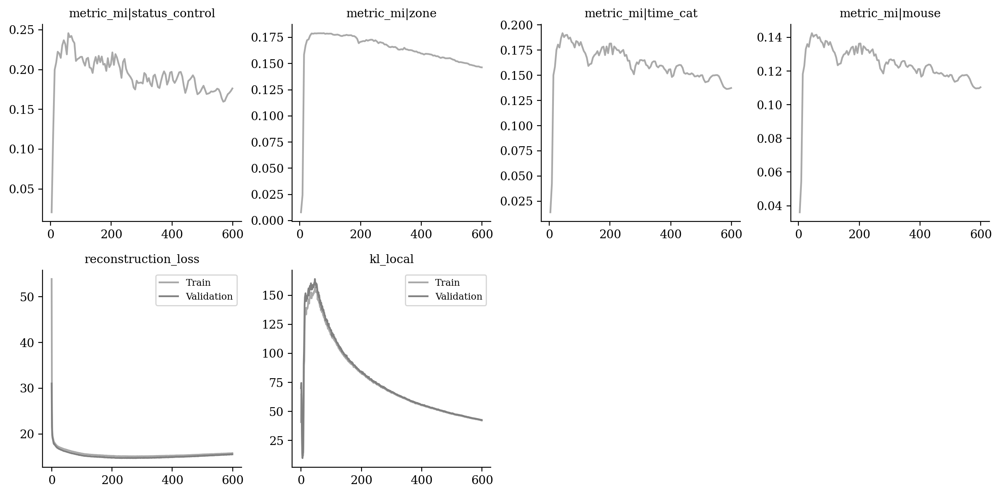

In [15]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|status_control", "metric_mi|zone", "metric_mi|time_cat", "metric_mi|mouse",
                 "reconstruction_loss", "kl_local"]
)

In [16]:
from tardis._disentanglementmanager import DisentanglementManager as DM

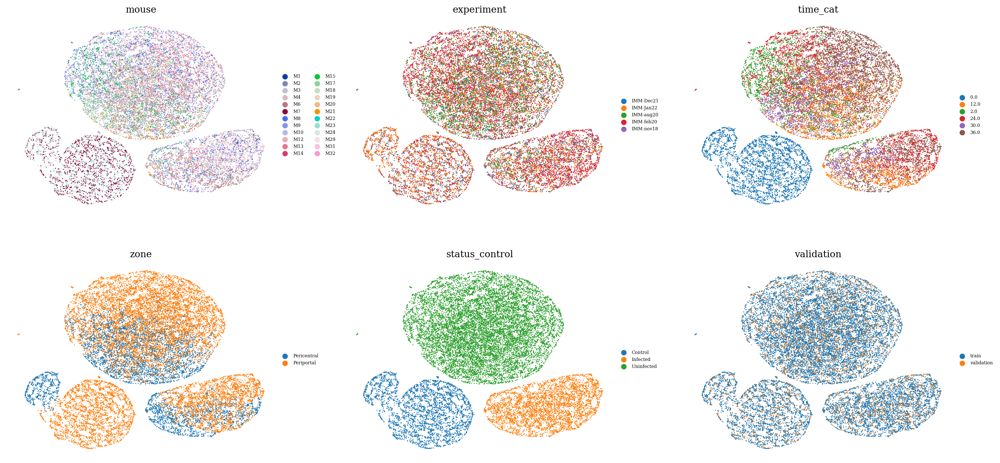

In [17]:
sublatent = DM.configurations.get_by_obs_key("status_control").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

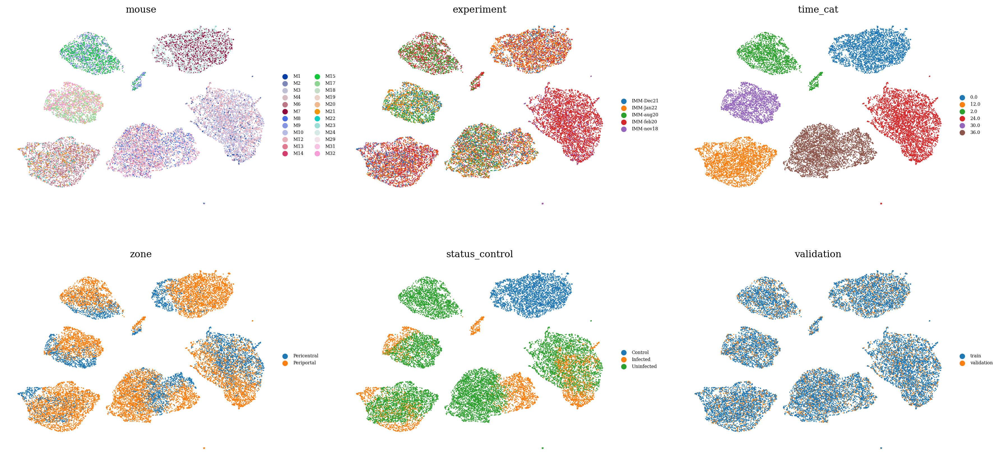

In [18]:
sublatent = DM.configurations.get_by_obs_key("time_cat").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

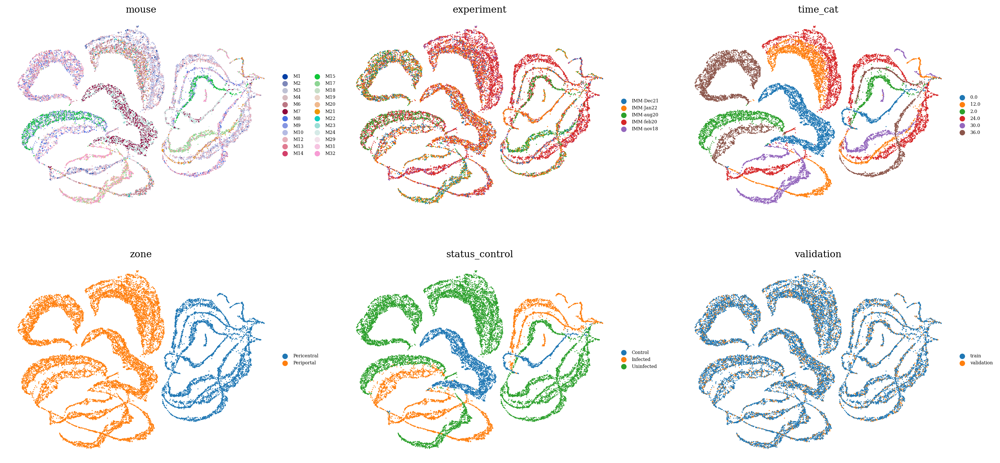

In [19]:
sublatent = DM.configurations.get_by_obs_key("zone").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

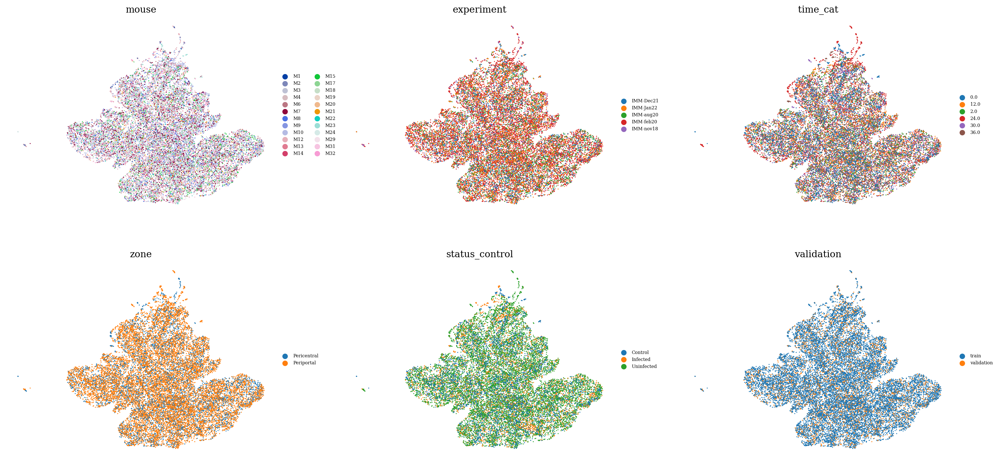

In [20]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

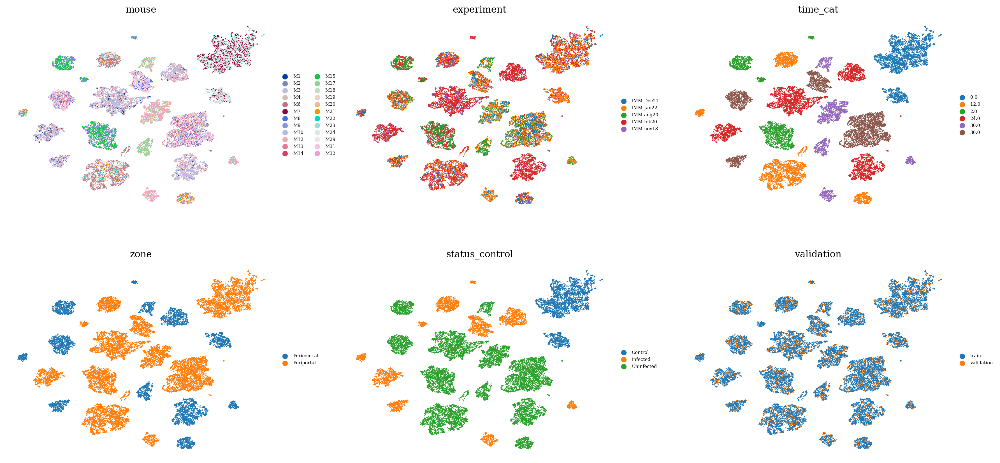

In [21]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

In [22]:
data = vae.get_latent_representation()

import sklearn
factors_indices = sorted([[indice, config.obs_key] for config in DM.configurations.items for indice in config.reserved_latent_indices])
factors = np.vstack([sklearn.preprocessing.LabelEncoder().fit_transform(
    adata.obs[j].copy().astype(str).values.flatten()
) for i, j in factors_indices]).T

data = data[:, [i for i, j in factors_indices]]

maxMIG = vae.get_MI_precalculated(data=data, factors=factors, variation="maxMIG", discretization_bins=256)
maxMIG_mean = np.mean(maxMIG)
maxMIG_mean

0.8599263946577173

In [23]:
data = vae.get_latent_representation()

import sklearn
factors_indices = sorted([[indice, config.obs_key] for config in DM.configurations.items for indice in config.reserved_latent_indices])
factors = np.vstack([sklearn.preprocessing.LabelEncoder().fit_transform(
    adata.obs[j].copy().astype(str).values.flatten()
) for i, j in factors_indices]).T

data = data[:, [i for i, j in factors_indices]]

maxMIG = vae.get_MI_precalculated(data=data[vae.validation_indices, :], factors=factors[vae.validation_indices, :], variation="maxMIG", discretization_bins=256)
maxMIG_mean = np.mean(maxMIG)
maxMIG_mean

0.817269049390855

In [24]:
vae.get_MI_normalized_training("zone")

{('validation', 'reserved'): 0.9967459799806665,
 ('validation', 'unreserved'): 0.14553485495864138,
 ('train', 'reserved'): 0.9994482664976134,
 ('train', 'unreserved'): 0.10405414693074144}

In [25]:
vae.get_MI_normalized_training("status_control")

{('validation', 'reserved'): 0.9690373967639687,
 ('validation', 'unreserved'): 0.24291406591086578,
 ('train', 'reserved'): 0.9677511329843541,
 ('train', 'unreserved'): 0.19290927566930963}

In [26]:
vae.get_MI_normalized_training("time_cat")

{('validation', 'reserved'): 0.9721675441062638,
 ('validation', 'unreserved'): 0.21595656884607184,
 ('train', 'reserved'): 0.970041109883679,
 ('train', 'unreserved'): 0.14171950842670308}